## Habilitar el acceso de IMAP y generar credenciales



In [1]:
import imaplib #Importamos las librerias correspondientes 
import email

from email.header import decode_header

import pandas as pd
from tqdm import tqdm #Esto para medir cuanto se demora en la extracion de los correos de Gmail

import numpy as np
from PIL import Image

import matplotlib.pyplot as alt 
from matplotlib.colors import LinearSegmentedColormap
from wordcloud import WordCloud, STOPWORDS


## Acceder a Gmail con las credenciales 

In [2]:
user, password ="juanea26a@gmail.com","uwgehkjnxyyfnksj"

imap_url='imap.gmail.com'
my_mail=imaplib.IMAP4_SSL(imap_url)
my_mail.login(user,password)

('OK', [b'juanea26a@gmail.com authenticated (Success)'])

In [3]:
# Seleccionamos los correos de la bandeja de entrada  
my_mail.select('Inbox')

('OK', [b'30100'])

In [4]:
total_correos = int(my_mail.select('Inbox')[1][0].decode('utf-8'))
total_correos

30100

## Paso 2: Obtener correos electronicos

In [5]:
arr=my_mail.fetch('3','(UID RFC822)')[1][0] #correos mapeados, la marca de UID hace referencia a la sintaxis 
#Obtenemos una tupla 
#Se coloca [][][] para acceder los elementos desados en esta tupla

email.message_from_string(str(arr[1],'utf-8'))['from'] # en esta parte podemos extraer los datos nesecarios, como en este caso quien lo envio

'YouTube <noreply@youtube.com>'

<h3>Creaciòn de un DateFrame</h3>

In [6]:
email_df = pd.DataFrame(columns=['Date','From','Subject'], index=range(total_correos,0,-1))

for i in tqdm(range(total_correos, 0, -1)):
    data = my_mail.fetch(str(i),'(UID RFC822)')
    arr = data[1][0]
    if isinstance(arr, tuple):
        try: msg = email.message_from_string(str(arr[1],'utf-8'))
        except: msg = email.message_from_string(str(arr[1],'latin-1'))
        new_row = pd.Series({"Date":msg['Date'] , "From":msg['from'], "Subject":msg['subject']})
    email_df = email_df.append(new_row, ignore_index=True)
    
email_df = email_df.dropna(how='all').reset_index(drop=True) # Limpiar filas vacías
email_df

  0%|                                                                                        | 0/30100 [00:00<?, ?it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|                                                                              | 1/30100 [00:00<4:26:38,  1.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|                                                                             | 2/30100 [00:05<24:51:37,  2.97s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  0%|                                                                             | 22/30100 [00:17<2:31:02,  3.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|                                                                             | 23/30100 [00:18<2:37:10,  3.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|                                                                             | 24/30100 [00:18<2:30:19,  3.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  0%|                                                                             | 44/30100 [00:26<2:23:16,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|                                                                             | 45/30100 [00:26<2:14:06,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|                                                                             | 46/30100 [00:26<2:08:53,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  0%|▏                                                                            | 66/30100 [00:33<2:06:30,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|▏                                                                            | 67/30100 [00:33<2:10:58,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|▏                                                                            | 68/30100 [00:34<2:12:26,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  0%|▏                                                                            | 88/30100 [00:40<3:03:19,  2.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|▏                                                                            | 89/30100 [00:40<2:41:38,  3.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|▏                                                                            | 90/30100 [00:41<2:33:04,  3.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  0%|▎                                                                           | 110/30100 [00:46<2:24:21,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|▎                                                                           | 111/30100 [00:46<2:25:17,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|▎                                                                           | 112/30100 [00:47<2:19:47,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  0%|▎                                                                           | 132/30100 [00:54<2:53:18,  2.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|▎                                                                           | 133/30100 [00:55<2:48:58,  2.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  0%|▎                                                                           | 134/30100 [00:55<2:34:07,  3.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▍                                                                           | 154/30100 [01:00<2:29:37,  3.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▍                                                                           | 155/30100 [01:01<2:21:04,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▍                                                                           | 156/30100 [01:01<2:28:37,  3.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▍                                                                           | 176/30100 [01:06<2:12:37,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▍                                                                           | 177/30100 [01:06<2:21:28,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▍                                                                           | 178/30100 [01:07<2:32:36,  3.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▍                                                                           | 198/30100 [01:12<2:17:31,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▌                                                                           | 199/30100 [01:12<2:19:06,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▌                                                                           | 200/30100 [01:13<2:14:55,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▌                                                                           | 220/30100 [01:18<2:06:17,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▌                                                                           | 221/30100 [01:18<2:03:52,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▌                                                                           | 222/30100 [01:18<2:02:49,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▌                                                                           | 242/30100 [01:24<2:15:45,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▌                                                                           | 243/30100 [01:24<2:18:06,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▌                                                                           | 244/30100 [01:24<2:13:25,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▋                                                                           | 264/30100 [01:30<2:23:52,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▋                                                                           | 265/30100 [01:30<2:19:39,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▋                                                                           | 266/30100 [01:31<2:22:20,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▋                                                                           | 286/30100 [01:36<2:16:11,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▋                                                                           | 287/30100 [01:36<2:16:13,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▋                                                                           | 288/30100 [01:37<2:26:47,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▊                                                                           | 308/30100 [01:42<2:10:22,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▊                                                                           | 309/30100 [01:42<2:07:23,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▊                                                                           | 310/30100 [01:42<2:08:37,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▊                                                                           | 330/30100 [01:48<2:11:46,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▊                                                                           | 331/30100 [01:48<2:07:14,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▊                                                                           | 332/30100 [01:48<2:02:34,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▉                                                                           | 352/30100 [01:53<2:10:44,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▉                                                                           | 353/30100 [01:54<2:09:36,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▉                                                                           | 354/30100 [01:55<5:14:19,  1.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▉                                                                           | 374/30100 [02:02<2:23:28,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▉                                                                           | 375/30100 [02:02<2:23:50,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|▉                                                                           | 376/30100 [02:03<2:20:22,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|▉                                                                           | 396/30100 [02:08<2:05:24,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|█                                                                           | 397/30100 [02:08<2:04:01,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|█                                                                           | 398/30100 [02:08<2:10:20,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|█                                                                           | 418/30100 [02:14<2:15:25,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|█                                                                           | 419/30100 [02:14<2:08:20,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|█                                                                           | 420/30100 [02:14<2:06:47,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  1%|█                                                                           | 440/30100 [02:20<2:13:11,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|█                                                                           | 441/30100 [02:20<2:20:50,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  1%|█                                                                           | 442/30100 [02:20<2:11:48,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▏                                                                          | 462/30100 [02:26<2:04:05,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▏                                                                          | 463/30100 [02:26<2:13:50,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▏                                                                          | 464/30100 [02:26<2:18:02,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▏                                                                          | 484/30100 [02:31<2:08:50,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▏                                                                          | 485/30100 [02:32<2:12:50,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▏                                                                          | 486/30100 [02:32<2:18:54,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▎                                                                          | 506/30100 [02:38<2:00:37,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▎                                                                          | 507/30100 [02:38<2:05:59,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▎                                                                          | 508/30100 [02:38<2:05:53,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▎                                                                          | 528/30100 [02:44<2:06:02,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▎                                                                          | 529/30100 [02:44<2:03:26,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▎                                                                          | 530/30100 [02:44<2:04:41,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▍                                                                          | 550/30100 [02:50<2:14:20,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▍                                                                          | 551/30100 [02:50<2:21:47,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▍                                                                          | 552/30100 [02:50<2:15:43,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▍                                                                          | 572/30100 [02:55<2:08:21,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▍                                                                          | 573/30100 [02:56<2:06:19,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▍                                                                          | 574/30100 [02:56<2:10:03,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▍                                                                          | 594/30100 [03:02<3:27:17,  2.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▌                                                                          | 595/30100 [03:02<3:04:27,  2.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▌                                                                          | 596/30100 [03:03<2:45:34,  2.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▌                                                                          | 616/30100 [03:08<2:07:58,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▌                                                                          | 617/30100 [03:08<2:13:19,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▌                                                                          | 618/30100 [03:09<2:18:35,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▌                                                                          | 638/30100 [03:14<2:11:33,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▌                                                                          | 639/30100 [03:14<2:09:39,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▌                                                                          | 640/30100 [03:15<2:05:13,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▋                                                                          | 660/30100 [03:24<6:48:10,  1.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▋                                                                          | 661/30100 [03:24<5:25:43,  1.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▋                                                                          | 662/30100 [03:25<4:29:32,  1.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▋                                                                          | 682/30100 [03:30<2:06:04,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▋                                                                          | 683/30100 [03:30<2:15:34,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▋                                                                          | 684/30100 [03:30<2:20:57,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▊                                                                          | 704/30100 [03:36<2:04:05,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▊                                                                          | 705/30100 [03:36<2:03:58,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▊                                                                          | 706/30100 [03:36<2:03:33,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▊                                                                          | 726/30100 [03:42<2:19:33,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▊                                                                          | 727/30100 [03:42<2:17:35,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▊                                                                          | 728/30100 [03:42<2:13:12,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  2%|█▉                                                                          | 748/30100 [03:47<2:01:19,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▉                                                                          | 749/30100 [03:48<1:57:57,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  2%|█▉                                                                          | 750/30100 [03:48<1:58:37,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|█▉                                                                          | 770/30100 [04:49<2:49:20,  2.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|█▉                                                                          | 771/30100 [04:49<2:37:53,  3.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|█▉                                                                          | 772/30100 [04:50<2:36:44,  3.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|█▉                                                                          | 792/30100 [04:56<2:45:34,  2.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██                                                                          | 793/30100 [04:56<2:35:17,  3.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██                                                                          | 794/30100 [04:56<2:25:04,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██                                                                          | 814/30100 [05:01<2:23:44,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██                                                                          | 815/30100 [05:02<2:24:34,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██                                                                          | 816/30100 [05:02<2:19:03,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██                                                                          | 836/30100 [05:07<2:04:13,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██                                                                          | 837/30100 [05:10<8:10:35,  1.01s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██                                                                          | 838/30100 [05:10<6:16:08,  1.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██▏                                                                         | 858/30100 [05:15<1:58:04,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▏                                                                         | 859/30100 [05:15<2:04:47,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▏                                                                         | 860/30100 [05:16<2:13:52,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██▏                                                                         | 880/30100 [05:21<2:04:29,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▏                                                                         | 881/30100 [05:21<2:04:39,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▏                                                                         | 882/30100 [05:22<2:12:30,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██▎                                                                         | 902/30100 [05:27<2:26:15,  3.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▎                                                                         | 903/30100 [05:27<2:16:13,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▎                                                                         | 904/30100 [05:28<2:14:04,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██▎                                                                         | 924/30100 [05:33<2:13:17,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▎                                                                         | 925/30100 [05:33<2:13:19,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▎                                                                         | 926/30100 [05:33<2:19:29,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██▍                                                                         | 946/30100 [05:39<2:19:44,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▍                                                                         | 947/30100 [05:40<2:20:48,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▍                                                                         | 948/30100 [05:40<2:13:15,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██▍                                                                         | 968/30100 [05:45<2:04:08,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▍                                                                         | 969/30100 [05:45<2:07:34,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▍                                                                         | 970/30100 [05:46<2:15:46,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██▍                                                                         | 990/30100 [05:51<2:15:54,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▌                                                                         | 991/30100 [05:51<2:26:01,  3.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▌                                                                         | 992/30100 [05:51<2:18:42,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██▌                                                                        | 1012/30100 [05:57<2:14:10,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▌                                                                        | 1013/30100 [05:57<2:14:55,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▌                                                                        | 1014/30100 [05:57<2:11:00,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  3%|██▌                                                                        | 1034/30100 [06:03<2:25:34,  3.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▌                                                                        | 1035/30100 [06:03<2:23:28,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  3%|██▌                                                                        | 1036/30100 [06:03<2:23:36,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|██▋                                                                        | 1056/30100 [06:09<2:17:04,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▋                                                                        | 1057/30100 [06:09<2:14:15,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▋                                                                        | 1058/30100 [06:09<2:17:16,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|██▋                                                                        | 1078/30100 [06:15<2:08:03,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▋                                                                        | 1079/30100 [06:15<2:08:32,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▋                                                                        | 1080/30100 [06:15<2:05:04,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|██▋                                                                        | 1100/30100 [06:21<2:18:13,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▋                                                                        | 1101/30100 [06:21<2:17:56,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▋                                                                        | 1102/30100 [06:21<2:11:13,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|██▊                                                                        | 1122/30100 [06:27<2:13:50,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▊                                                                        | 1123/30100 [06:27<2:21:30,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▊                                                                        | 1124/30100 [06:27<2:16:17,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|██▊                                                                        | 1144/30100 [06:33<2:05:07,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▊                                                                        | 1145/30100 [06:33<2:11:42,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▊                                                                        | 1146/30100 [06:33<2:10:26,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|██▉                                                                        | 1166/30100 [06:39<2:12:13,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▉                                                                        | 1167/30100 [06:39<2:06:49,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▉                                                                        | 1168/30100 [06:39<2:03:08,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|██▉                                                                        | 1188/30100 [06:45<2:08:50,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▉                                                                        | 1189/30100 [06:45<2:02:25,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|██▉                                                                        | 1190/30100 [06:46<1:59:33,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|███                                                                        | 1210/30100 [06:51<2:11:44,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███                                                                        | 1211/30100 [06:51<2:15:17,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███                                                                        | 1212/30100 [06:52<2:14:24,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|███                                                                        | 1232/30100 [06:57<2:17:53,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███                                                                        | 1233/30100 [06:58<2:13:58,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███                                                                        | 1234/30100 [06:58<2:20:04,  3.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|███                                                                        | 1254/30100 [07:03<2:05:13,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███▏                                                                       | 1255/30100 [07:03<2:04:24,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███▏                                                                       | 1256/30100 [07:04<2:04:48,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|███▏                                                                       | 1276/30100 [07:09<2:01:55,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███▏                                                                       | 1277/30100 [07:09<2:01:36,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███▏                                                                       | 1278/30100 [07:10<2:08:00,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|███▏                                                                       | 1298/30100 [07:15<2:22:19,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███▏                                                                       | 1299/30100 [07:15<2:23:02,  3.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███▏                                                                       | 1300/30100 [07:16<2:18:16,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|███▎                                                                       | 1320/30100 [07:21<2:07:06,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███▎                                                                       | 1321/30100 [07:21<2:06:32,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███▎                                                                       | 1322/30100 [07:22<2:14:37,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  4%|███▎                                                                       | 1342/30100 [07:27<2:01:34,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███▎                                                                       | 1343/30100 [07:27<2:02:30,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  4%|███▎                                                                       | 1344/30100 [07:28<2:02:37,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▍                                                                       | 1364/30100 [07:33<2:21:41,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▍                                                                       | 1365/30100 [07:33<2:22:08,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▍                                                                       | 1366/30100 [07:34<2:13:51,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▍                                                                       | 1386/30100 [07:39<2:11:31,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▍                                                                       | 1387/30100 [07:39<2:15:25,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▍                                                                       | 1388/30100 [07:40<2:21:38,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▌                                                                       | 1408/30100 [07:45<2:07:39,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▌                                                                       | 1409/30100 [07:45<2:05:12,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▌                                                                       | 1410/30100 [07:46<2:00:12,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▌                                                                       | 1430/30100 [07:52<2:46:47,  2.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▌                                                                       | 1431/30100 [07:52<2:33:52,  3.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▌                                                                       | 1432/30100 [07:52<2:23:57,  3.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▌                                                                       | 1452/30100 [07:59<2:24:32,  3.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▌                                                                       | 1453/30100 [07:59<2:14:16,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▌                                                                       | 1454/30100 [08:00<2:23:33,  3.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▋                                                                       | 1474/30100 [08:05<2:10:50,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▋                                                                       | 1475/30100 [08:05<2:05:22,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▋                                                                       | 1476/30100 [08:06<2:10:16,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▋                                                                       | 1496/30100 [08:11<2:10:48,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▋                                                                       | 1497/30100 [08:11<2:07:56,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▋                                                                       | 1498/30100 [08:12<2:00:51,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▊                                                                       | 1518/30100 [08:17<2:08:50,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▊                                                                       | 1519/30100 [08:17<2:04:12,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▊                                                                       | 1520/30100 [08:18<2:13:52,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▊                                                                       | 1540/30100 [08:23<2:06:53,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▊                                                                       | 1541/30100 [08:23<2:04:13,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▊                                                                       | 1542/30100 [08:23<2:12:17,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▉                                                                       | 1562/30100 [08:29<2:07:44,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▉                                                                       | 1563/30100 [08:29<2:03:40,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▉                                                                       | 1564/30100 [08:29<2:04:13,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|███▉                                                                       | 1584/30100 [08:35<2:23:05,  3.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▉                                                                       | 1585/30100 [08:36<2:15:40,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|███▉                                                                       | 1586/30100 [08:36<2:11:19,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|████                                                                       | 1606/30100 [08:41<2:11:38,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|████                                                                       | 1607/30100 [08:41<2:13:11,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|████                                                                       | 1608/30100 [08:42<2:09:19,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|████                                                                       | 1628/30100 [08:47<2:07:00,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|████                                                                       | 1629/30100 [08:47<2:04:54,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|████                                                                       | 1630/30100 [08:48<2:05:52,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  5%|████                                                                       | 1650/30100 [08:53<2:06:14,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|████                                                                       | 1651/30100 [08:54<2:04:33,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  5%|████                                                                       | 1652/30100 [08:54<2:01:02,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▏                                                                      | 1672/30100 [08:59<1:59:26,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▏                                                                      | 1673/30100 [08:59<1:59:36,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▏                                                                      | 1674/30100 [09:00<1:57:41,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▏                                                                      | 1694/30100 [09:05<1:57:18,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▏                                                                      | 1695/30100 [09:06<2:03:02,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▏                                                                      | 1696/30100 [09:06<2:11:25,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▎                                                                      | 1716/30100 [09:11<1:59:57,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▎                                                                      | 1717/30100 [09:12<2:12:28,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▎                                                                      | 1718/30100 [09:12<2:06:55,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▎                                                                      | 1738/30100 [09:18<2:07:11,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▎                                                                      | 1739/30100 [09:18<2:02:30,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▎                                                                      | 1740/30100 [09:19<2:04:28,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▍                                                                      | 1760/30100 [09:24<2:22:06,  3.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▍                                                                      | 1761/30100 [09:25<2:24:07,  3.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▍                                                                      | 1762/30100 [09:25<2:21:07,  3.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▍                                                                      | 1782/30100 [09:30<2:15:44,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▍                                                                      | 1783/30100 [09:31<2:09:20,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▍                                                                      | 1784/30100 [09:31<2:05:14,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▍                                                                      | 1804/30100 [09:36<2:09:26,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▍                                                                      | 1805/30100 [09:37<2:03:27,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▌                                                                      | 1806/30100 [09:37<2:01:55,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▌                                                                      | 1826/30100 [09:42<1:58:49,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▌                                                                      | 1827/30100 [09:42<1:58:39,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▌                                                                      | 1828/30100 [09:43<1:56:18,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▌                                                                      | 1848/30100 [09:48<2:03:18,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▌                                                                      | 1849/30100 [09:48<2:04:47,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▌                                                                      | 1850/30100 [09:49<2:07:04,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▋                                                                      | 1870/30100 [09:54<2:00:02,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▋                                                                      | 1871/30100 [09:54<2:06:14,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▋                                                                      | 1872/30100 [09:54<2:09:27,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▋                                                                      | 1892/30100 [10:00<2:07:46,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▋                                                                      | 1893/30100 [10:00<2:04:26,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▋                                                                      | 1894/30100 [10:00<2:04:33,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▊                                                                      | 1914/30100 [10:06<2:06:13,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▊                                                                      | 1915/30100 [10:06<2:04:19,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▊                                                                      | 1916/30100 [10:06<2:08:21,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  6%|████▊                                                                      | 1936/30100 [10:12<2:08:31,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▊                                                                      | 1937/30100 [10:12<2:13:02,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  6%|████▊                                                                      | 1938/30100 [10:13<2:14:07,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|████▉                                                                      | 1958/30100 [10:18<2:12:46,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|████▉                                                                      | 1959/30100 [10:19<2:09:12,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|████▉                                                                      | 1960/30100 [10:19<2:03:55,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|████▉                                                                      | 1980/30100 [10:25<2:25:59,  3.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|████▉                                                                      | 1981/30100 [10:25<2:17:29,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|████▉                                                                      | 1982/30100 [10:26<2:19:08,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|████▉                                                                      | 2002/30100 [10:31<2:02:06,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|████▉                                                                      | 2003/30100 [10:31<1:57:47,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|████▉                                                                      | 2004/30100 [10:32<1:56:52,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████                                                                      | 2024/30100 [10:37<2:06:16,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████                                                                      | 2025/30100 [10:37<1:59:16,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████                                                                      | 2026/30100 [10:37<2:05:16,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████                                                                      | 2046/30100 [10:43<2:00:56,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████                                                                      | 2047/30100 [10:43<2:05:55,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████                                                                      | 2048/30100 [10:43<2:02:33,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████▏                                                                     | 2068/30100 [10:49<2:05:17,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▏                                                                     | 2069/30100 [10:49<2:10:29,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▏                                                                     | 2070/30100 [10:49<2:03:25,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████▏                                                                     | 2090/30100 [10:55<2:01:37,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▏                                                                     | 2091/30100 [10:55<2:10:57,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▏                                                                     | 2092/30100 [10:55<2:08:02,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████▎                                                                     | 2112/30100 [11:01<2:04:12,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▎                                                                     | 2113/30100 [11:01<2:02:05,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▎                                                                     | 2114/30100 [11:01<2:07:55,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████▎                                                                     | 2134/30100 [11:07<2:11:16,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▎                                                                     | 2135/30100 [11:07<2:07:24,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▎                                                                     | 2136/30100 [11:07<2:07:39,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████▎                                                                     | 2156/30100 [11:13<2:17:59,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▎                                                                     | 2157/30100 [11:13<2:13:22,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▍                                                                     | 2158/30100 [11:13<2:15:57,  3.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████▍                                                                     | 2178/30100 [11:20<2:16:12,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▍                                                                     | 2179/30100 [11:20<2:10:21,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▍                                                                     | 2180/30100 [11:21<2:09:49,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████▍                                                                     | 2200/30100 [11:26<2:00:45,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▍                                                                     | 2201/30100 [11:26<1:58:38,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▍                                                                     | 2202/30100 [11:26<1:57:16,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████▌                                                                     | 2222/30100 [11:32<1:52:06,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▌                                                                     | 2223/30100 [11:32<1:55:10,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▌                                                                     | 2224/30100 [11:32<1:56:36,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  7%|█████▌                                                                     | 2244/30100 [11:44<2:43:40,  2.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▌                                                                    | 2245/30100 [11:50<17:01:13,  2.20s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  7%|█████▌                                                                    | 2246/30100 [11:50<12:36:45,  1.63s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|█████▋                                                                     | 2266/30100 [11:56<2:05:36,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▋                                                                     | 2267/30100 [11:56<2:09:03,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▋                                                                     | 2268/30100 [11:56<2:11:45,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|█████▋                                                                     | 2288/30100 [12:03<2:01:49,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▋                                                                     | 2289/30100 [12:04<2:03:21,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▋                                                                     | 2290/30100 [12:04<2:04:55,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|█████▊                                                                     | 2310/30100 [12:10<3:03:53,  2.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▊                                                                     | 2311/30100 [12:12<6:49:23,  1.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▊                                                                     | 2312/30100 [12:12<5:20:46,  1.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|█████▊                                                                     | 2332/30100 [12:19<2:29:00,  3.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▊                                                                     | 2333/30100 [12:19<2:16:06,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▊                                                                     | 2334/30100 [12:20<2:09:17,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|█████▊                                                                     | 2354/30100 [12:25<1:57:23,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▊                                                                     | 2355/30100 [12:28<7:48:43,  1.01s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▊                                                                     | 2356/30100 [12:28<6:09:09,  1.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|█████▉                                                                     | 2376/30100 [12:33<1:58:14,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▉                                                                     | 2377/30100 [12:34<1:57:44,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▉                                                                     | 2378/30100 [12:34<1:57:04,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|█████▉                                                                     | 2398/30100 [12:39<1:55:29,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▉                                                                     | 2399/30100 [12:39<1:54:04,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|█████▉                                                                     | 2400/30100 [12:39<1:55:38,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|██████                                                                     | 2420/30100 [12:44<2:03:18,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████                                                                     | 2421/30100 [12:45<2:02:59,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████                                                                     | 2422/30100 [12:45<2:04:50,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|██████                                                                     | 2442/30100 [12:50<2:16:52,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████                                                                     | 2443/30100 [12:51<2:09:48,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████                                                                     | 2444/30100 [12:51<2:05:02,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|██████▏                                                                    | 2464/30100 [12:57<1:59:52,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████▏                                                                    | 2465/30100 [12:57<2:02:28,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████▏                                                                    | 2466/30100 [12:57<1:59:26,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|██████▏                                                                    | 2486/30100 [13:03<2:04:22,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████▏                                                                    | 2487/30100 [13:03<2:02:42,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████▏                                                                    | 2488/30100 [13:03<2:07:01,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|██████▏                                                                    | 2508/30100 [13:09<2:03:46,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████▎                                                                    | 2509/30100 [13:09<2:03:53,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████▎                                                                    | 2510/30100 [13:10<2:07:04,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|██████▎                                                                    | 2530/30100 [13:21<2:05:35,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████▎                                                                    | 2531/30100 [13:21<2:10:04,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████▎                                                                    | 2532/30100 [13:22<2:05:12,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  8%|██████▎                                                                    | 2552/30100 [13:33<2:28:37,  3.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████▎                                                                    | 2553/30100 [13:33<2:21:22,  3.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  8%|██████▎                                                                    | 2554/30100 [13:36<8:04:00,  1.05s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▍                                                                    | 2574/30100 [13:43<2:41:50,  2.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▎                                                                   | 2575/30100 [13:50<16:50:40,  2.20s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▎                                                                   | 2576/30100 [13:50<12:23:14,  1.62s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▍                                                                    | 2596/30100 [14:03<3:31:01,  2.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▍                                                                    | 2597/30100 [14:03<3:12:31,  2.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▍                                                                    | 2598/30100 [14:03<2:54:30,  2.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▌                                                                    | 2618/30100 [14:10<2:52:37,  2.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▌                                                                    | 2619/30100 [14:10<2:35:28,  2.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▌                                                                    | 2620/30100 [14:10<2:21:40,  3.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▌                                                                    | 2640/30100 [14:16<2:17:44,  3.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▌                                                                    | 2641/30100 [14:16<2:18:01,  3.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▌                                                                    | 2642/30100 [14:16<2:18:25,  3.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▋                                                                    | 2662/30100 [14:22<2:12:32,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▋                                                                    | 2663/30100 [14:22<2:17:18,  3.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▋                                                                    | 2664/30100 [14:23<2:15:37,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▋                                                                    | 2684/30100 [14:36<2:41:57,  2.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▋                                                                    | 2685/30100 [14:36<2:29:22,  3.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▋                                                                    | 2686/30100 [14:36<2:18:49,  3.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▋                                                                    | 2706/30100 [14:42<2:02:59,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▋                                                                    | 2707/30100 [14:42<2:07:12,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▋                                                                    | 2708/30100 [14:42<2:09:57,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▊                                                                    | 2728/30100 [14:48<2:15:10,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▊                                                                    | 2729/30100 [14:48<2:14:03,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▊                                                                    | 2730/30100 [14:49<2:12:28,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▊                                                                    | 2750/30100 [14:54<1:59:41,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▊                                                                    | 2751/30100 [14:55<1:58:32,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▊                                                                    | 2752/30100 [14:55<3:37:41,  2.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▉                                                                    | 2772/30100 [15:03<2:46:14,  2.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▉                                                                    | 2773/30100 [15:04<2:30:16,  3.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▉                                                                    | 2774/30100 [15:04<2:20:17,  3.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|██████▉                                                                    | 2794/30100 [15:10<2:08:14,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▉                                                                    | 2795/30100 [15:10<2:04:35,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|██████▉                                                                    | 2796/30100 [15:10<2:14:51,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|███████                                                                    | 2816/30100 [15:16<2:17:13,  3.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|███████                                                                    | 2817/30100 [15:16<2:07:36,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|███████                                                                    | 2818/30100 [15:17<2:10:48,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

  9%|███████                                                                    | 2838/30100 [15:23<2:11:44,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|███████                                                                    | 2839/30100 [15:23<2:11:31,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
  9%|███████                                                                    | 2840/30100 [15:23<2:07:40,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▏                                                                   | 2860/30100 [15:29<2:03:21,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▏                                                                   | 2861/30100 [15:29<2:02:02,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▏                                                                   | 2862/30100 [15:29<2:00:01,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▏                                                                   | 2882/30100 [15:35<2:08:36,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▏                                                                   | 2883/30100 [15:35<2:06:21,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▏                                                                   | 2884/30100 [15:35<2:02:45,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▏                                                                   | 2904/30100 [15:43<2:07:59,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▏                                                                   | 2905/30100 [15:43<2:12:51,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▏                                                                   | 2906/30100 [15:43<2:07:57,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▎                                                                   | 2926/30100 [15:49<1:59:46,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▎                                                                   | 2927/30100 [15:49<2:00:49,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▎                                                                   | 2928/30100 [15:49<2:01:07,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▎                                                                   | 2948/30100 [15:56<2:12:15,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▎                                                                   | 2949/30100 [15:57<2:10:03,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▎                                                                   | 2950/30100 [15:57<2:07:16,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▍                                                                   | 2970/30100 [16:03<2:09:40,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▍                                                                   | 2971/30100 [16:03<2:11:31,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▍                                                                   | 2972/30100 [16:03<2:05:11,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▍                                                                   | 2992/30100 [16:09<2:10:14,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▍                                                                   | 2993/30100 [16:09<2:10:31,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▍                                                                   | 2994/30100 [16:10<2:13:00,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▌                                                                   | 3014/30100 [16:15<2:05:57,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▌                                                                   | 3015/30100 [16:16<2:02:14,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▌                                                                   | 3016/30100 [16:16<2:00:09,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▌                                                                   | 3036/30100 [16:24<2:25:14,  3.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▌                                                                   | 3037/30100 [16:24<2:14:43,  3.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▌                                                                   | 3038/30100 [16:25<2:09:29,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▌                                                                   | 3058/30100 [16:32<2:12:22,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▌                                                                   | 3059/30100 [16:32<2:07:24,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▌                                                                   | 3060/30100 [16:33<2:04:59,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▋                                                                   | 3080/30100 [16:41<2:18:06,  3.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▋                                                                   | 3081/30100 [16:41<2:18:44,  3.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▋                                                                   | 3082/30100 [16:41<2:10:00,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▋                                                                   | 3102/30100 [16:47<2:14:59,  3.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▋                                                                   | 3103/30100 [16:48<2:25:30,  3.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▋                                                                   | 3104/30100 [16:48<2:16:49,  3.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▊                                                                   | 3124/30100 [16:53<2:01:52,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▊                                                                   | 3125/30100 [16:54<1:58:21,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▊                                                                   | 3126/30100 [16:54<1:59:32,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 10%|███████▊                                                                   | 3146/30100 [17:00<2:50:04,  2.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▊                                                                   | 3147/30100 [17:00<2:36:39,  2.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 10%|███████▊                                                                   | 3148/30100 [17:01<2:31:08,  2.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|███████▉                                                                   | 3168/30100 [17:07<2:18:15,  3.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|███████▉                                                                   | 3169/30100 [17:07<2:15:25,  3.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|███████▉                                                                   | 3170/30100 [17:08<4:53:29,  1.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|███████▉                                                                   | 3190/30100 [17:16<2:07:05,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|███████▉                                                                   | 3191/30100 [17:16<3:14:24,  2.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|███████▉                                                                   | 3192/30100 [17:17<2:59:01,  2.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████                                                                   | 3212/30100 [17:24<2:19:00,  3.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████                                                                   | 3213/30100 [17:24<2:18:34,  3.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████                                                                   | 3214/30100 [17:24<2:12:08,  3.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████                                                                   | 3234/30100 [17:31<2:13:31,  3.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████                                                                   | 3235/30100 [17:31<2:04:54,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████                                                                   | 3236/30100 [17:31<2:07:53,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████                                                                   | 3256/30100 [17:38<2:14:20,  3.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████                                                                   | 3257/30100 [17:39<2:08:32,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████                                                                   | 3258/30100 [17:39<2:11:51,  3.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████▏                                                                  | 3278/30100 [17:45<2:03:48,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▏                                                                  | 3279/30100 [17:45<2:06:49,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▏                                                                  | 3280/30100 [17:46<2:01:17,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████▏                                                                  | 3300/30100 [17:56<6:20:48,  1.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▏                                                                  | 3301/30100 [17:57<5:01:16,  1.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▏                                                                  | 3302/30100 [17:57<4:09:15,  1.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████▎                                                                  | 3322/30100 [18:03<2:09:08,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▎                                                                  | 3323/30100 [18:03<2:03:49,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▎                                                                  | 3324/30100 [18:04<2:06:04,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████▎                                                                  | 3344/30100 [18:09<1:58:45,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▎                                                                  | 3345/30100 [18:09<1:57:50,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▎                                                                  | 3346/30100 [18:10<1:59:40,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████▍                                                                  | 3366/30100 [18:21<3:03:07,  2.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▍                                                                  | 3367/30100 [18:22<2:40:47,  2.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▍                                                                  | 3368/30100 [18:22<3:24:23,  2.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████▎                                                                 | 3388/30100 [19:43<47:50:27,  6.45s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▎                                                                 | 3389/30100 [19:52<52:46:41,  7.11s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▎                                                                 | 3390/30100 [19:59<51:10:54,  6.90s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████▍                                                                  | 3410/30100 [20:07<1:56:38,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▍                                                                  | 3411/30100 [20:07<1:53:57,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▌                                                                  | 3412/30100 [20:08<3:44:07,  1.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████▌                                                                  | 3432/30100 [20:13<1:54:31,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▌                                                                  | 3433/30100 [20:14<1:54:14,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▌                                                                  | 3434/30100 [20:14<1:54:32,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 11%|████████▌                                                                  | 3454/30100 [20:24<2:15:00,  3.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▌                                                                  | 3455/30100 [20:24<2:09:03,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 11%|████████▌                                                                  | 3456/30100 [20:26<5:42:03,  1.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|████████▋                                                                  | 3476/30100 [20:36<2:02:35,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▋                                                                  | 3477/30100 [20:36<2:08:56,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▋                                                                  | 3478/30100 [20:36<2:03:08,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|████████▋                                                                  | 3498/30100 [20:42<2:01:19,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▋                                                                  | 3499/30100 [20:42<2:01:31,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▋                                                                  | 3500/30100 [20:42<2:11:28,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|████████▊                                                                  | 3520/30100 [20:47<1:51:51,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▊                                                                  | 3521/30100 [20:48<1:52:35,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▊                                                                  | 3522/30100 [20:48<1:54:08,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|████████▊                                                                  | 3542/30100 [20:53<1:58:10,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▊                                                                  | 3543/30100 [20:54<1:53:23,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▊                                                                  | 3544/30100 [20:54<1:52:02,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|████████▉                                                                  | 3564/30100 [20:59<2:01:35,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▉                                                                  | 3565/30100 [20:59<1:56:57,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▉                                                                  | 3566/30100 [21:00<1:54:32,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|████████▉                                                                  | 3586/30100 [21:05<2:02:01,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▉                                                                  | 3587/30100 [21:06<1:59:02,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▉                                                                  | 3588/30100 [21:06<1:55:30,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|████████▉                                                                  | 3608/30100 [21:11<1:57:35,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▉                                                                  | 3609/30100 [21:12<1:56:11,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|████████▉                                                                  | 3610/30100 [21:12<1:58:05,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|█████████                                                                  | 3630/30100 [21:18<2:08:03,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████                                                                  | 3631/30100 [21:18<2:01:39,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████                                                                  | 3632/30100 [21:18<2:00:30,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|█████████                                                                  | 3652/30100 [21:24<1:55:57,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████                                                                  | 3653/30100 [21:24<2:02:59,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████                                                                  | 3654/30100 [21:24<1:59:59,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|█████████▏                                                                 | 3674/30100 [21:30<2:01:02,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████▏                                                                 | 3675/30100 [21:30<2:06:10,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████▏                                                                 | 3676/30100 [21:30<2:04:51,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|█████████▏                                                                 | 3696/30100 [21:36<2:07:27,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████▏                                                                 | 3697/30100 [21:36<2:02:53,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████▏                                                                 | 3698/30100 [21:36<1:58:26,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|█████████▎                                                                 | 3718/30100 [21:41<1:56:23,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████▎                                                                 | 3719/30100 [21:42<1:52:44,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████▎                                                                 | 3720/30100 [21:42<1:51:22,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|█████████▎                                                                 | 3740/30100 [21:47<2:01:00,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████▎                                                                 | 3741/30100 [21:49<5:08:34,  1.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 12%|█████████▎                                                                 | 3742/30100 [21:49<4:13:02,  1.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 12%|█████████▎                                                                 | 3762/30100 [21:55<2:04:58,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▍                                                                 | 3763/30100 [21:55<2:15:00,  3.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▍                                                                 | 3764/30100 [21:56<2:11:01,  3.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▍                                                                 | 3784/30100 [22:01<1:56:49,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▍                                                                 | 3785/30100 [22:02<1:55:44,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▍                                                                 | 3786/30100 [22:02<1:53:13,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▍                                                                 | 3806/30100 [22:07<2:10:13,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▍                                                                 | 3807/30100 [22:08<2:08:21,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▍                                                                 | 3808/30100 [22:08<2:21:49,  3.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▌                                                                 | 3828/30100 [22:14<2:26:49,  2.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▌                                                                 | 3829/30100 [22:15<2:12:36,  3.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▌                                                                 | 3830/30100 [22:15<2:09:30,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▌                                                                 | 3850/30100 [22:21<2:01:39,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▌                                                                 | 3851/30100 [22:21<1:59:04,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▌                                                                 | 3852/30100 [22:21<1:57:36,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▋                                                                 | 3872/30100 [22:27<1:54:06,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▋                                                                 | 3873/30100 [22:27<1:52:36,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▋                                                                 | 3874/30100 [22:27<1:51:34,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▋                                                                 | 3894/30100 [22:34<3:46:44,  1.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▋                                                                 | 3895/30100 [22:34<3:21:51,  2.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▋                                                                 | 3896/30100 [22:35<3:01:32,  2.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▊                                                                 | 3916/30100 [22:40<2:03:51,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▊                                                                 | 3917/30100 [22:41<2:00:26,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▊                                                                 | 3918/30100 [22:41<1:57:28,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▊                                                                 | 3938/30100 [22:46<1:56:58,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▊                                                                 | 3939/30100 [22:47<1:54:12,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▊                                                                 | 3940/30100 [22:48<4:26:58,  1.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▊                                                                 | 3960/30100 [22:54<1:59:27,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▊                                                                 | 3961/30100 [22:54<2:00:29,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▊                                                                 | 3962/30100 [22:54<2:03:17,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▉                                                                 | 3982/30100 [23:00<2:07:19,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▉                                                                 | 3983/30100 [23:00<2:02:03,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▉                                                                 | 3984/30100 [23:00<1:58:16,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|█████████▉                                                                 | 4004/30100 [23:06<2:10:23,  3.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▉                                                                 | 4005/30100 [23:06<2:08:09,  3.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|█████████▉                                                                 | 4006/30100 [23:06<2:10:17,  3.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|██████████                                                                 | 4026/30100 [23:14<2:04:02,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|██████████                                                                 | 4027/30100 [23:15<2:05:22,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|██████████                                                                 | 4028/30100 [23:15<2:10:30,  3.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 13%|██████████                                                                 | 4048/30100 [23:21<2:19:14,  3.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|██████████                                                                 | 4049/30100 [23:21<2:23:30,  3.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 13%|██████████                                                                 | 4050/30100 [23:21<2:13:17,  3.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▏                                                                | 4070/30100 [23:27<2:26:54,  2.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▏                                                                | 4071/30100 [23:27<2:25:08,  2.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▏                                                                | 4072/30100 [23:28<2:20:46,  3.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▏                                                                | 4092/30100 [23:33<1:54:15,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▏                                                                | 4093/30100 [23:33<1:55:13,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▏                                                                | 4094/30100 [23:34<1:57:11,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▎                                                                | 4114/30100 [23:39<2:06:33,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▎                                                                | 4115/30100 [23:40<2:02:14,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▎                                                                | 4116/30100 [23:40<2:00:16,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▎                                                                | 4136/30100 [23:46<1:50:07,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▎                                                                | 4137/30100 [23:46<1:54:08,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▎                                                                | 4138/30100 [23:46<1:53:44,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▎                                                                | 4158/30100 [23:53<2:00:05,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▎                                                                | 4159/30100 [23:54<1:53:54,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▎                                                                | 4160/30100 [23:54<1:57:52,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▍                                                                | 4180/30100 [23:59<1:53:37,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▍                                                                | 4181/30100 [24:00<1:56:43,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▍                                                                | 4182/30100 [24:00<2:56:31,  2.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▍                                                                | 4202/30100 [24:06<1:59:03,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▍                                                                | 4203/30100 [24:06<2:02:58,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▍                                                                | 4204/30100 [24:07<1:58:38,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▌                                                                | 4224/30100 [24:12<2:04:12,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▌                                                                | 4225/30100 [24:13<2:05:20,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▌                                                                | 4226/30100 [24:13<2:02:43,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▌                                                                | 4246/30100 [24:19<2:06:13,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▌                                                                | 4247/30100 [24:19<2:00:40,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▌                                                                | 4248/30100 [24:19<2:01:34,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▋                                                                | 4268/30100 [24:25<1:50:56,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▋                                                                | 4269/30100 [24:25<1:51:25,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▋                                                                | 4270/30100 [24:26<1:51:45,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▋                                                                | 4290/30100 [24:31<2:01:45,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▋                                                                | 4291/30100 [24:31<1:59:14,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▋                                                                | 4292/30100 [24:32<1:55:13,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▋                                                                | 4312/30100 [24:37<1:52:31,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▋                                                                | 4313/30100 [24:37<1:50:06,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▋                                                                | 4314/30100 [24:38<1:53:18,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▊                                                                | 4334/30100 [24:43<1:55:06,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▊                                                                | 4335/30100 [24:44<1:52:16,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▊                                                                | 4336/30100 [24:44<1:52:31,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 14%|██████████▊                                                                | 4356/30100 [24:49<1:51:08,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▊                                                                | 4357/30100 [24:50<1:49:13,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 14%|██████████▊                                                                | 4358/30100 [24:50<1:55:18,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|██████████▉                                                                | 4378/30100 [24:55<1:50:35,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|██████████▉                                                                | 4379/30100 [24:55<1:48:48,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|██████████▉                                                                | 4380/30100 [24:56<1:57:33,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|██████████▉                                                                | 4400/30100 [25:02<2:32:34,  2.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|██████████▉                                                                | 4401/30100 [25:03<2:23:48,  2.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|██████████▉                                                                | 4402/30100 [25:03<2:15:23,  3.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████                                                                | 4422/30100 [25:10<2:04:58,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████                                                                | 4423/30100 [25:10<1:58:33,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████                                                                | 4424/30100 [25:10<1:53:32,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████                                                                | 4444/30100 [25:16<1:57:54,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████                                                                | 4445/30100 [25:16<1:55:40,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████                                                                | 4446/30100 [25:16<1:56:21,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████▏                                                               | 4466/30100 [25:25<3:32:11,  2.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▏                                                               | 4467/30100 [25:26<4:17:24,  1.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▏                                                               | 4468/30100 [25:26<3:55:44,  1.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████▏                                                               | 4488/30100 [25:38<3:28:35,  2.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▏                                                               | 4489/30100 [25:39<3:53:44,  1.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▏                                                               | 4490/30100 [25:39<3:56:21,  1.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████▏                                                               | 4510/30100 [26:00<4:16:52,  1.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▏                                                               | 4511/30100 [26:01<3:43:47,  1.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▏                                                               | 4512/30100 [26:01<3:34:36,  1.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████▎                                                               | 4532/30100 [26:07<1:56:45,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▎                                                               | 4533/30100 [26:08<1:55:37,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▎                                                               | 4534/30100 [26:08<1:54:56,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████▎                                                               | 4554/30100 [26:14<2:52:09,  2.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▎                                                               | 4555/30100 [26:14<2:37:47,  2.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▎                                                               | 4556/30100 [26:15<2:20:59,  3.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████▍                                                               | 4576/30100 [26:20<1:47:06,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▍                                                               | 4577/30100 [26:20<1:51:52,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▍                                                               | 4578/30100 [26:20<1:50:46,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████▍                                                               | 4598/30100 [26:26<1:55:21,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▍                                                               | 4599/30100 [26:26<1:55:45,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▍                                                               | 4600/30100 [26:26<1:52:11,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████▌                                                               | 4620/30100 [26:31<1:47:13,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▌                                                               | 4621/30100 [26:32<1:49:19,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▌                                                               | 4622/30100 [26:32<1:46:48,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████▌                                                               | 4642/30100 [26:37<1:45:47,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▌                                                               | 4643/30100 [26:37<1:47:13,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▌                                                               | 4644/30100 [26:38<1:44:05,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 15%|███████████▌                                                               | 4664/30100 [26:44<1:41:33,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 15%|███████████▌                                                               | 4665/30100 [26:45<1:45:23,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▋                                                               | 4666/30100 [26:45<1:49:01,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|███████████▋                                                               | 4686/30100 [26:50<1:43:37,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▋                                                               | 4687/30100 [26:50<1:44:45,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▋                                                               | 4688/30100 [26:51<1:41:40,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|███████████▋                                                               | 4708/30100 [26:56<1:46:45,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▋                                                               | 4709/30100 [26:56<1:49:17,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▋                                                               | 4710/30100 [26:56<1:45:57,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|███████████▊                                                               | 4730/30100 [27:01<1:45:58,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▊                                                               | 4731/30100 [27:02<1:44:42,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▊                                                               | 4732/30100 [27:02<1:45:31,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|███████████▊                                                               | 4752/30100 [27:07<1:54:59,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▊                                                               | 4753/30100 [27:08<1:51:13,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▊                                                               | 4754/30100 [27:08<1:47:38,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|███████████▉                                                               | 4774/30100 [27:14<2:06:06,  3.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▉                                                               | 4775/30100 [27:15<2:03:23,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▉                                                               | 4776/30100 [27:15<1:56:35,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|███████████▉                                                               | 4796/30100 [27:20<1:45:06,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▉                                                               | 4797/30100 [27:20<2:14:25,  3.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|███████████▉                                                               | 4798/30100 [27:21<2:07:07,  3.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|████████████                                                               | 4818/30100 [27:26<2:28:50,  2.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████                                                               | 4819/30100 [27:27<2:15:29,  3.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████                                                               | 4820/30100 [27:27<2:11:17,  3.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|████████████                                                               | 4840/30100 [27:32<1:54:52,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████                                                               | 4841/30100 [27:32<1:50:39,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████                                                               | 4842/30100 [27:33<1:55:55,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|████████████                                                               | 4862/30100 [27:38<1:50:06,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████                                                               | 4863/30100 [27:38<1:48:34,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████                                                               | 4864/30100 [27:38<1:44:56,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|████████████▏                                                              | 4884/30100 [27:43<1:44:52,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████▏                                                              | 4885/30100 [27:44<1:46:41,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████▏                                                              | 4886/30100 [27:44<1:45:40,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|████████████▏                                                              | 4906/30100 [27:49<1:44:50,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████▏                                                              | 4907/30100 [27:49<1:45:30,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████▏                                                              | 4908/30100 [27:50<1:47:29,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|████████████▎                                                              | 4928/30100 [27:58<5:13:26,  1.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████▎                                                              | 4929/30100 [27:58<4:16:03,  1.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████▎                                                              | 4930/30100 [27:59<3:28:05,  2.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 16%|████████████▎                                                              | 4950/30100 [28:04<1:55:23,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████▎                                                              | 4951/30100 [28:04<1:52:58,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 16%|████████████▎                                                              | 4952/30100 [28:05<1:48:40,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▍                                                              | 4972/30100 [28:10<1:50:21,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▍                                                              | 4973/30100 [28:10<1:47:32,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▍                                                              | 4974/30100 [28:10<1:45:45,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▍                                                              | 4994/30100 [28:19<9:42:11,  1.39s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▍                                                              | 4995/30100 [28:20<7:20:17,  1.05s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▍                                                              | 4996/30100 [28:20<5:39:11,  1.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▍                                                              | 5016/30100 [28:25<1:45:31,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▌                                                              | 5017/30100 [28:25<1:45:17,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▌                                                              | 5018/30100 [28:25<1:48:15,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▌                                                              | 5038/30100 [28:31<1:46:36,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▌                                                              | 5039/30100 [28:31<1:46:49,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▌                                                              | 5040/30100 [28:31<1:52:11,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▌                                                              | 5060/30100 [28:37<1:55:43,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▌                                                              | 5061/30100 [28:37<1:52:26,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▌                                                              | 5062/30100 [28:38<1:51:45,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▋                                                              | 5082/30100 [28:43<1:41:20,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▋                                                              | 5083/30100 [28:43<1:40:07,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▋                                                              | 5084/30100 [28:43<1:37:51,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▋                                                              | 5104/30100 [28:48<1:46:33,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▋                                                              | 5105/30100 [28:49<1:43:52,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▋                                                              | 5106/30100 [28:49<1:44:35,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▊                                                              | 5126/30100 [28:56<2:10:08,  3.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▊                                                              | 5127/30100 [28:56<2:00:20,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▊                                                              | 5128/30100 [28:56<1:55:13,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▊                                                              | 5148/30100 [29:02<1:47:46,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▊                                                              | 5149/30100 [29:02<1:45:23,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▊                                                              | 5150/30100 [29:02<1:44:55,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▉                                                              | 5170/30100 [29:08<1:50:53,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▉                                                              | 5171/30100 [29:08<1:49:02,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▉                                                              | 5172/30100 [29:08<1:50:51,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▉                                                              | 5192/30100 [29:13<1:42:29,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▉                                                              | 5193/30100 [29:14<1:48:06,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▉                                                              | 5194/30100 [29:14<1:46:48,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|████████████▉                                                              | 5214/30100 [29:19<2:07:35,  3.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▉                                                              | 5215/30100 [29:19<2:05:38,  3.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|████████████▉                                                              | 5216/30100 [29:20<2:00:10,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|█████████████                                                              | 5236/30100 [29:25<1:50:07,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|█████████████                                                              | 5237/30100 [29:25<1:47:48,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|█████████████                                                              | 5238/30100 [29:25<1:43:18,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 17%|█████████████                                                              | 5258/30100 [29:31<1:58:08,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|█████████████                                                              | 5259/30100 [29:31<1:54:42,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 17%|█████████████                                                              | 5260/30100 [29:31<1:52:20,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▏                                                             | 5280/30100 [29:36<1:52:00,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▏                                                             | 5281/30100 [29:37<1:48:53,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▏                                                             | 5282/30100 [29:37<1:44:09,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▏                                                             | 5302/30100 [29:42<1:49:02,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▏                                                             | 5303/30100 [29:42<1:47:27,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▏                                                             | 5304/30100 [29:42<1:46:18,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▎                                                             | 5324/30100 [29:48<1:52:08,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▎                                                             | 5325/30100 [29:48<1:50:08,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▎                                                             | 5326/30100 [29:48<1:48:04,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▎                                                             | 5346/30100 [29:53<1:46:09,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▎                                                             | 5347/30100 [29:54<1:44:00,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▎                                                             | 5348/30100 [29:54<1:47:06,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▍                                                             | 5368/30100 [30:02<1:47:48,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▍                                                             | 5369/30100 [30:03<1:50:43,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▍                                                             | 5370/30100 [30:03<1:51:47,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▍                                                             | 5390/30100 [30:08<1:40:07,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▍                                                             | 5391/30100 [30:08<1:50:07,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▍                                                             | 5392/30100 [30:09<1:45:45,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▍                                                             | 5412/30100 [30:14<1:49:20,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▍                                                             | 5413/30100 [30:14<1:43:56,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▍                                                             | 5414/30100 [30:14<1:43:07,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▌                                                             | 5434/30100 [30:19<1:48:50,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▌                                                             | 5435/30100 [30:20<1:46:12,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▌                                                             | 5436/30100 [30:20<1:46:02,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▌                                                             | 5456/30100 [30:25<1:46:32,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▌                                                             | 5457/30100 [30:26<1:46:02,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▌                                                             | 5458/30100 [30:26<1:46:38,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▋                                                             | 5478/30100 [30:31<1:48:52,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▋                                                             | 5479/30100 [30:31<1:47:43,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▋                                                             | 5480/30100 [30:32<1:47:47,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▋                                                             | 5500/30100 [30:37<1:49:30,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▋                                                             | 5501/30100 [30:37<1:54:02,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▋                                                             | 5502/30100 [30:38<1:55:23,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▊                                                             | 5522/30100 [30:43<2:38:40,  2.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▊                                                             | 5523/30100 [30:44<2:39:53,  2.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▊                                                             | 5524/30100 [30:44<2:21:54,  2.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▊                                                             | 5544/30100 [30:51<1:48:36,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▊                                                             | 5545/30100 [30:51<1:45:26,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▊                                                             | 5546/30100 [30:51<1:48:06,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 18%|█████████████▊                                                             | 5566/30100 [30:58<3:08:19,  2.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▊                                                             | 5567/30100 [30:58<2:43:06,  2.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 18%|█████████████▊                                                             | 5568/30100 [30:58<2:26:11,  2.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|█████████████▉                                                             | 5588/30100 [31:05<2:03:40,  3.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|█████████████▉                                                             | 5589/30100 [31:06<1:57:36,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|█████████████▉                                                             | 5590/30100 [31:06<1:54:40,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|█████████████▉                                                             | 5610/30100 [31:12<2:11:27,  3.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|█████████████▉                                                             | 5611/30100 [31:13<2:09:46,  3.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|█████████████▉                                                             | 5612/30100 [31:13<2:07:46,  3.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████                                                             | 5632/30100 [31:18<1:45:22,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████                                                             | 5633/30100 [31:19<1:43:12,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████                                                             | 5634/30100 [31:19<1:53:43,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████                                                             | 5654/30100 [31:28<2:24:04,  2.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████                                                             | 5655/30100 [31:28<2:09:56,  3.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████                                                             | 5656/30100 [31:28<2:04:59,  3.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████▏                                                            | 5676/30100 [31:34<1:39:45,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▏                                                            | 5677/30100 [31:34<1:39:08,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▏                                                            | 5678/30100 [31:34<1:37:45,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████▏                                                            | 5698/30100 [31:40<1:49:10,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▏                                                            | 5699/30100 [31:41<1:46:40,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▏                                                            | 5700/30100 [31:41<1:45:20,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████▎                                                            | 5720/30100 [31:48<2:30:59,  2.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▎                                                            | 5721/30100 [31:48<2:12:38,  3.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▎                                                            | 5722/30100 [31:48<2:00:17,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████▎                                                            | 5742/30100 [31:54<1:48:25,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▎                                                            | 5743/30100 [31:54<1:53:15,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▎                                                            | 5744/30100 [31:54<1:48:49,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████▎                                                            | 5764/30100 [32:00<1:45:54,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▎                                                            | 5765/30100 [32:00<1:45:39,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▎                                                            | 5766/30100 [32:00<1:55:32,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████▍                                                            | 5786/30100 [32:06<2:07:14,  3.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▍                                                            | 5787/30100 [32:07<1:56:23,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▍                                                            | 5788/30100 [32:07<1:50:54,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████▍                                                            | 5808/30100 [32:12<1:41:50,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▍                                                            | 5809/30100 [32:12<1:43:00,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▍                                                            | 5810/30100 [32:12<1:47:59,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████▌                                                            | 5830/30100 [32:20<4:26:34,  1.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▌                                                            | 5831/30100 [32:20<3:35:22,  1.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▌                                                            | 5832/30100 [32:20<2:59:21,  2.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 19%|██████████████▌                                                            | 5852/30100 [32:26<1:48:18,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▌                                                            | 5853/30100 [32:27<1:41:59,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 19%|██████████████▌                                                            | 5854/30100 [32:27<1:40:43,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|██████████████▋                                                            | 5874/30100 [32:32<1:42:22,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▋                                                            | 5875/30100 [32:32<1:41:20,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▋                                                            | 5876/30100 [32:32<1:40:41,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|██████████████▋                                                            | 5896/30100 [32:38<1:49:03,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▋                                                            | 5897/30100 [32:38<1:47:02,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▋                                                            | 5898/30100 [32:39<1:46:45,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|██████████████▋                                                            | 5918/30100 [32:44<1:48:27,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▋                                                            | 5919/30100 [32:44<1:45:08,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▊                                                            | 5920/30100 [32:44<1:40:50,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|██████████████▊                                                            | 5940/30100 [32:50<2:02:50,  3.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▊                                                            | 5941/30100 [32:50<1:55:50,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▊                                                            | 5942/30100 [32:50<1:52:57,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|██████████████▊                                                            | 5962/30100 [32:56<1:43:08,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▊                                                            | 5963/30100 [32:56<1:43:41,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▊                                                            | 5964/30100 [32:57<1:53:09,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|██████████████▉                                                            | 5984/30100 [33:04<2:09:31,  3.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▉                                                            | 5985/30100 [33:04<2:03:13,  3.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▉                                                            | 5986/30100 [33:04<1:58:48,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|██████████████▉                                                            | 6006/30100 [33:10<1:46:00,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▉                                                            | 6007/30100 [33:10<1:43:45,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|██████████████▉                                                            | 6008/30100 [33:10<1:41:35,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|███████████████                                                            | 6028/30100 [33:16<1:45:58,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████                                                            | 6029/30100 [33:16<1:51:09,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████                                                            | 6030/30100 [33:16<1:47:20,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|███████████████                                                            | 6050/30100 [33:22<1:38:47,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████                                                            | 6051/30100 [33:22<1:38:44,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████                                                            | 6052/30100 [33:22<1:36:59,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|███████████████▏                                                           | 6072/30100 [33:27<1:38:28,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████▏                                                           | 6073/30100 [33:28<1:46:50,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████▏                                                           | 6074/30100 [33:28<1:43:26,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|███████████████▏                                                           | 6094/30100 [33:47<2:30:08,  2.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████▏                                                           | 6095/30100 [33:47<2:14:37,  2.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████▏                                                           | 6096/30100 [33:47<2:05:41,  3.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|███████████████▏                                                           | 6116/30100 [33:53<2:20:04,  2.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████▏                                                           | 6117/30100 [33:53<2:07:03,  3.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████▏                                                           | 6118/30100 [33:54<1:55:40,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|███████████████▎                                                           | 6138/30100 [33:59<1:43:33,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████▎                                                           | 6139/30100 [33:59<1:44:04,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████▎                                                           | 6140/30100 [33:59<1:40:04,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 20%|███████████████▎                                                           | 6160/30100 [34:05<1:41:03,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████▎                                                           | 6161/30100 [34:05<1:38:44,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 20%|███████████████▎                                                           | 6162/30100 [34:05<1:40:14,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▍                                                           | 6182/30100 [34:11<1:37:12,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▍                                                           | 6183/30100 [34:11<1:42:29,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▍                                                           | 6184/30100 [34:11<1:44:45,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▍                                                           | 6204/30100 [34:17<1:38:35,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▍                                                           | 6205/30100 [34:17<1:37:32,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▍                                                           | 6206/30100 [34:17<1:41:37,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▌                                                           | 6226/30100 [34:23<1:55:59,  3.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▌                                                           | 6227/30100 [34:23<1:55:27,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▌                                                           | 6228/30100 [34:23<1:50:46,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▌                                                           | 6248/30100 [34:31<1:52:23,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▌                                                           | 6249/30100 [34:31<1:47:46,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▌                                                           | 6250/30100 [34:31<1:42:10,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▌                                                           | 6270/30100 [34:36<1:41:29,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▋                                                           | 6271/30100 [34:37<1:40:43,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▋                                                           | 6272/30100 [34:37<1:41:29,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▋                                                           | 6292/30100 [34:42<1:45:05,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▋                                                           | 6293/30100 [34:42<1:41:35,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▋                                                           | 6294/30100 [34:43<1:40:39,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▋                                                           | 6314/30100 [34:48<1:39:25,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▋                                                           | 6315/30100 [34:48<1:38:44,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▋                                                           | 6316/30100 [34:49<1:37:58,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▊                                                           | 6336/30100 [34:55<1:45:49,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▊                                                           | 6337/30100 [34:55<1:43:18,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▊                                                           | 6338/30100 [34:55<1:42:58,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▊                                                           | 6358/30100 [35:01<1:54:59,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▊                                                           | 6359/30100 [35:01<1:52:32,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▊                                                           | 6360/30100 [35:01<1:56:17,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▉                                                           | 6380/30100 [35:07<2:15:55,  2.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▉                                                           | 6381/30100 [35:07<2:03:15,  3.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▉                                                           | 6382/30100 [35:07<1:57:53,  3.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|███████████████▉                                                           | 6402/30100 [35:13<1:55:24,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▉                                                           | 6403/30100 [35:13<1:57:02,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|███████████████▉                                                           | 6404/30100 [35:14<1:52:43,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|████████████████                                                           | 6424/30100 [35:22<2:02:42,  3.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|████████████████                                                           | 6425/30100 [35:22<1:57:51,  3.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|████████████████                                                           | 6426/30100 [35:23<1:51:15,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|████████████████                                                           | 6446/30100 [35:30<1:52:05,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|████████████████                                                           | 6447/30100 [35:30<1:55:21,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|████████████████                                                           | 6448/30100 [35:30<1:52:34,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 21%|████████████████                                                           | 6468/30100 [35:36<1:43:56,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|████████████████                                                           | 6469/30100 [35:36<1:42:11,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 21%|████████████████                                                           | 6470/30100 [35:36<1:45:50,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▏                                                          | 6490/30100 [35:42<1:41:38,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▏                                                          | 6491/30100 [35:42<1:46:54,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▏                                                          | 6492/30100 [35:42<1:42:23,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▏                                                          | 6512/30100 [35:48<1:55:30,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▏                                                          | 6513/30100 [35:48<1:58:06,  3.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▏                                                          | 6514/30100 [35:49<1:50:43,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▎                                                          | 6534/30100 [35:54<1:49:13,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▎                                                          | 6535/30100 [35:54<1:47:12,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▎                                                          | 6536/30100 [35:55<1:44:51,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▎                                                          | 6556/30100 [36:00<1:46:55,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▎                                                          | 6557/30100 [36:00<1:51:07,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▎                                                          | 6558/30100 [36:01<1:46:23,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▍                                                          | 6578/30100 [36:06<1:46:49,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▍                                                          | 6579/30100 [36:07<1:55:01,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▍                                                          | 6580/30100 [36:07<1:49:42,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▍                                                          | 6600/30100 [36:14<2:10:32,  3.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▍                                                          | 6601/30100 [36:15<2:10:18,  3.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▍                                                          | 6602/30100 [36:15<2:02:34,  3.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▌                                                          | 6622/30100 [36:22<3:15:52,  2.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▌                                                          | 6623/30100 [36:22<2:43:58,  2.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▌                                                          | 6624/30100 [36:23<2:26:21,  2.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▌                                                          | 6644/30100 [36:28<2:39:37,  2.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▌                                                          | 6645/30100 [36:28<2:16:43,  2.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▌                                                          | 6646/30100 [36:29<2:01:51,  3.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▌                                                          | 6666/30100 [36:36<4:55:02,  1.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▌                                                          | 6667/30100 [36:36<4:00:55,  1.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▌                                                          | 6668/30100 [36:36<3:27:51,  1.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▋                                                          | 6688/30100 [36:43<1:51:51,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▋                                                          | 6689/30100 [36:43<1:55:38,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▋                                                          | 6690/30100 [36:43<1:52:23,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▋                                                          | 6710/30100 [36:49<1:44:13,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▋                                                          | 6711/30100 [36:49<1:46:31,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▋                                                          | 6712/30100 [36:49<1:47:06,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▊                                                          | 6732/30100 [36:55<1:37:31,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▊                                                          | 6733/30100 [36:55<1:36:37,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▊                                                          | 6734/30100 [36:56<1:39:26,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 22%|████████████████▊                                                          | 6754/30100 [37:01<1:39:23,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▊                                                          | 6755/30100 [37:01<1:40:10,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 22%|████████████████▊                                                          | 6756/30100 [37:01<1:42:22,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|████████████████▉                                                          | 6776/30100 [37:07<1:44:36,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|████████████████▉                                                          | 6777/30100 [37:07<1:53:35,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|████████████████▉                                                          | 6778/30100 [37:07<1:48:07,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|████████████████▉                                                          | 6798/30100 [37:13<2:00:15,  3.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|████████████████▉                                                          | 6799/30100 [37:13<1:49:34,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|████████████████▉                                                          | 6800/30100 [37:13<1:44:10,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|████████████████▉                                                          | 6820/30100 [37:19<1:45:19,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|████████████████▉                                                          | 6821/30100 [37:19<1:41:09,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|████████████████▉                                                          | 6822/30100 [37:19<1:53:13,  3.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████                                                          | 6842/30100 [37:25<1:42:49,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████                                                          | 6843/30100 [37:25<1:43:01,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████                                                          | 6844/30100 [37:25<1:43:15,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████                                                          | 6864/30100 [37:33<2:16:28,  2.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████                                                          | 6865/30100 [37:33<2:05:02,  3.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████                                                          | 6866/30100 [37:34<2:01:32,  3.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████▏                                                         | 6886/30100 [37:40<1:44:32,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▏                                                         | 6887/30100 [37:40<1:38:08,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▏                                                         | 6888/30100 [37:40<1:35:37,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████▏                                                         | 6908/30100 [37:49<1:57:23,  3.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▏                                                         | 6909/30100 [37:49<1:58:34,  3.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▏                                                         | 6910/30100 [37:49<1:56:49,  3.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████▎                                                         | 6930/30100 [37:55<1:55:53,  3.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▎                                                         | 6931/30100 [37:56<1:54:29,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▎                                                         | 6932/30100 [37:56<2:15:04,  2.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████▎                                                         | 6952/30100 [38:03<2:22:54,  2.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▎                                                         | 6953/30100 [38:04<4:28:34,  1.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▎                                                         | 6954/30100 [38:04<3:35:29,  1.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████▍                                                         | 6974/30100 [38:14<1:57:05,  3.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▍                                                         | 6975/30100 [38:15<2:02:11,  3.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▍                                                         | 6976/30100 [38:15<1:51:47,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████▍                                                         | 6996/30100 [38:22<1:47:22,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▍                                                         | 6997/30100 [38:23<1:51:33,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▍                                                         | 6998/30100 [38:23<1:51:04,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████▍                                                         | 7018/30100 [38:29<1:53:58,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▍                                                         | 7019/30100 [38:29<1:47:10,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▍                                                         | 7020/30100 [38:29<1:43:39,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████▌                                                         | 7040/30100 [38:37<4:00:02,  1.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▌                                                         | 7041/30100 [38:37<3:25:15,  1.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▌                                                         | 7042/30100 [38:37<2:50:07,  2.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 23%|█████████████████▌                                                         | 7062/30100 [38:43<1:43:08,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▌                                                         | 7063/30100 [38:43<1:39:38,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 23%|█████████████████▌                                                         | 7064/30100 [38:44<1:44:18,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|█████████████████▋                                                         | 7084/30100 [38:49<1:51:26,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▋                                                         | 7085/30100 [38:50<1:46:53,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▋                                                         | 7086/30100 [38:50<1:48:39,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|█████████████████▋                                                         | 7106/30100 [38:56<1:43:58,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▋                                                         | 7107/30100 [38:56<1:42:48,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▋                                                         | 7108/30100 [38:56<1:44:12,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|█████████████████▊                                                         | 7128/30100 [39:02<1:47:45,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▊                                                         | 7129/30100 [39:02<1:50:50,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▊                                                         | 7130/30100 [39:03<1:55:29,  3.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|█████████████████▊                                                         | 7150/30100 [39:08<1:45:44,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▊                                                         | 7151/30100 [39:08<1:41:04,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▊                                                         | 7152/30100 [39:09<1:38:17,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|█████████████████▊                                                         | 7172/30100 [39:15<1:58:09,  3.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▊                                                         | 7173/30100 [39:15<1:52:31,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▉                                                         | 7174/30100 [39:15<1:48:14,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|█████████████████▉                                                         | 7194/30100 [39:21<1:47:16,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▉                                                         | 7195/30100 [39:21<1:47:54,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▉                                                         | 7196/30100 [39:21<1:44:38,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|█████████████████▉                                                         | 7216/30100 [39:27<1:52:45,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▉                                                         | 7217/30100 [39:27<1:47:26,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|█████████████████▉                                                         | 7218/30100 [39:28<1:46:58,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|██████████████████                                                         | 7238/30100 [39:33<1:50:13,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████                                                         | 7239/30100 [39:35<4:57:20,  1.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████                                                         | 7240/30100 [39:35<4:02:34,  1.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|██████████████████                                                         | 7260/30100 [39:41<1:48:15,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████                                                         | 7261/30100 [39:41<1:44:31,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████                                                         | 7262/30100 [39:42<1:40:54,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|██████████████████▏                                                        | 7282/30100 [39:48<3:02:06,  2.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████▏                                                        | 7283/30100 [39:49<2:34:46,  2.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████▏                                                        | 7284/30100 [39:49<2:19:54,  2.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|██████████████████▏                                                        | 7304/30100 [39:54<1:41:16,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████▏                                                        | 7305/30100 [39:55<1:39:05,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████▏                                                        | 7306/30100 [39:55<1:38:22,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|██████████████████▎                                                        | 7326/30100 [40:00<1:43:27,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████▎                                                        | 7327/30100 [40:01<1:48:22,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████▎                                                        | 7328/30100 [40:01<1:48:07,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|██████████████████▎                                                        | 7348/30100 [40:07<1:40:56,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████▎                                                        | 7349/30100 [40:07<1:43:04,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████▎                                                        | 7350/30100 [40:07<1:45:49,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 24%|██████████████████▎                                                        | 7370/30100 [40:13<1:42:22,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████▎                                                        | 7371/30100 [40:13<1:37:34,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 24%|██████████████████▎                                                        | 7372/30100 [40:13<1:39:37,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▍                                                        | 7392/30100 [40:18<1:51:55,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▍                                                        | 7393/30100 [40:19<1:45:00,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▍                                                        | 7394/30100 [40:19<1:44:57,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▍                                                        | 7414/30100 [40:26<2:03:51,  3.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▍                                                        | 7415/30100 [40:26<1:54:36,  3.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▍                                                        | 7416/30100 [40:27<1:47:40,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▌                                                        | 7436/30100 [40:35<2:58:27,  2.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▌                                                        | 7437/30100 [40:35<2:34:28,  2.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▌                                                        | 7438/30100 [40:36<2:17:49,  2.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▌                                                        | 7458/30100 [40:41<1:42:52,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▌                                                        | 7459/30100 [40:41<1:51:08,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▌                                                        | 7460/30100 [40:41<1:43:30,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▋                                                        | 7480/30100 [40:46<1:37:12,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▋                                                        | 7481/30100 [40:47<1:38:41,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▋                                                        | 7482/30100 [40:47<1:47:02,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▋                                                        | 7502/30100 [40:53<1:49:33,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▋                                                        | 7503/30100 [40:53<1:45:35,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▋                                                        | 7504/30100 [40:53<1:46:00,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▋                                                        | 7524/30100 [41:01<1:35:15,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▊                                                        | 7525/30100 [41:02<1:32:52,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▊                                                        | 7526/30100 [41:02<1:30:25,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▊                                                        | 7546/30100 [41:08<2:32:45,  2.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▊                                                        | 7547/30100 [41:08<2:17:36,  2.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▊                                                        | 7548/30100 [41:09<2:02:56,  3.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▊                                                        | 7568/30100 [41:14<1:42:51,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▊                                                        | 7569/30100 [41:14<1:39:10,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▊                                                        | 7570/30100 [41:15<2:19:36,  2.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▉                                                        | 7590/30100 [41:23<1:55:30,  3.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▉                                                        | 7591/30100 [41:23<2:00:02,  3.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▉                                                        | 7592/30100 [41:24<2:00:39,  3.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|██████████████████▉                                                        | 7612/30100 [41:29<1:39:53,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▉                                                        | 7613/30100 [41:30<1:41:31,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|██████████████████▉                                                        | 7614/30100 [41:30<1:36:48,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|███████████████████                                                        | 7634/30100 [41:35<1:45:52,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|███████████████████                                                        | 7635/30100 [41:36<1:56:30,  3.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|███████████████████                                                        | 7636/30100 [41:36<1:50:33,  3.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 25%|███████████████████                                                        | 7656/30100 [41:41<1:32:23,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|███████████████████                                                        | 7657/30100 [41:42<2:30:32,  2.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 25%|███████████████████                                                        | 7658/30100 [41:42<2:10:17,  2.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▏                                                       | 7678/30100 [41:47<1:53:20,  3.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▏                                                       | 7679/30100 [41:48<1:49:23,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▏                                                       | 7680/30100 [41:48<1:46:23,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▏                                                       | 7700/30100 [41:53<1:35:42,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▏                                                       | 7701/30100 [41:54<1:35:25,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▏                                                       | 7702/30100 [41:54<1:37:33,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▏                                                       | 7722/30100 [41:59<1:40:12,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▏                                                       | 7723/30100 [41:59<1:37:55,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▏                                                       | 7724/30100 [42:00<1:34:01,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▎                                                       | 7744/30100 [42:05<1:37:59,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▎                                                       | 7745/30100 [42:05<1:35:13,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▎                                                       | 7746/30100 [42:05<1:37:36,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▎                                                       | 7766/30100 [42:11<1:37:32,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▎                                                       | 7767/30100 [42:11<1:34:39,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▎                                                       | 7768/30100 [42:11<1:34:57,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▍                                                       | 7788/30100 [42:17<1:36:54,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▍                                                       | 7789/30100 [42:17<1:36:21,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▍                                                       | 7790/30100 [42:17<1:35:35,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▍                                                       | 7810/30100 [42:23<1:40:39,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▍                                                       | 7811/30100 [42:23<1:35:52,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▍                                                       | 7812/30100 [42:23<1:39:26,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▌                                                       | 7832/30100 [42:29<2:02:57,  3.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▌                                                       | 7833/30100 [42:29<1:54:27,  3.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▌                                                       | 7834/30100 [42:29<1:46:02,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▌                                                       | 7854/30100 [42:34<1:33:50,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▌                                                       | 7855/30100 [42:35<1:34:09,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▌                                                       | 7856/30100 [42:35<1:41:16,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▌                                                       | 7876/30100 [42:41<1:51:00,  3.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▋                                                       | 7877/30100 [42:41<1:44:16,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▋                                                       | 7878/30100 [42:41<1:44:12,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▋                                                       | 7898/30100 [42:46<1:37:34,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▋                                                       | 7899/30100 [42:47<1:37:50,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▋                                                       | 7900/30100 [42:47<1:38:08,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▋                                                       | 7920/30100 [42:52<1:41:46,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▋                                                       | 7921/30100 [42:52<1:39:31,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▋                                                       | 7922/30100 [42:53<1:37:16,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▊                                                       | 7942/30100 [42:58<1:35:04,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▊                                                       | 7943/30100 [42:58<1:39:27,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▊                                                       | 7944/30100 [42:58<1:37:38,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 26%|███████████████████▊                                                       | 7964/30100 [43:04<1:42:29,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▊                                                       | 7965/30100 [43:04<1:42:30,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 26%|███████████████████▊                                                       | 7966/30100 [43:05<1:38:39,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|███████████████████▉                                                       | 7986/30100 [43:10<1:48:27,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|███████████████████▉                                                       | 7987/30100 [43:11<1:41:35,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|███████████████████▉                                                       | 7988/30100 [43:11<1:42:43,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|███████████████████▉                                                       | 8008/30100 [43:16<1:38:07,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|███████████████████▉                                                       | 8009/30100 [43:17<1:51:44,  3.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|███████████████████▉                                                       | 8010/30100 [43:17<1:45:16,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████                                                       | 8030/30100 [43:23<1:38:16,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████                                                       | 8031/30100 [43:23<1:34:17,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████                                                       | 8032/30100 [43:23<1:33:28,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████                                                       | 8052/30100 [43:30<1:41:02,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████                                                       | 8053/30100 [43:30<1:37:30,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████                                                       | 8054/30100 [43:30<1:39:40,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████                                                       | 8074/30100 [43:37<1:49:54,  3.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████                                                       | 8075/30100 [43:37<1:45:16,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████                                                       | 8076/30100 [43:37<1:38:14,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████▏                                                      | 8096/30100 [43:48<2:08:04,  2.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▏                                                      | 8097/30100 [43:49<1:56:26,  3.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▏                                                      | 8098/30100 [43:49<1:45:57,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████▏                                                      | 8118/30100 [43:54<1:43:10,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▏                                                      | 8119/30100 [43:54<1:43:02,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▏                                                      | 8120/30100 [43:55<1:44:42,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████▎                                                      | 8140/30100 [44:01<1:30:27,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▎                                                      | 8141/30100 [44:02<1:33:49,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▎                                                      | 8142/30100 [44:02<1:31:15,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████▎                                                      | 8162/30100 [44:09<3:33:48,  1.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▎                                                      | 8163/30100 [44:09<3:02:40,  2.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▎                                                      | 8164/30100 [44:10<4:09:05,  1.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████▍                                                      | 8184/30100 [44:15<1:38:48,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▍                                                      | 8185/30100 [44:16<1:34:55,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▍                                                      | 8186/30100 [44:16<1:35:45,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████▍                                                      | 8206/30100 [44:22<1:36:07,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▍                                                      | 8207/30100 [44:22<1:35:48,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▍                                                      | 8208/30100 [44:22<1:32:37,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████▌                                                      | 8228/30100 [44:31<1:45:56,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▌                                                      | 8229/30100 [44:31<1:42:58,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▌                                                      | 8230/30100 [44:31<1:37:23,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████▌                                                      | 8250/30100 [44:37<1:39:43,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▌                                                      | 8251/30100 [44:38<1:36:47,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▌                                                      | 8252/30100 [44:38<1:37:36,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 27%|████████████████████▌                                                      | 8272/30100 [44:43<1:37:55,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▌                                                      | 8273/30100 [44:43<1:37:15,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 27%|████████████████████▌                                                      | 8274/30100 [44:44<1:38:38,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|████████████████████▋                                                      | 8294/30100 [44:49<1:30:07,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▋                                                      | 8295/30100 [44:49<1:30:08,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▋                                                      | 8296/30100 [44:49<1:34:25,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|████████████████████▋                                                      | 8316/30100 [44:55<1:34:49,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▋                                                      | 8317/30100 [44:55<1:34:53,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▋                                                      | 8318/30100 [44:55<1:35:09,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|████████████████████▊                                                      | 8338/30100 [45:01<1:34:27,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▊                                                      | 8339/30100 [45:01<1:33:41,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▊                                                      | 8340/30100 [45:01<1:35:33,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|████████████████████▊                                                      | 8360/30100 [45:06<1:33:03,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▊                                                      | 8361/30100 [45:07<1:33:58,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▊                                                      | 8362/30100 [45:07<1:34:55,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|████████████████████▉                                                      | 8382/30100 [45:15<2:19:11,  2.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▉                                                      | 8383/30100 [45:16<2:06:58,  2.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▉                                                      | 8384/30100 [45:16<1:58:40,  3.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|████████████████████▉                                                      | 8404/30100 [45:21<1:35:12,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▉                                                      | 8405/30100 [45:21<1:36:17,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▉                                                      | 8406/30100 [45:22<1:35:19,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|████████████████████▉                                                      | 8426/30100 [45:27<1:33:42,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|████████████████████▉                                                      | 8427/30100 [45:27<1:33:50,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████                                                      | 8428/30100 [45:27<1:34:48,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|█████████████████████                                                      | 8448/30100 [45:32<1:30:30,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████                                                      | 8449/30100 [45:33<1:33:54,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████                                                      | 8450/30100 [45:33<1:41:57,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|█████████████████████                                                      | 8470/30100 [45:38<1:31:36,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████                                                      | 8471/30100 [45:38<1:34:32,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████                                                      | 8472/30100 [45:39<1:34:15,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|█████████████████████▏                                                     | 8492/30100 [45:44<1:32:25,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████▏                                                     | 8493/30100 [45:44<1:32:38,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████▏                                                     | 8494/30100 [45:44<1:31:54,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|█████████████████████▏                                                     | 8514/30100 [45:50<1:28:37,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████▏                                                     | 8515/30100 [45:50<1:28:02,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████▏                                                     | 8516/30100 [45:50<1:31:18,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|█████████████████████▎                                                     | 8536/30100 [45:59<2:00:50,  2.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████▎                                                     | 8537/30100 [45:59<1:52:04,  3.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████▎                                                     | 8538/30100 [45:59<1:45:44,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 28%|█████████████████████▎                                                     | 8558/30100 [46:05<1:51:53,  3.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████▎                                                     | 8559/30100 [46:05<1:47:37,  3.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 28%|█████████████████████▎                                                     | 8560/30100 [46:06<1:44:56,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▍                                                     | 8580/30100 [46:11<1:33:49,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▍                                                     | 8581/30100 [46:11<1:32:08,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▍                                                     | 8582/30100 [46:11<1:30:32,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▍                                                     | 8602/30100 [46:16<1:26:07,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▍                                                     | 8603/30100 [46:17<1:26:40,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▍                                                     | 8604/30100 [46:17<1:30:01,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▍                                                     | 8624/30100 [46:26<1:46:36,  3.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▍                                                     | 8625/30100 [46:27<1:42:13,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▍                                                     | 8626/30100 [46:27<1:38:38,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▌                                                     | 8646/30100 [46:32<1:32:25,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▌                                                     | 8647/30100 [46:33<1:31:16,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▌                                                     | 8648/30100 [46:33<1:30:18,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▌                                                     | 8668/30100 [46:38<1:27:47,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▌                                                     | 8669/30100 [46:38<1:29:15,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▌                                                     | 8670/30100 [46:38<1:31:54,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▋                                                     | 8690/30100 [46:44<1:27:09,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▋                                                     | 8691/30100 [46:44<1:30:18,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▋                                                     | 8692/30100 [46:44<1:32:52,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▋                                                     | 8712/30100 [46:50<1:30:56,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▋                                                     | 8713/30100 [46:50<1:28:35,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▋                                                     | 8714/30100 [46:50<1:28:52,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▊                                                     | 8734/30100 [46:55<1:29:10,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▊                                                     | 8735/30100 [46:55<1:30:48,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▊                                                     | 8736/30100 [46:56<1:32:11,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▊                                                     | 8756/30100 [47:01<1:30:29,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▊                                                     | 8757/30100 [47:01<1:38:31,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▊                                                     | 8758/30100 [47:01<1:42:25,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▊                                                     | 8778/30100 [47:07<1:39:23,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▊                                                     | 8779/30100 [47:08<1:38:15,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▉                                                     | 8780/30100 [47:08<1:38:11,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▉                                                     | 8800/30100 [47:13<1:38:14,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▉                                                     | 8801/30100 [47:14<2:05:58,  2.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▉                                                     | 8802/30100 [47:14<2:02:06,  2.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|█████████████████████▉                                                     | 8822/30100 [47:19<1:33:50,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▉                                                     | 8823/30100 [47:20<1:43:03,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|█████████████████████▉                                                     | 8824/30100 [47:20<1:39:07,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|██████████████████████                                                     | 8844/30100 [47:25<1:33:45,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|██████████████████████                                                     | 8845/30100 [47:26<1:31:22,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|██████████████████████                                                     | 8846/30100 [47:26<1:31:40,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 29%|██████████████████████                                                     | 8866/30100 [47:31<1:30:59,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|██████████████████████                                                     | 8867/30100 [47:31<1:32:56,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 29%|██████████████████████                                                     | 8868/30100 [47:31<1:31:59,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▏                                                    | 8888/30100 [47:37<1:32:04,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▏                                                    | 8889/30100 [47:37<1:32:31,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▏                                                    | 8890/30100 [47:37<1:30:37,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▏                                                    | 8910/30100 [47:43<1:29:18,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▏                                                    | 8911/30100 [47:43<1:29:23,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▏                                                    | 8912/30100 [47:43<1:33:45,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▎                                                    | 8932/30100 [47:49<1:47:52,  3.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▎                                                    | 8933/30100 [47:49<1:44:02,  3.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▎                                                    | 8934/30100 [47:49<1:43:23,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▎                                                    | 8954/30100 [47:55<1:34:14,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▎                                                    | 8955/30100 [47:55<1:29:33,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▎                                                    | 8956/30100 [47:55<1:29:09,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▎                                                    | 8976/30100 [48:00<1:35:02,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▎                                                    | 8977/30100 [48:01<1:38:04,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▎                                                    | 8978/30100 [48:01<1:36:06,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▍                                                    | 8998/30100 [48:06<1:32:05,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▍                                                    | 8999/30100 [48:06<1:31:45,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▍                                                    | 9000/30100 [48:07<1:35:00,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▍                                                    | 9020/30100 [48:12<1:31:17,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▍                                                    | 9021/30100 [48:12<1:29:11,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▍                                                    | 9022/30100 [48:12<1:36:41,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▌                                                    | 9042/30100 [48:21<1:50:42,  3.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▌                                                    | 9043/30100 [48:22<2:52:02,  2.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▌                                                    | 9044/30100 [48:22<2:28:39,  2.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▌                                                    | 9064/30100 [48:27<1:37:59,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▌                                                    | 9065/30100 [48:28<1:33:56,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▌                                                    | 9066/30100 [48:28<1:32:47,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▋                                                    | 9086/30100 [48:34<1:43:21,  3.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▋                                                    | 9087/30100 [48:34<1:41:08,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▋                                                    | 9088/30100 [48:34<1:35:42,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▋                                                    | 9108/30100 [48:40<1:34:33,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▋                                                    | 9109/30100 [48:40<1:35:22,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▋                                                    | 9110/30100 [48:40<1:34:15,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▋                                                    | 9130/30100 [48:45<1:29:30,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▊                                                    | 9131/30100 [48:46<1:27:06,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▊                                                    | 9132/30100 [48:46<1:26:38,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▊                                                    | 9152/30100 [48:51<1:27:18,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▊                                                    | 9153/30100 [48:51<1:26:53,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▊                                                    | 9154/30100 [48:51<1:33:02,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 30%|██████████████████████▊                                                    | 9174/30100 [48:57<1:30:29,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▊                                                    | 9175/30100 [48:57<1:29:55,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 30%|██████████████████████▊                                                    | 9176/30100 [48:57<1:36:44,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|██████████████████████▉                                                    | 9196/30100 [49:03<1:32:46,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|██████████████████████▉                                                    | 9197/30100 [49:03<1:30:45,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|██████████████████████▉                                                    | 9198/30100 [49:03<1:29:08,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|██████████████████████▉                                                    | 9218/30100 [49:08<1:33:05,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|██████████████████████▉                                                    | 9219/30100 [49:09<1:30:57,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|██████████████████████▉                                                    | 9220/30100 [49:09<1:30:24,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████                                                    | 9240/30100 [49:14<1:30:06,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████                                                    | 9241/30100 [49:15<2:03:01,  2.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████                                                    | 9242/30100 [49:15<1:50:26,  3.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████                                                    | 9262/30100 [49:21<1:45:29,  3.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████                                                    | 9263/30100 [49:21<1:38:37,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████                                                    | 9264/30100 [49:22<1:31:53,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████▏                                                   | 9284/30100 [49:27<1:33:54,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▏                                                   | 9285/30100 [49:27<1:32:47,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▏                                                   | 9286/30100 [49:28<1:31:48,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████▏                                                   | 9306/30100 [49:33<1:29:07,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▏                                                   | 9307/30100 [49:33<1:30:50,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▏                                                   | 9308/30100 [49:33<1:37:07,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████▏                                                   | 9328/30100 [49:39<1:24:25,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▏                                                   | 9329/30100 [49:40<1:26:17,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▏                                                   | 9330/30100 [49:40<1:25:23,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████▎                                                   | 9350/30100 [49:47<1:33:35,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▎                                                   | 9351/30100 [49:47<1:33:36,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▎                                                   | 9352/30100 [49:47<1:30:27,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████▎                                                   | 9372/30100 [49:52<1:28:50,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▎                                                   | 9373/30100 [49:52<1:36:28,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▎                                                   | 9374/30100 [49:53<1:32:49,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████▍                                                   | 9394/30100 [49:58<1:28:43,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▍                                                   | 9395/30100 [49:58<1:26:52,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▍                                                   | 9396/30100 [49:58<1:25:21,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████▍                                                   | 9416/30100 [50:04<1:30:28,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▍                                                   | 9417/30100 [50:04<1:30:45,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▍                                                   | 9418/30100 [50:04<1:31:49,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████▌                                                   | 9438/30100 [50:09<1:25:25,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▌                                                   | 9439/30100 [50:10<1:36:29,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▌                                                   | 9440/30100 [50:10<1:36:45,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 31%|███████████████████████▌                                                   | 9460/30100 [50:15<1:23:36,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▌                                                   | 9461/30100 [50:15<1:21:46,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 31%|███████████████████████▌                                                   | 9462/30100 [50:15<1:21:49,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|███████████████████████▋                                                   | 9482/30100 [50:20<1:24:05,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▋                                                   | 9483/30100 [50:21<1:25:53,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▋                                                   | 9484/30100 [50:21<1:25:13,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|███████████████████████▋                                                   | 9504/30100 [50:26<1:32:16,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▋                                                   | 9505/30100 [50:27<1:30:44,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▋                                                   | 9506/30100 [50:27<1:28:02,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|███████████████████████▋                                                   | 9526/30100 [50:32<1:30:50,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▋                                                   | 9527/30100 [50:32<1:28:50,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▋                                                   | 9528/30100 [50:33<1:26:27,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|███████████████████████▊                                                   | 9548/30100 [50:38<1:27:53,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▊                                                   | 9549/30100 [50:38<1:26:12,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▊                                                   | 9550/30100 [50:38<1:33:08,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|███████████████████████▊                                                   | 9570/30100 [50:44<1:29:52,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▊                                                   | 9571/30100 [50:44<1:32:28,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▊                                                   | 9572/30100 [50:44<1:31:15,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|███████████████████████▉                                                   | 9592/30100 [50:49<1:28:38,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▉                                                   | 9593/30100 [50:50<1:26:47,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▉                                                   | 9594/30100 [50:50<1:25:55,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|███████████████████████▉                                                   | 9614/30100 [50:55<1:30:56,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▉                                                   | 9615/30100 [50:56<1:30:13,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|███████████████████████▉                                                   | 9616/30100 [50:56<1:29:11,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|████████████████████████                                                   | 9636/30100 [51:01<1:35:59,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████                                                   | 9637/30100 [51:01<1:34:26,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████                                                   | 9638/30100 [51:02<1:31:17,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|████████████████████████                                                   | 9658/30100 [51:07<1:30:25,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████                                                   | 9659/30100 [51:07<1:30:51,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████                                                   | 9660/30100 [51:07<1:29:20,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|████████████████████████                                                   | 9680/30100 [51:12<1:25:59,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████                                                   | 9681/30100 [51:13<1:23:35,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████                                                   | 9682/30100 [51:13<1:24:36,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|████████████████████████▏                                                  | 9702/30100 [51:18<1:25:55,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████▏                                                  | 9703/30100 [51:18<1:24:57,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████▏                                                  | 9704/30100 [51:18<1:25:10,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|████████████████████████▏                                                  | 9724/30100 [51:23<1:25:19,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████▏                                                  | 9725/30100 [51:24<1:25:36,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████▏                                                  | 9726/30100 [51:24<1:26:27,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|████████████████████████▎                                                  | 9746/30100 [51:29<1:26:09,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████▎                                                  | 9747/30100 [51:29<1:25:05,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████▎                                                  | 9748/30100 [51:30<1:25:37,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 32%|████████████████████████▎                                                  | 9768/30100 [51:36<1:28:34,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████▎                                                  | 9769/30100 [51:37<1:29:22,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 32%|████████████████████████▎                                                  | 9770/30100 [51:37<1:28:17,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▍                                                  | 9790/30100 [51:42<1:24:27,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▍                                                  | 9791/30100 [51:42<1:23:42,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▍                                                  | 9792/30100 [51:42<1:22:51,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▍                                                  | 9812/30100 [51:49<1:29:27,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▍                                                  | 9813/30100 [51:49<1:38:38,  3.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▍                                                  | 9814/30100 [51:49<1:33:47,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▌                                                  | 9834/30100 [51:55<1:29:17,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▌                                                  | 9835/30100 [51:55<1:34:33,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▌                                                  | 9836/30100 [51:55<1:30:48,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▌                                                  | 9856/30100 [52:00<1:24:09,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▌                                                  | 9857/30100 [52:01<1:24:42,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▌                                                  | 9858/30100 [52:01<1:25:04,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▌                                                  | 9878/30100 [52:06<1:26:33,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▌                                                  | 9879/30100 [52:06<1:24:43,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▌                                                  | 9880/30100 [52:06<1:23:11,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▋                                                  | 9900/30100 [52:12<1:30:44,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▋                                                  | 9901/30100 [52:13<1:46:16,  3.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▋                                                  | 9902/30100 [52:13<1:39:01,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▋                                                  | 9922/30100 [52:18<1:25:17,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▋                                                  | 9923/30100 [52:18<1:24:37,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▋                                                  | 9924/30100 [52:18<1:25:52,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▊                                                  | 9944/30100 [52:24<1:22:47,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▊                                                  | 9945/30100 [52:24<1:20:01,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▊                                                  | 9946/30100 [52:24<1:22:46,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▊                                                  | 9966/30100 [52:29<1:25:49,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▊                                                  | 9967/30100 [52:29<1:25:54,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▊                                                  | 9968/30100 [52:30<1:28:02,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▉                                                  | 9988/30100 [52:35<1:25:12,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▉                                                  | 9989/30100 [52:35<1:23:55,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▉                                                  | 9990/30100 [52:36<1:22:13,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▌                                                 | 10010/30100 [52:41<1:27:01,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▌                                                 | 10011/30100 [52:41<1:25:51,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▌                                                 | 10012/30100 [52:41<1:23:49,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▋                                                 | 10032/30100 [52:46<1:25:26,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▋                                                 | 10033/30100 [52:47<1:24:07,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▋                                                 | 10034/30100 [52:47<1:23:42,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▋                                                 | 10054/30100 [52:52<1:20:41,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▋                                                 | 10055/30100 [52:52<1:23:06,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▋                                                 | 10056/30100 [52:53<1:24:33,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 33%|████████████████████████▊                                                 | 10076/30100 [52:58<1:30:32,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▊                                                 | 10077/30100 [52:58<1:28:30,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 33%|████████████████████████▊                                                 | 10078/30100 [52:58<1:26:01,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|████████████████████████▊                                                 | 10098/30100 [53:03<1:27:51,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|████████████████████████▊                                                 | 10099/30100 [53:03<1:25:03,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|████████████████████████▊                                                 | 10100/30100 [53:04<1:24:45,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|████████████████████████▉                                                 | 10120/30100 [53:09<1:30:58,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|████████████████████████▉                                                 | 10121/30100 [53:09<1:34:22,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|████████████████████████▉                                                 | 10122/30100 [53:09<1:29:39,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|████████████████████████▉                                                 | 10142/30100 [53:14<1:24:12,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|████████████████████████▉                                                 | 10143/30100 [53:15<1:25:23,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|████████████████████████▉                                                 | 10144/30100 [53:15<1:31:43,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|████████████████████████▉                                                 | 10164/30100 [53:20<1:24:20,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|████████████████████████▉                                                 | 10165/30100 [53:20<1:26:34,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|████████████████████████▉                                                 | 10166/30100 [53:20<1:27:59,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|█████████████████████████                                                 | 10186/30100 [53:26<1:23:34,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████                                                 | 10187/30100 [53:26<1:24:12,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████                                                 | 10188/30100 [53:26<1:23:37,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|█████████████████████████                                                 | 10208/30100 [53:31<1:29:00,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████                                                 | 10209/30100 [53:32<1:28:09,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████                                                 | 10210/30100 [53:32<1:24:59,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|█████████████████████████▏                                                | 10230/30100 [53:37<1:24:40,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▏                                                | 10231/30100 [53:37<1:23:48,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▏                                                | 10232/30100 [53:38<1:22:41,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|█████████████████████████▏                                                | 10252/30100 [53:43<1:24:12,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▏                                                | 10253/30100 [53:43<1:27:37,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▏                                                | 10254/30100 [53:44<1:25:39,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|█████████████████████████▎                                                | 10274/30100 [53:49<1:34:09,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▎                                                | 10275/30100 [53:49<1:33:22,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▎                                                | 10276/30100 [53:50<1:29:56,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|█████████████████████████▎                                                | 10296/30100 [53:55<1:29:15,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▎                                                | 10297/30100 [53:55<1:28:54,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▎                                                | 10298/30100 [53:56<1:34:42,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|█████████████████████████▎                                                | 10318/30100 [54:01<1:29:29,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▎                                                | 10319/30100 [54:01<1:33:39,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▎                                                | 10320/30100 [54:01<1:34:45,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|█████████████████████████▍                                                | 10340/30100 [54:07<1:26:43,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▍                                                | 10341/30100 [54:07<1:28:57,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▍                                                | 10342/30100 [54:07<1:26:11,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|█████████████████████████▍                                                | 10362/30100 [54:13<1:29:55,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▍                                                | 10363/30100 [54:13<1:30:11,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 34%|█████████████████████████▍                                                | 10364/30100 [54:13<1:31:33,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 34%|█████████████████████████▌                                                | 10384/30100 [54:19<1:27:58,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▌                                                | 10385/30100 [54:19<1:28:12,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▌                                                | 10386/30100 [54:19<1:26:46,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|█████████████████████████▌                                                | 10406/30100 [54:25<1:34:42,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▌                                                | 10407/30100 [54:25<1:34:22,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▌                                                | 10408/30100 [54:25<1:30:04,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|█████████████████████████▋                                                | 10428/30100 [54:30<1:26:22,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▋                                                | 10429/30100 [54:31<1:26:42,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▋                                                | 10430/30100 [54:31<1:31:17,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|█████████████████████████▋                                                | 10450/30100 [54:36<1:24:18,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▋                                                | 10451/30100 [54:36<1:29:22,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▋                                                | 10452/30100 [54:37<1:37:38,  3.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|█████████████████████████▋                                                | 10472/30100 [54:42<1:26:33,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▋                                                | 10473/30100 [54:42<1:23:55,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▊                                                | 10474/30100 [54:42<1:23:10,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|█████████████████████████▊                                                | 10494/30100 [54:47<1:21:03,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▊                                                | 10495/30100 [54:48<1:23:00,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▊                                                | 10496/30100 [54:48<1:25:10,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|█████████████████████████▊                                                | 10516/30100 [54:53<1:24:18,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▊                                                | 10517/30100 [54:54<1:22:25,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▊                                                | 10518/30100 [54:54<1:21:41,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|█████████████████████████▉                                                | 10538/30100 [54:59<1:20:39,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▉                                                | 10539/30100 [54:59<1:21:10,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▉                                                | 10540/30100 [54:59<1:26:50,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|█████████████████████████▉                                                | 10560/30100 [55:05<1:26:01,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▉                                                | 10561/30100 [55:05<1:25:37,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|█████████████████████████▉                                                | 10562/30100 [55:05<1:23:46,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|██████████████████████████                                                | 10582/30100 [55:10<1:25:08,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|██████████████████████████                                                | 10583/30100 [55:11<1:26:49,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|██████████████████████████                                                | 10584/30100 [55:11<1:25:48,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|██████████████████████████                                                | 10604/30100 [55:16<1:24:58,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|██████████████████████████                                                | 10605/30100 [55:17<1:25:46,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|██████████████████████████                                                | 10606/30100 [55:17<1:22:27,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|██████████████████████████                                                | 10626/30100 [55:23<1:33:10,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|██████████████████████████▏                                               | 10627/30100 [55:23<1:31:19,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|██████████████████████████▏                                               | 10628/30100 [55:24<1:26:24,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|██████████████████████████▏                                               | 10648/30100 [55:29<1:16:58,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|██████████████████████████▏                                               | 10649/30100 [55:29<1:18:41,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|██████████████████████████▏                                               | 10650/30100 [55:29<1:20:50,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 35%|██████████████████████████▏                                               | 10670/30100 [55:35<1:23:05,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|██████████████████████████▏                                               | 10671/30100 [55:35<1:25:29,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 35%|██████████████████████████▏                                               | 10672/30100 [55:35<1:45:18,  3.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▎                                               | 10692/30100 [55:41<1:21:02,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▎                                               | 10693/30100 [55:41<1:20:35,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▎                                               | 10694/30100 [55:41<1:29:24,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▎                                               | 10714/30100 [55:47<1:45:43,  3.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▎                                               | 10715/30100 [55:47<1:36:18,  3.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▎                                               | 10716/30100 [55:48<1:32:36,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▍                                               | 10736/30100 [55:53<1:24:42,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▍                                               | 10737/30100 [55:53<1:23:00,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▍                                               | 10738/30100 [55:53<1:22:59,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▍                                               | 10758/30100 [55:59<1:46:13,  3.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▍                                               | 10759/30100 [55:59<1:38:32,  3.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▍                                               | 10760/30100 [55:59<1:30:55,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▌                                               | 10780/30100 [56:05<1:22:22,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▌                                               | 10781/30100 [56:05<1:21:37,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▌                                               | 10782/30100 [56:05<1:20:42,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▌                                               | 10802/30100 [56:11<1:35:34,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▌                                               | 10803/30100 [56:11<1:30:09,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▌                                               | 10804/30100 [56:11<1:32:20,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▌                                               | 10824/30100 [56:16<1:19:26,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▌                                               | 10825/30100 [56:16<1:21:25,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▌                                               | 10826/30100 [56:17<1:20:25,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▋                                               | 10846/30100 [56:22<1:19:43,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▋                                               | 10847/30100 [56:22<1:21:31,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▋                                               | 10848/30100 [56:22<1:21:25,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▋                                               | 10868/30100 [56:27<1:20:24,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▋                                               | 10869/30100 [56:28<1:23:39,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▋                                               | 10870/30100 [56:28<1:22:06,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▊                                               | 10890/30100 [56:34<1:24:07,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▊                                               | 10891/30100 [56:34<1:22:54,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▊                                               | 10892/30100 [56:34<1:22:49,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▊                                               | 10912/30100 [56:39<1:17:18,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▊                                               | 10913/30100 [56:39<1:21:03,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▊                                               | 10914/30100 [56:40<1:18:42,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▉                                               | 10934/30100 [56:45<1:22:56,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▉                                               | 10935/30100 [56:45<1:22:18,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▉                                               | 10936/30100 [56:45<1:19:28,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▉                                               | 10956/30100 [56:51<1:24:00,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▉                                               | 10957/30100 [56:51<1:22:38,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▉                                               | 10958/30100 [56:51<1:20:37,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 36%|██████████████████████████▉                                               | 10978/30100 [56:56<1:26:19,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▉                                               | 10979/30100 [56:57<1:24:37,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 36%|██████████████████████████▉                                               | 10980/30100 [56:57<1:23:42,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████                                               | 11000/30100 [57:02<1:24:09,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████                                               | 11001/30100 [57:02<1:23:48,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████                                               | 11002/30100 [57:03<1:26:00,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████                                               | 11022/30100 [57:08<1:29:39,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████                                               | 11023/30100 [57:08<1:33:47,  3.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████                                               | 11024/30100 [57:09<1:34:25,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▏                                              | 11044/30100 [57:14<1:19:27,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▏                                              | 11045/30100 [57:14<1:22:24,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▏                                              | 11046/30100 [57:14<1:25:54,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▏                                              | 11066/30100 [57:19<1:25:46,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▏                                              | 11067/30100 [57:20<1:25:50,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▏                                              | 11068/30100 [57:20<1:23:22,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▎                                              | 11088/30100 [57:25<1:20:07,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▎                                              | 11089/30100 [57:25<1:22:48,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▎                                              | 11090/30100 [57:26<1:23:01,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▎                                              | 11110/30100 [57:31<1:21:36,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▎                                              | 11111/30100 [57:31<1:21:08,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▎                                              | 11112/30100 [57:31<1:22:20,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▎                                              | 11132/30100 [57:37<1:26:35,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▎                                              | 11133/30100 [57:37<1:31:32,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▎                                              | 11134/30100 [57:37<1:27:37,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▍                                              | 11154/30100 [57:42<1:18:42,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▍                                              | 11155/30100 [57:43<1:19:43,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▍                                              | 11156/30100 [57:43<1:19:58,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▍                                              | 11176/30100 [57:49<1:27:44,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▍                                              | 11177/30100 [57:49<1:24:30,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▍                                              | 11178/30100 [57:49<1:26:29,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▌                                              | 11198/30100 [57:55<1:39:09,  3.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▌                                              | 11199/30100 [57:55<1:36:43,  3.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▌                                              | 11200/30100 [57:55<1:31:37,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▌                                              | 11220/30100 [58:01<1:20:37,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▌                                              | 11221/30100 [58:01<1:18:54,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▌                                              | 11222/30100 [58:01<1:17:20,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▋                                              | 11242/30100 [58:07<1:25:33,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▋                                              | 11243/30100 [58:07<1:22:31,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▋                                              | 11244/30100 [58:07<1:20:45,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▋                                              | 11264/30100 [58:14<2:09:37,  2.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▋                                              | 11265/30100 [58:14<1:53:27,  2.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▋                                              | 11266/30100 [58:14<1:46:38,  2.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 37%|███████████████████████████▋                                              | 11286/30100 [58:19<1:20:20,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 37%|███████████████████████████▋                                              | 11287/30100 [58:20<1:22:17,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|███████████████████████████▊                                              | 11288/30100 [58:20<1:27:59,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|███████████████████████████▊                                              | 11308/30100 [58:25<1:25:52,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|███████████████████████████▊                                              | 11309/30100 [58:25<1:28:12,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|███████████████████████████▊                                              | 11310/30100 [58:26<1:27:59,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|███████████████████████████▊                                              | 11330/30100 [58:31<1:24:01,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|███████████████████████████▊                                              | 11331/30100 [58:31<1:31:17,  3.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|███████████████████████████▊                                              | 11332/30100 [58:31<1:25:26,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|███████████████████████████▉                                              | 11352/30100 [58:37<1:23:18,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|███████████████████████████▉                                              | 11353/30100 [58:37<1:26:49,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|███████████████████████████▉                                              | 11354/30100 [58:37<1:26:05,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|███████████████████████████▉                                              | 11374/30100 [58:42<1:22:19,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|███████████████████████████▉                                              | 11375/30100 [58:43<1:18:47,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|███████████████████████████▉                                              | 11376/30100 [58:43<1:19:46,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|████████████████████████████                                              | 11396/30100 [58:48<1:23:47,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████                                              | 11397/30100 [58:48<1:19:41,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████                                              | 11398/30100 [58:49<1:22:32,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|████████████████████████████                                              | 11418/30100 [58:54<1:20:15,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████                                              | 11419/30100 [58:54<1:18:07,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████                                              | 11420/30100 [58:54<1:24:29,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|████████████████████████████                                              | 11440/30100 [59:00<1:26:08,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▏                                             | 11441/30100 [59:00<1:37:03,  3.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▏                                             | 11442/30100 [59:00<1:32:12,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|████████████████████████████▏                                             | 11462/30100 [59:06<1:18:27,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▏                                             | 11463/30100 [59:06<1:19:23,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▏                                             | 11464/30100 [59:06<1:19:23,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|████████████████████████████▏                                             | 11484/30100 [59:11<1:17:53,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▏                                             | 11485/30100 [59:12<1:18:15,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▏                                             | 11486/30100 [59:12<1:17:02,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|████████████████████████████▎                                             | 11506/30100 [59:18<2:00:47,  2.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▎                                             | 11507/30100 [59:18<1:51:13,  2.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▎                                             | 11508/30100 [59:18<1:41:53,  3.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|████████████████████████████▎                                             | 11528/30100 [59:23<1:18:29,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▎                                             | 11529/30100 [59:24<1:19:43,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▎                                             | 11530/30100 [59:24<1:21:13,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|████████████████████████████▍                                             | 11550/30100 [59:29<1:27:24,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▍                                             | 11551/30100 [59:29<1:22:39,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▍                                             | 11552/30100 [59:30<1:22:18,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 38%|████████████████████████████▍                                             | 11572/30100 [59:35<1:14:28,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▍                                             | 11573/30100 [59:35<1:13:42,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 38%|████████████████████████████▍                                             | 11574/30100 [59:35<1:14:01,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████▌                                             | 11594/30100 [59:40<1:20:44,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▌                                             | 11595/30100 [59:41<1:19:35,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▌                                             | 11596/30100 [59:41<1:19:34,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████▌                                             | 11616/30100 [59:46<1:17:53,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▌                                             | 11617/30100 [59:46<1:16:30,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▌                                             | 11618/30100 [59:47<1:19:08,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████▌                                             | 11638/30100 [59:52<1:17:21,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▌                                             | 11639/30100 [59:52<1:17:23,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▌                                             | 11640/30100 [59:52<1:16:35,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████▋                                             | 11660/30100 [59:57<1:17:09,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▋                                             | 11661/30100 [59:58<1:16:41,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▋                                             | 11662/30100 [59:58<1:19:18,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|███████████████████████████▉                                            | 11682/30100 [1:00:03<1:16:25,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|███████████████████████████▉                                            | 11683/30100 [1:00:03<1:15:53,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|███████████████████████████▉                                            | 11684/30100 [1:00:04<1:16:52,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|███████████████████████████▉                                            | 11704/30100 [1:00:09<1:14:02,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|███████████████████████████▉                                            | 11705/30100 [1:00:09<1:16:40,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████                                            | 11706/30100 [1:00:09<1:20:29,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████                                            | 11726/30100 [1:00:15<1:24:41,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████                                            | 11727/30100 [1:00:15<1:21:14,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████                                            | 11728/30100 [1:00:15<1:20:06,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████                                            | 11748/30100 [1:00:21<1:27:07,  3.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████                                            | 11749/30100 [1:00:21<1:45:41,  2.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████                                            | 11750/30100 [1:00:21<1:46:18,  2.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████▏                                           | 11770/30100 [1:00:27<1:27:28,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▏                                           | 11771/30100 [1:00:27<1:23:50,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▏                                           | 11772/30100 [1:00:27<1:21:49,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████▏                                           | 11792/30100 [1:00:32<1:18:08,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▏                                           | 11793/30100 [1:00:33<1:23:19,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▏                                           | 11794/30100 [1:00:33<1:19:40,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████▎                                           | 11814/30100 [1:00:38<1:16:29,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▎                                           | 11815/30100 [1:00:38<1:16:41,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▎                                           | 11816/30100 [1:00:39<1:19:07,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████▎                                           | 11836/30100 [1:00:44<1:27:27,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▎                                           | 11837/30100 [1:00:44<1:21:04,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▎                                           | 11838/30100 [1:00:44<1:17:47,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████▎                                           | 11858/30100 [1:00:50<1:19:07,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▎                                           | 11859/30100 [1:00:50<1:17:21,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▎                                           | 11860/30100 [1:00:50<1:17:09,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 39%|████████████████████████████▍                                           | 11880/30100 [1:00:56<1:18:03,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▍                                           | 11881/30100 [1:00:56<1:19:28,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 39%|████████████████████████████▍                                           | 11882/30100 [1:00:56<1:17:41,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▍                                           | 11902/30100 [1:01:01<1:29:14,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▍                                           | 11903/30100 [1:01:02<1:28:57,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▍                                           | 11904/30100 [1:01:02<1:24:47,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▌                                           | 11924/30100 [1:01:07<1:24:39,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▌                                           | 11925/30100 [1:01:08<1:22:15,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▌                                           | 11926/30100 [1:01:08<1:20:49,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▌                                           | 11946/30100 [1:01:13<1:15:47,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▌                                           | 11947/30100 [1:01:13<1:16:23,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▌                                           | 11948/30100 [1:01:13<1:16:47,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▋                                           | 11968/30100 [1:01:19<1:24:39,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▋                                           | 11969/30100 [1:01:19<1:20:13,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▋                                           | 11970/30100 [1:01:19<1:20:34,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▋                                           | 11990/30100 [1:01:24<1:16:40,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▋                                           | 11991/30100 [1:01:25<1:15:24,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▋                                           | 11992/30100 [1:01:25<1:18:08,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▋                                           | 12012/30100 [1:01:30<1:18:34,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▋                                           | 12013/30100 [1:01:31<1:17:55,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▋                                           | 12014/30100 [1:01:31<1:17:24,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▊                                           | 12034/30100 [1:01:36<1:13:36,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▊                                           | 12035/30100 [1:01:37<1:14:50,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▊                                           | 12036/30100 [1:01:37<1:18:21,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▊                                           | 12056/30100 [1:01:42<1:14:31,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▊                                           | 12057/30100 [1:01:42<1:16:50,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▊                                           | 12058/30100 [1:01:42<1:18:41,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▉                                           | 12078/30100 [1:01:48<1:16:56,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▉                                           | 12079/30100 [1:01:48<1:16:50,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▉                                           | 12080/30100 [1:01:48<1:16:45,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▉                                           | 12100/30100 [1:01:53<1:14:32,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▉                                           | 12101/30100 [1:01:53<1:14:00,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▉                                           | 12102/30100 [1:01:54<1:14:27,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|████████████████████████████▉                                           | 12122/30100 [1:01:59<1:18:34,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|████████████████████████████▉                                           | 12123/30100 [1:01:59<1:17:25,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|█████████████████████████████                                           | 12124/30100 [1:02:00<1:15:14,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|█████████████████████████████                                           | 12144/30100 [1:02:05<1:15:19,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|█████████████████████████████                                           | 12145/30100 [1:02:05<1:14:32,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|█████████████████████████████                                           | 12146/30100 [1:02:05<1:14:25,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|█████████████████████████████                                           | 12166/30100 [1:02:10<1:16:17,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|█████████████████████████████                                           | 12167/30100 [1:02:10<1:16:43,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|█████████████████████████████                                           | 12168/30100 [1:02:11<1:14:08,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 40%|█████████████████████████████▏                                          | 12188/30100 [1:02:16<1:27:39,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|█████████████████████████████▏                                          | 12189/30100 [1:02:16<1:28:35,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 40%|█████████████████████████████▏                                          | 12190/30100 [1:02:16<1:24:18,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▏                                          | 12210/30100 [1:02:21<1:07:52,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▏                                          | 12211/30100 [1:02:21<1:09:47,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▏                                          | 12212/30100 [1:02:22<1:14:58,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▎                                          | 12232/30100 [1:02:27<1:12:07,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▎                                          | 12233/30100 [1:02:27<1:10:38,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▎                                          | 12234/30100 [1:02:27<1:11:31,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▎                                          | 12254/30100 [1:02:32<1:14:48,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▎                                          | 12255/30100 [1:02:32<1:17:34,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▎                                          | 12256/30100 [1:02:33<1:16:21,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▎                                          | 12276/30100 [1:02:38<1:11:20,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▎                                          | 12277/30100 [1:02:38<1:10:54,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▎                                          | 12278/30100 [1:02:38<1:11:04,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▍                                          | 12298/30100 [1:02:43<1:14:24,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▍                                          | 12299/30100 [1:02:43<1:14:09,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▍                                          | 12300/30100 [1:02:43<1:12:44,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▍                                          | 12320/30100 [1:02:48<1:13:41,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▍                                          | 12321/30100 [1:02:49<1:13:29,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▍                                          | 12322/30100 [1:02:49<1:11:37,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▌                                          | 12342/30100 [1:02:54<1:11:27,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▌                                          | 12343/30100 [1:02:54<1:09:23,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▌                                          | 12344/30100 [1:02:54<1:10:17,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▌                                          | 12364/30100 [1:02:59<1:17:36,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▌                                          | 12365/30100 [1:02:59<1:16:20,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▌                                          | 12366/30100 [1:03:00<1:19:30,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▋                                          | 12386/30100 [1:03:05<1:15:22,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▋                                          | 12387/30100 [1:03:05<1:15:41,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▋                                          | 12388/30100 [1:03:05<1:23:39,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▋                                          | 12408/30100 [1:03:10<1:16:15,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▋                                          | 12409/30100 [1:03:11<1:15:07,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▋                                          | 12410/30100 [1:03:11<1:14:00,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▋                                          | 12430/30100 [1:03:16<1:11:06,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▋                                          | 12431/30100 [1:03:16<1:15:13,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▋                                          | 12432/30100 [1:03:16<1:14:00,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▊                                          | 12452/30100 [1:03:21<1:09:47,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▊                                          | 12453/30100 [1:03:22<1:08:58,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▊                                          | 12454/30100 [1:03:22<1:12:54,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 41%|█████████████████████████████▊                                          | 12474/30100 [1:03:27<1:11:26,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▊                                          | 12475/30100 [1:03:27<1:11:23,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 41%|█████████████████████████████▊                                          | 12476/30100 [1:03:27<1:09:06,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|█████████████████████████████▉                                          | 12496/30100 [1:03:32<1:11:54,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|█████████████████████████████▉                                          | 12497/30100 [1:03:33<1:10:02,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|█████████████████████████████▉                                          | 12498/30100 [1:03:33<1:12:35,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|█████████████████████████████▉                                          | 12518/30100 [1:03:38<1:12:53,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|█████████████████████████████▉                                          | 12519/30100 [1:03:38<1:11:51,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|█████████████████████████████▉                                          | 12520/30100 [1:03:38<1:08:54,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|█████████████████████████████▉                                          | 12540/30100 [1:03:43<1:10:26,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|█████████████████████████████▉                                          | 12541/30100 [1:03:44<1:09:20,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████                                          | 12542/30100 [1:03:44<1:13:02,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████                                          | 12562/30100 [1:03:49<1:08:08,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████                                          | 12563/30100 [1:03:49<1:06:48,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████                                          | 12564/30100 [1:03:49<1:09:56,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████                                          | 12584/30100 [1:03:55<1:14:59,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████                                          | 12585/30100 [1:03:55<1:11:43,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████                                          | 12586/30100 [1:03:55<1:10:07,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████▏                                         | 12606/30100 [1:04:00<1:14:55,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▏                                         | 12607/30100 [1:04:01<1:13:15,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▏                                         | 12608/30100 [1:04:01<1:12:26,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████▏                                         | 12628/30100 [1:04:06<1:15:26,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▏                                         | 12629/30100 [1:04:06<1:19:47,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▏                                         | 12630/30100 [1:04:06<1:20:25,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████▎                                         | 12650/30100 [1:04:11<1:08:23,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▎                                         | 12651/30100 [1:04:12<1:08:33,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▎                                         | 12652/30100 [1:04:12<1:07:22,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████▎                                         | 12672/30100 [1:04:17<1:07:42,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▎                                         | 12673/30100 [1:04:17<1:08:08,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▎                                         | 12674/30100 [1:04:17<1:08:16,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████▎                                         | 12694/30100 [1:04:22<1:08:59,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▎                                         | 12695/30100 [1:04:23<1:08:08,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▎                                         | 12696/30100 [1:04:23<1:07:23,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████▍                                         | 12716/30100 [1:04:28<1:17:15,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▍                                         | 12717/30100 [1:04:28<1:16:15,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▍                                         | 12718/30100 [1:04:28<1:22:45,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████▍                                         | 12738/30100 [1:04:41<3:03:47,  1.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▍                                         | 12739/30100 [1:04:41<2:28:03,  1.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▍                                         | 12740/30100 [1:04:42<2:02:46,  2.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████▌                                         | 12760/30100 [1:04:46<1:07:27,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▌                                         | 12761/30100 [1:04:47<1:07:46,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▌                                         | 12762/30100 [1:04:47<1:07:54,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 42%|██████████████████████████████▌                                         | 12782/30100 [1:04:52<1:10:31,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▌                                         | 12783/30100 [1:04:52<1:08:56,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 42%|██████████████████████████████▌                                         | 12784/30100 [1:04:52<1:08:36,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|██████████████████████████████▋                                         | 12804/30100 [1:04:57<1:10:03,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▋                                         | 12805/30100 [1:04:57<1:08:43,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▋                                         | 12806/30100 [1:04:58<1:06:53,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|██████████████████████████████▋                                         | 12826/30100 [1:05:03<1:08:35,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▋                                         | 12827/30100 [1:05:03<1:08:34,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▋                                         | 12828/30100 [1:05:03<1:06:51,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|██████████████████████████████▋                                         | 12848/30100 [1:05:08<1:11:01,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▋                                         | 12849/30100 [1:05:08<1:12:15,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▋                                         | 12850/30100 [1:05:09<1:09:35,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|██████████████████████████████▊                                         | 12870/30100 [1:05:13<1:07:49,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▊                                         | 12871/30100 [1:05:14<1:08:14,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▊                                         | 12872/30100 [1:05:14<1:06:25,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|██████████████████████████████▊                                         | 12892/30100 [1:05:19<1:27:41,  3.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▊                                         | 12893/30100 [1:05:19<1:20:06,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▊                                         | 12894/30100 [1:05:20<1:17:12,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|██████████████████████████████▉                                         | 12914/30100 [1:05:25<1:13:19,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▉                                         | 12915/30100 [1:05:25<1:13:40,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▉                                         | 12916/30100 [1:05:25<1:14:10,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|██████████████████████████████▉                                         | 12936/30100 [1:05:30<1:04:56,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▉                                         | 12937/30100 [1:05:30<1:09:39,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▉                                         | 12938/30100 [1:05:31<1:09:21,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|██████████████████████████████▉                                         | 12958/30100 [1:05:36<1:08:27,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|██████████████████████████████▉                                         | 12959/30100 [1:05:36<1:08:45,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████                                         | 12960/30100 [1:05:36<1:07:19,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|███████████████████████████████                                         | 12980/30100 [1:05:41<1:12:06,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████                                         | 12981/30100 [1:05:41<1:10:40,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████                                         | 12982/30100 [1:05:42<1:09:45,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|███████████████████████████████                                         | 13002/30100 [1:05:47<1:09:49,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████                                         | 13003/30100 [1:05:47<1:08:52,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████                                         | 13004/30100 [1:05:47<1:08:54,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|███████████████████████████████▏                                        | 13024/30100 [1:05:52<1:17:29,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████▏                                        | 13025/30100 [1:05:52<1:18:49,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████▏                                        | 13026/30100 [1:05:53<1:16:52,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|███████████████████████████████▏                                        | 13046/30100 [1:05:57<1:11:30,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████▏                                        | 13047/30100 [1:05:58<1:12:32,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████▏                                        | 13048/30100 [1:05:58<1:10:51,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|███████████████████████████████▎                                        | 13068/30100 [1:06:03<1:08:01,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████▎                                        | 13069/30100 [1:06:03<1:11:01,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████▎                                        | 13070/30100 [1:06:03<1:13:07,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 43%|███████████████████████████████▎                                        | 13090/30100 [1:06:08<1:08:26,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████▎                                        | 13091/30100 [1:06:08<1:07:02,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 43%|███████████████████████████████▎                                        | 13092/30100 [1:06:09<1:06:14,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▎                                        | 13112/30100 [1:06:14<1:13:18,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▎                                        | 13113/30100 [1:06:14<1:10:25,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▎                                        | 13114/30100 [1:06:14<1:10:01,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▍                                        | 13134/30100 [1:06:19<1:09:18,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▍                                        | 13135/30100 [1:06:19<1:06:04,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▍                                        | 13136/30100 [1:06:19<1:06:07,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▍                                        | 13156/30100 [1:06:25<1:09:28,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▍                                        | 13157/30100 [1:06:25<1:08:32,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▍                                        | 13158/30100 [1:06:25<1:07:25,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▌                                        | 13178/30100 [1:06:30<1:15:19,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▌                                        | 13179/30100 [1:06:30<1:12:11,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▌                                        | 13180/30100 [1:06:31<1:09:54,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▌                                        | 13200/30100 [1:06:35<1:08:33,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▌                                        | 13201/30100 [1:06:36<1:08:59,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▌                                        | 13202/30100 [1:06:36<1:07:49,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▋                                        | 13222/30100 [1:06:42<1:06:42,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▋                                        | 13223/30100 [1:06:42<1:06:11,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▋                                        | 13224/30100 [1:06:42<1:05:39,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▋                                        | 13244/30100 [1:06:47<1:14:18,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▋                                        | 13245/30100 [1:06:48<1:21:22,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▋                                        | 13246/30100 [1:06:48<1:21:16,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▋                                        | 13266/30100 [1:06:53<1:10:24,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▋                                        | 13267/30100 [1:06:53<1:08:19,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▋                                        | 13268/30100 [1:06:53<1:07:11,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▊                                        | 13288/30100 [1:06:58<1:09:25,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▊                                        | 13289/30100 [1:06:58<1:08:00,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▊                                        | 13290/30100 [1:06:58<1:09:25,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▊                                        | 13310/30100 [1:07:04<1:11:54,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▊                                        | 13311/30100 [1:07:04<1:11:06,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▊                                        | 13312/30100 [1:07:04<1:10:57,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▉                                        | 13332/30100 [1:07:09<1:05:01,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▉                                        | 13333/30100 [1:07:10<1:06:02,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▉                                        | 13334/30100 [1:07:10<1:10:08,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▉                                        | 13354/30100 [1:07:15<1:11:22,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▉                                        | 13355/30100 [1:07:15<1:11:35,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▉                                        | 13356/30100 [1:07:16<1:10:37,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 44%|███████████████████████████████▉                                        | 13376/30100 [1:07:21<1:10:27,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|███████████████████████████████▉                                        | 13377/30100 [1:07:21<1:09:02,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 44%|████████████████████████████████                                        | 13378/30100 [1:07:21<1:08:12,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████                                        | 13398/30100 [1:07:27<2:17:01,  2.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████                                        | 13399/30100 [1:07:27<1:57:32,  2.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████                                        | 13400/30100 [1:07:27<1:42:59,  2.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████                                        | 13420/30100 [1:07:32<1:06:15,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████                                        | 13421/30100 [1:07:33<1:06:40,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████                                        | 13422/30100 [1:07:33<1:07:32,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▏                                       | 13442/30100 [1:07:38<1:08:26,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▏                                       | 13443/30100 [1:07:38<1:05:32,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▏                                       | 13444/30100 [1:07:38<1:05:02,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▏                                       | 13464/30100 [1:07:43<1:06:37,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▏                                       | 13465/30100 [1:07:43<1:07:25,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▏                                       | 13466/30100 [1:07:43<1:05:19,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▎                                       | 13486/30100 [1:07:49<1:09:07,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▎                                       | 13487/30100 [1:07:49<1:09:06,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▎                                       | 13488/30100 [1:07:49<1:06:23,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▎                                       | 13508/30100 [1:07:54<1:07:37,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▎                                       | 13509/30100 [1:07:54<1:06:33,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▎                                       | 13510/30100 [1:07:54<1:05:16,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▎                                       | 13530/30100 [1:07:59<1:10:33,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▎                                       | 13531/30100 [1:08:00<1:09:29,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▎                                       | 13532/30100 [1:08:00<1:08:11,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▍                                       | 13552/30100 [1:08:05<1:09:58,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▍                                       | 13553/30100 [1:08:05<1:09:59,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▍                                       | 13554/30100 [1:08:05<1:12:37,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▍                                       | 13574/30100 [1:08:12<1:08:53,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▍                                       | 13575/30100 [1:08:12<1:12:39,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▍                                       | 13576/30100 [1:08:12<1:11:11,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▌                                       | 13596/30100 [1:08:17<1:05:10,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▌                                       | 13597/30100 [1:08:17<1:06:20,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▌                                       | 13598/30100 [1:08:18<1:06:48,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▌                                       | 13618/30100 [1:08:22<1:08:58,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▌                                       | 13619/30100 [1:08:23<1:09:32,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▌                                       | 13620/30100 [1:08:23<1:15:17,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▋                                       | 13640/30100 [1:08:28<1:10:33,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▋                                       | 13641/30100 [1:08:28<1:08:08,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▋                                       | 13642/30100 [1:08:28<1:08:09,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▋                                       | 13662/30100 [1:08:33<1:03:51,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▋                                       | 13663/30100 [1:08:34<1:04:20,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▋                                       | 13664/30100 [1:08:34<1:03:28,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 45%|████████████████████████████████▋                                       | 13684/30100 [1:08:39<1:17:20,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▋                                       | 13685/30100 [1:08:39<1:12:55,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 45%|████████████████████████████████▋                                       | 13686/30100 [1:08:39<1:10:44,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|████████████████████████████████▊                                       | 13706/30100 [1:08:44<1:05:49,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|████████████████████████████████▊                                       | 13707/30100 [1:08:45<1:08:13,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|████████████████████████████████▊                                       | 13708/30100 [1:08:45<1:10:22,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|████████████████████████████████▊                                       | 13728/30100 [1:08:50<1:06:28,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|████████████████████████████████▊                                       | 13729/30100 [1:08:50<1:05:31,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|████████████████████████████████▊                                       | 13730/30100 [1:08:50<1:10:44,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|████████████████████████████████▉                                       | 13750/30100 [1:08:55<1:06:06,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|████████████████████████████████▉                                       | 13751/30100 [1:08:55<1:07:42,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|████████████████████████████████▉                                       | 13752/30100 [1:08:55<1:08:09,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|████████████████████████████████▉                                       | 13772/30100 [1:09:00<1:08:49,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|████████████████████████████████▉                                       | 13773/30100 [1:09:01<1:09:10,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|████████████████████████████████▉                                       | 13774/30100 [1:09:01<1:06:42,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|████████████████████████████████▉                                       | 13794/30100 [1:09:06<1:12:17,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|████████████████████████████████▉                                       | 13795/30100 [1:09:06<1:09:10,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████                                       | 13796/30100 [1:09:06<1:08:03,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|█████████████████████████████████                                       | 13816/30100 [1:09:12<1:11:27,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████                                       | 13817/30100 [1:09:13<1:13:40,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████                                       | 13818/30100 [1:09:13<1:09:40,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|█████████████████████████████████                                       | 13838/30100 [1:09:18<1:11:39,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████                                       | 13839/30100 [1:09:19<1:11:56,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████                                       | 13840/30100 [1:09:19<1:08:14,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|█████████████████████████████████▏                                      | 13860/30100 [1:09:25<1:14:36,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▏                                      | 13861/30100 [1:09:25<1:14:28,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▏                                      | 13862/30100 [1:09:25<1:09:45,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|█████████████████████████████████▏                                      | 13882/30100 [1:09:30<1:08:18,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▏                                      | 13883/30100 [1:09:31<1:07:11,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▏                                      | 13884/30100 [1:09:31<1:05:36,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|█████████████████████████████████▎                                      | 13904/30100 [1:09:36<1:15:04,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▎                                      | 13905/30100 [1:09:36<1:14:32,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▎                                      | 13906/30100 [1:09:36<1:10:22,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|█████████████████████████████████▎                                      | 13926/30100 [1:09:41<1:08:16,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▎                                      | 13927/30100 [1:09:42<1:08:13,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▎                                      | 13928/30100 [1:09:42<1:07:40,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|█████████████████████████████████▎                                      | 13948/30100 [1:09:47<1:08:11,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▎                                      | 13949/30100 [1:09:47<1:06:48,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▎                                      | 13950/30100 [1:09:47<1:07:37,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|█████████████████████████████████▍                                      | 13970/30100 [1:09:52<1:06:33,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▍                                      | 13971/30100 [1:09:52<1:04:20,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▍                                      | 13972/30100 [1:09:52<1:03:37,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 46%|█████████████████████████████████▍                                      | 13992/30100 [1:09:58<1:03:29,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▍                                      | 13993/30100 [1:09:58<1:04:09,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 46%|█████████████████████████████████▍                                      | 13994/30100 [1:09:58<1:03:33,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|█████████████████████████████████▌                                      | 14014/30100 [1:10:03<1:13:26,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▌                                      | 14015/30100 [1:10:04<1:10:22,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▌                                      | 14016/30100 [1:10:04<1:08:29,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|█████████████████████████████████▌                                      | 14036/30100 [1:10:09<1:07:29,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▌                                      | 14037/30100 [1:10:09<1:04:35,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▌                                      | 14038/30100 [1:10:09<1:04:53,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|█████████████████████████████████▋                                      | 14058/30100 [1:10:14<1:11:17,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▋                                      | 14059/30100 [1:10:14<1:10:47,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▋                                      | 14060/30100 [1:10:15<1:08:05,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|█████████████████████████████████▋                                      | 14080/30100 [1:10:20<1:06:54,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▋                                      | 14081/30100 [1:10:20<1:05:49,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▋                                      | 14082/30100 [1:10:20<1:05:04,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|█████████████████████████████████▋                                      | 14102/30100 [1:10:25<1:05:49,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▋                                      | 14103/30100 [1:10:25<1:04:23,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▋                                      | 14104/30100 [1:10:25<1:05:28,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|█████████████████████████████████▊                                      | 14124/30100 [1:10:30<1:03:09,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▊                                      | 14125/30100 [1:10:31<1:01:52,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▊                                      | 14126/30100 [1:10:31<1:02:14,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|█████████████████████████████████▊                                      | 14146/30100 [1:10:36<1:04:10,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▊                                      | 14147/30100 [1:10:37<1:03:14,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▊                                      | 14148/30100 [1:10:37<1:01:22,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|█████████████████████████████████▉                                      | 14168/30100 [1:10:42<1:02:40,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▉                                      | 14169/30100 [1:10:42<1:02:45,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▉                                      | 14170/30100 [1:10:42<1:02:13,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|█████████████████████████████████▉                                      | 14190/30100 [1:10:47<1:04:48,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▉                                      | 14191/30100 [1:10:48<1:03:20,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▉                                      | 14192/30100 [1:10:48<1:02:33,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|█████████████████████████████████▉                                      | 14212/30100 [1:10:53<1:48:58,  2.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|█████████████████████████████████▉                                      | 14213/30100 [1:10:54<1:34:14,  2.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|██████████████████████████████████                                      | 14214/30100 [1:10:54<1:29:27,  2.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|██████████████████████████████████                                      | 14234/30100 [1:10:59<1:04:52,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|██████████████████████████████████                                      | 14235/30100 [1:10:59<1:11:02,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|██████████████████████████████████                                      | 14236/30100 [1:10:59<1:11:32,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|██████████████████████████████████                                      | 14256/30100 [1:11:04<1:04:02,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|██████████████████████████████████                                      | 14257/30100 [1:11:04<1:01:52,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|██████████████████████████████████                                      | 14258/30100 [1:11:05<1:04:27,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 47%|██████████████████████████████████▏                                     | 14278/30100 [1:11:10<1:04:41,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|██████████████████████████████████▏                                     | 14279/30100 [1:11:10<1:06:03,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 47%|██████████████████████████████████▏                                     | 14280/30100 [1:11:10<1:03:28,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▏                                     | 14300/30100 [1:11:15<1:06:16,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▏                                     | 14301/30100 [1:11:16<1:08:46,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▏                                     | 14302/30100 [1:11:16<1:05:02,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▎                                     | 14322/30100 [1:11:21<1:05:38,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▎                                     | 14323/30100 [1:11:21<1:07:27,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▎                                     | 14324/30100 [1:11:21<1:07:34,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▎                                     | 14344/30100 [1:11:26<1:01:25,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▎                                     | 14345/30100 [1:11:26<1:03:51,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▎                                     | 14346/30100 [1:11:26<1:04:35,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▎                                     | 14366/30100 [1:11:31<1:07:33,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▎                                     | 14367/30100 [1:11:32<1:06:56,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▎                                     | 14368/30100 [1:11:32<1:05:49,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▍                                     | 14388/30100 [1:11:37<1:09:13,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▍                                     | 14389/30100 [1:11:37<1:07:58,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▍                                     | 14390/30100 [1:11:37<1:08:32,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▍                                     | 14410/30100 [1:11:42<1:06:49,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▍                                     | 14411/30100 [1:11:42<1:08:30,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▍                                     | 14412/30100 [1:11:43<1:09:17,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▌                                     | 14432/30100 [1:11:48<1:08:04,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▌                                     | 14433/30100 [1:11:48<1:05:45,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▌                                     | 14434/30100 [1:11:48<1:05:22,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▌                                     | 14454/30100 [1:11:54<1:05:49,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▌                                     | 14455/30100 [1:11:54<1:07:22,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▌                                     | 14456/30100 [1:11:54<1:04:51,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▋                                     | 14476/30100 [1:11:59<1:06:58,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▋                                     | 14477/30100 [1:11:59<1:05:23,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▋                                     | 14478/30100 [1:11:59<1:03:57,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▋                                     | 14498/30100 [1:12:05<1:10:08,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▋                                     | 14499/30100 [1:12:05<1:09:04,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▋                                     | 14500/30100 [1:12:05<1:08:47,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▋                                     | 14520/30100 [1:12:10<1:06:10,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▋                                     | 14521/30100 [1:12:11<1:06:02,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▋                                     | 14522/30100 [1:12:11<1:03:12,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▊                                     | 14542/30100 [1:12:16<1:05:11,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▊                                     | 14543/30100 [1:12:16<1:10:34,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▊                                     | 14544/30100 [1:12:17<1:07:54,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▊                                     | 14564/30100 [1:12:21<1:00:03,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▊                                     | 14565/30100 [1:12:22<1:01:00,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▊                                     | 14566/30100 [1:12:22<1:02:30,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 48%|██████████████████████████████████▉                                     | 14586/30100 [1:12:27<1:04:19,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▉                                     | 14587/30100 [1:12:27<1:04:01,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 48%|██████████████████████████████████▉                                     | 14588/30100 [1:12:27<1:05:38,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▉                                      | 14608/30100 [1:12:32<59:34,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|██████████████████████████████████▉                                     | 14609/30100 [1:12:33<1:00:31,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|██████████████████████████████████▉                                     | 14610/30100 [1:12:33<1:00:43,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|██████████████████████████████████▉                                     | 14630/30100 [1:12:38<1:04:13,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|██████████████████████████████████▉                                     | 14631/30100 [1:12:38<1:06:21,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████                                     | 14632/30100 [1:12:38<1:06:05,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████                                     | 14652/30100 [1:12:43<1:08:35,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████                                     | 14653/30100 [1:12:44<1:06:16,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████                                     | 14654/30100 [1:12:44<1:07:14,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████                                     | 14674/30100 [1:12:49<1:02:23,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████                                     | 14675/30100 [1:12:49<1:02:27,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████                                     | 14676/30100 [1:12:49<1:03:02,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▏                                    | 14696/30100 [1:12:54<1:06:39,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▏                                    | 14697/30100 [1:12:55<1:04:53,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▏                                    | 14698/30100 [1:12:55<1:05:28,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▏                                    | 14718/30100 [1:13:00<1:05:01,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▏                                    | 14719/30100 [1:13:00<1:04:58,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▏                                    | 14720/30100 [1:13:00<1:06:19,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▎                                    | 14740/30100 [1:13:05<1:02:26,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▎                                    | 14741/30100 [1:13:05<1:02:26,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▎                                    | 14742/30100 [1:13:05<1:01:26,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▎                                    | 14762/30100 [1:13:10<1:03:14,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▎                                    | 14763/30100 [1:13:11<1:03:27,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▎                                    | 14764/30100 [1:13:11<1:01:40,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▎                                    | 14784/30100 [1:13:16<1:07:30,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▎                                    | 14785/30100 [1:13:16<1:06:01,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▎                                    | 14786/30100 [1:13:16<1:04:40,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▍                                    | 14806/30100 [1:13:21<1:04:16,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▍                                    | 14807/30100 [1:13:22<1:03:57,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▍                                    | 14808/30100 [1:13:22<1:04:25,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▍                                    | 14828/30100 [1:13:27<1:02:16,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▍                                    | 14829/30100 [1:13:27<1:02:17,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▍                                    | 14830/30100 [1:13:27<1:02:04,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▌                                    | 14850/30100 [1:13:32<1:03:22,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▌                                    | 14851/30100 [1:13:33<1:04:02,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▌                                    | 14852/30100 [1:13:33<1:07:42,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▌                                    | 14872/30100 [1:13:38<1:05:16,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▌                                    | 14873/30100 [1:13:38<1:06:57,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▌                                    | 14874/30100 [1:13:39<1:16:44,  3.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 49%|███████████████████████████████████▋                                    | 14894/30100 [1:13:44<1:03:24,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▋                                    | 14895/30100 [1:13:44<1:04:24,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 49%|███████████████████████████████████▋                                    | 14896/30100 [1:13:45<1:03:56,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|███████████████████████████████████▋                                    | 14916/30100 [1:13:50<1:01:25,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▋                                    | 14917/30100 [1:13:50<1:01:41,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▋                                    | 14918/30100 [1:13:50<1:06:51,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|███████████████████████████████████▋                                    | 14938/30100 [1:13:56<2:06:37,  2.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▋                                    | 14939/30100 [1:13:56<1:51:22,  2.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▋                                    | 14940/30100 [1:13:57<1:35:24,  2.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|███████████████████████████████████▊                                    | 14960/30100 [1:14:02<1:07:33,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▊                                    | 14961/30100 [1:14:02<1:06:45,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▊                                    | 14962/30100 [1:14:02<1:08:10,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|███████████████████████████████████▊                                    | 14982/30100 [1:14:07<1:03:51,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▊                                    | 14983/30100 [1:14:08<1:02:47,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▊                                    | 14984/30100 [1:14:08<1:06:15,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|███████████████████████████████████▉                                    | 15004/30100 [1:14:13<1:05:48,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▉                                    | 15005/30100 [1:14:13<1:03:36,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▉                                    | 15006/30100 [1:14:14<1:03:29,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|███████████████████████████████████▉                                    | 15026/30100 [1:14:19<1:09:50,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▉                                    | 15027/30100 [1:14:19<1:12:02,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▉                                    | 15028/30100 [1:14:20<1:08:17,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|███████████████████████████████████▉                                    | 15048/30100 [1:14:25<1:04:57,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|███████████████████████████████████▉                                    | 15049/30100 [1:14:25<1:03:07,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████                                    | 15050/30100 [1:14:25<1:01:52,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|████████████████████████████████████                                    | 15070/30100 [1:14:30<1:04:59,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████                                    | 15071/30100 [1:14:30<1:06:05,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████                                    | 15072/30100 [1:14:31<1:07:04,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|█████████████████████████████████████                                     | 15092/30100 [1:14:36<58:45,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|█████████████████████████████████████                                     | 15093/30100 [1:14:36<58:52,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████                                    | 15094/30100 [1:14:36<1:02:49,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|████████████████████████████████████▏                                   | 15114/30100 [1:14:41<1:04:34,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████▏                                   | 15115/30100 [1:14:42<1:07:34,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████▏                                   | 15116/30100 [1:14:42<1:05:35,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|████████████████████████████████████▏                                   | 15136/30100 [1:14:47<1:04:45,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████▏                                   | 15137/30100 [1:14:47<1:06:03,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████▏                                   | 15138/30100 [1:14:48<1:05:37,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|████████████████████████████████████▎                                   | 15158/30100 [1:14:53<1:03:55,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████▎                                   | 15159/30100 [1:14:53<1:07:09,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████▎                                   | 15160/30100 [1:14:53<1:06:43,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 50%|████████████████████████████████████▎                                   | 15180/30100 [1:14:59<1:05:45,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████▎                                   | 15181/30100 [1:14:59<1:02:33,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 50%|████████████████████████████████████▎                                   | 15182/30100 [1:14:59<1:00:56,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▎                                   | 15202/30100 [1:15:04<1:07:26,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▎                                   | 15203/30100 [1:15:05<1:06:47,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▎                                   | 15204/30100 [1:15:05<1:06:44,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▍                                   | 15224/30100 [1:15:11<1:00:47,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▍                                   | 15225/30100 [1:15:12<1:48:49,  2.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▍                                   | 15226/30100 [1:15:12<1:33:43,  2.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▍                                   | 15246/30100 [1:15:18<1:08:06,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▍                                   | 15247/30100 [1:15:18<1:08:23,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▍                                   | 15248/30100 [1:15:18<1:06:22,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▌                                   | 15268/30100 [1:15:23<1:08:04,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▌                                   | 15269/30100 [1:15:24<1:03:40,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▌                                   | 15270/30100 [1:15:24<1:04:53,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|█████████████████████████████████████▌                                    | 15290/30100 [1:15:29<58:26,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|█████████████████████████████████████▌                                    | 15291/30100 [1:15:29<58:27,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|█████████████████████████████████████▌                                    | 15292/30100 [1:15:30<59:08,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▋                                   | 15312/30100 [1:15:35<1:01:06,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▋                                   | 15313/30100 [1:15:35<1:03:35,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▋                                   | 15314/30100 [1:15:35<1:05:35,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▋                                   | 15334/30100 [1:15:41<1:01:54,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▋                                   | 15335/30100 [1:15:41<1:01:15,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▋                                   | 15336/30100 [1:15:41<1:12:20,  3.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▋                                   | 15356/30100 [1:15:46<1:04:20,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▋                                   | 15357/30100 [1:15:47<1:02:43,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▋                                   | 15358/30100 [1:15:47<1:03:31,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▊                                   | 15378/30100 [1:15:52<1:05:32,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▊                                   | 15379/30100 [1:15:52<1:04:55,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▊                                   | 15380/30100 [1:15:53<1:05:31,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▊                                   | 15400/30100 [1:15:58<1:11:28,  3.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▊                                   | 15401/30100 [1:15:58<1:08:04,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▊                                   | 15402/30100 [1:15:59<1:06:43,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▉                                   | 15422/30100 [1:16:04<1:03:33,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▉                                   | 15423/30100 [1:16:04<1:03:30,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▉                                   | 15424/30100 [1:16:04<1:05:44,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▉                                   | 15444/30100 [1:16:10<1:08:40,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▉                                   | 15445/30100 [1:16:10<1:04:47,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▉                                   | 15446/30100 [1:16:10<1:02:47,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|████████████████████████████████████▉                                   | 15466/30100 [1:16:16<1:03:48,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▉                                   | 15467/30100 [1:16:16<1:03:08,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|████████████████████████████████████▉                                   | 15468/30100 [1:16:16<1:04:37,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 51%|█████████████████████████████████████                                   | 15488/30100 [1:16:21<1:05:48,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|█████████████████████████████████████                                   | 15489/30100 [1:16:22<1:04:54,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 51%|█████████████████████████████████████                                   | 15490/30100 [1:16:22<1:04:26,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████                                   | 15510/30100 [1:16:27<1:05:58,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████                                   | 15511/30100 [1:16:28<1:05:56,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████                                   | 15512/30100 [1:16:28<1:10:18,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▏                                  | 15532/30100 [1:16:33<1:03:39,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▏                                  | 15533/30100 [1:16:33<1:02:43,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▏                                  | 15534/30100 [1:16:34<1:05:23,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▏                                  | 15554/30100 [1:16:39<1:01:32,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▏                                  | 15555/30100 [1:16:39<1:01:44,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▏                                  | 15556/30100 [1:16:39<1:00:31,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▎                                  | 15576/30100 [1:16:45<1:10:17,  3.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▎                                  | 15577/30100 [1:16:45<1:06:46,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▎                                  | 15578/30100 [1:16:45<1:07:17,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▎                                  | 15598/30100 [1:16:50<1:02:05,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▎                                  | 15599/30100 [1:16:50<1:03:16,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▎                                  | 15600/30100 [1:16:51<1:04:10,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▎                                  | 15620/30100 [1:16:56<1:02:04,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▎                                  | 15621/30100 [1:16:56<1:00:29,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▎                                  | 15622/30100 [1:16:57<1:02:15,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▍                                  | 15642/30100 [1:17:02<1:04:34,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▍                                  | 15643/30100 [1:17:02<1:01:45,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▍                                  | 15644/30100 [1:17:03<1:01:35,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▍                                  | 15664/30100 [1:17:08<1:01:31,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▍                                  | 15665/30100 [1:17:08<1:02:07,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▍                                  | 15666/30100 [1:17:08<1:03:41,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▌                                  | 15686/30100 [1:17:14<1:03:31,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▌                                  | 15687/30100 [1:17:14<1:01:42,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|██████████████████████████████████████▌                                   | 15688/30100 [1:17:14<59:52,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▌                                  | 15708/30100 [1:17:19<1:02:00,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|██████████████████████████████████████▌                                   | 15709/30100 [1:17:19<59:22,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▌                                  | 15710/30100 [1:17:20<1:00:27,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▋                                  | 15730/30100 [1:17:25<1:11:30,  3.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▋                                  | 15731/30100 [1:17:26<1:07:43,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▋                                  | 15732/30100 [1:17:26<1:11:11,  3.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▋                                  | 15752/30100 [1:17:31<1:01:32,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▋                                  | 15753/30100 [1:17:31<1:00:03,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▋                                  | 15754/30100 [1:17:31<1:00:28,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|██████████████████████████████████████▊                                   | 15774/30100 [1:17:37<59:46,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▋                                  | 15775/30100 [1:17:37<1:00:02,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|██████████████████████████████████████▊                                   | 15776/30100 [1:17:37<59:21,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 52%|█████████████████████████████████████▊                                  | 15796/30100 [1:17:43<1:04:40,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▊                                  | 15797/30100 [1:17:43<1:05:36,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 52%|█████████████████████████████████████▊                                  | 15798/30100 [1:17:43<1:04:26,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|█████████████████████████████████████▊                                  | 15818/30100 [1:17:48<1:04:49,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|█████████████████████████████████████▊                                  | 15819/30100 [1:17:48<1:02:57,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|█████████████████████████████████████▊                                  | 15820/30100 [1:17:49<1:03:12,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|██████████████████████████████████████▉                                   | 15840/30100 [1:17:54<57:26,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▉                                   | 15841/30100 [1:17:54<57:17,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|█████████████████████████████████████▉                                  | 15842/30100 [1:17:54<1:00:16,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|██████████████████████████████████████▉                                   | 15862/30100 [1:18:00<59:13,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|█████████████████████████████████████▉                                  | 15863/30100 [1:18:00<1:00:16,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|███████████████████████████████████████                                   | 15864/30100 [1:18:00<58:51,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|█████████████████████████████████████▉                                  | 15884/30100 [1:18:06<1:05:11,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|█████████████████████████████████████▉                                  | 15885/30100 [1:18:06<1:04:13,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|█████████████████████████████████████▉                                  | 15886/30100 [1:18:06<1:05:50,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|██████████████████████████████████████                                  | 15906/30100 [1:18:11<1:02:23,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████                                  | 15907/30100 [1:18:12<1:00:05,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|███████████████████████████████████████                                   | 15908/30100 [1:18:12<59:49,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|██████████████████████████████████████                                  | 15928/30100 [1:18:17<1:02:33,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████                                  | 15929/30100 [1:18:17<1:03:15,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████                                  | 15930/30100 [1:18:18<1:01:52,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|██████████████████████████████████████▏                                 | 15950/30100 [1:18:23<1:00:18,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▏                                 | 15951/30100 [1:18:23<1:01:26,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▏                                 | 15952/30100 [1:18:24<1:02:21,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|██████████████████████████████████████▏                                 | 15972/30100 [1:18:29<1:04:09,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▏                                 | 15973/30100 [1:18:29<1:04:24,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▏                                 | 15974/30100 [1:18:29<1:01:54,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|██████████████████████████████████████▎                                 | 15994/30100 [1:18:35<1:00:19,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|███████████████████████████████████████▎                                  | 15995/30100 [1:18:35<59:15,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▎                                 | 15996/30100 [1:18:35<1:00:19,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|██████████████████████████████████████▎                                 | 16016/30100 [1:18:41<1:03:51,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▎                                 | 16017/30100 [1:18:41<1:02:41,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▎                                 | 16018/30100 [1:18:41<1:02:40,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|██████████████████████████████████████▎                                 | 16038/30100 [1:18:46<1:00:31,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▎                                 | 16039/30100 [1:18:46<1:02:41,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▎                                 | 16040/30100 [1:18:47<1:04:09,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|███████████████████████████████████████▍                                  | 16060/30100 [1:18:52<57:58,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|███████████████████████████████████████▍                                  | 16061/30100 [1:18:52<58:00,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|███████████████████████████████████████▍                                  | 16062/30100 [1:18:52<58:57,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 53%|██████████████████████████████████████▍                                 | 16082/30100 [1:18:58<1:02:18,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▍                                 | 16083/30100 [1:18:58<1:01:03,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 53%|██████████████████████████████████████▍                                 | 16084/30100 [1:18:58<1:01:06,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|██████████████████████████████████████▌                                 | 16104/30100 [1:19:03<1:01:46,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████▌                                  | 16105/30100 [1:19:04<59:17,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████▌                                  | 16106/30100 [1:19:04<58:47,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|██████████████████████████████████████▌                                 | 16126/30100 [1:19:09<1:00:52,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▌                                 | 16127/30100 [1:19:10<1:00:46,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▌                                 | 16128/30100 [1:19:10<1:01:20,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|██████████████████████████████████████▋                                 | 16148/30100 [1:19:15<1:00:46,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▋                                 | 16149/30100 [1:19:15<1:02:04,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▋                                 | 16150/30100 [1:19:16<1:01:22,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|██████████████████████████████████████▋                                 | 16170/30100 [1:19:21<1:04:25,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▋                                 | 16171/30100 [1:19:21<1:03:20,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▋                                 | 16172/30100 [1:19:21<1:03:17,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|███████████████████████████████████████▊                                  | 16192/30100 [1:19:28<58:52,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████▊                                  | 16193/30100 [1:19:28<58:41,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████▊                                  | 16194/30100 [1:19:28<59:59,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|██████████████████████████████████████▊                                 | 16214/30100 [1:19:35<1:03:29,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▊                                 | 16215/30100 [1:19:35<1:02:30,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████▊                                  | 16216/30100 [1:19:35<59:43,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|███████████████████████████████████████▉                                  | 16236/30100 [1:19:40<57:05,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████▉                                  | 16237/30100 [1:19:41<58:40,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████▉                                  | 16238/30100 [1:19:41<57:03,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|███████████████████████████████████████▉                                  | 16258/30100 [1:19:46<59:59,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▉                                 | 16259/30100 [1:19:46<1:00:45,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▉                                 | 16260/30100 [1:19:47<1:00:34,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|██████████████████████████████████████▉                                 | 16280/30100 [1:19:52<1:02:50,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▉                                 | 16281/30100 [1:19:52<1:03:53,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▉                                 | 16282/30100 [1:19:52<1:03:42,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|██████████████████████████████████████▉                                 | 16302/30100 [1:19:58<1:01:07,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▉                                 | 16303/30100 [1:19:58<1:00:44,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|██████████████████████████████████████▉                                 | 16304/30100 [1:19:58<1:00:14,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|███████████████████████████████████████                                 | 16324/30100 [1:20:03<1:00:05,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|████████████████████████████████████████▏                                 | 16325/30100 [1:20:03<59:53,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████                                 | 16326/30100 [1:20:04<1:00:35,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|████████████████████████████████████████▏                                 | 16346/30100 [1:20:09<58:13,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|████████████████████████████████████████▏                                 | 16347/30100 [1:20:09<58:17,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|████████████████████████████████████████▏                                 | 16348/30100 [1:20:09<57:22,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|████████████████████████████████████████▏                                 | 16368/30100 [1:20:15<59:13,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|████████████████████████████████████████▏                                 | 16369/30100 [1:20:15<58:33,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████▏                                | 16370/30100 [1:20:15<1:02:45,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 54%|███████████████████████████████████████▏                                | 16390/30100 [1:20:20<1:01:22,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████▏                                | 16391/30100 [1:20:21<1:02:22,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 54%|███████████████████████████████████████▏                                | 16392/30100 [1:20:21<1:02:47,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|████████████████████████████████████████▎                                 | 16412/30100 [1:20:27<59:06,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▎                                 | 16413/30100 [1:20:27<57:47,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▎                                 | 16414/30100 [1:20:27<57:57,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|███████████████████████████████████████▎                                | 16434/30100 [1:20:32<1:01:18,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|███████████████████████████████████████▎                                | 16435/30100 [1:20:33<1:00:40,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|███████████████████████████████████████▎                                | 16436/30100 [1:20:33<1:05:01,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|███████████████████████████████████████▎                                | 16456/30100 [1:20:38<1:00:36,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▍                                 | 16457/30100 [1:20:39<57:46,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▍                                 | 16458/30100 [1:20:39<57:11,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|████████████████████████████████████████▌                                 | 16478/30100 [1:20:44<58:33,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▌                                 | 16479/30100 [1:20:44<56:27,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▌                                 | 16480/30100 [1:20:45<56:15,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|███████████████████████████████████████▍                                | 16500/30100 [1:20:50<1:02:27,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▌                                 | 16501/30100 [1:20:50<59:58,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▌                                 | 16502/30100 [1:20:50<58:00,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|███████████████████████████████████████▌                                | 16522/30100 [1:20:56<1:02:49,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|███████████████████████████████████████▌                                | 16523/30100 [1:20:56<1:02:51,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|███████████████████████████████████████▌                                | 16524/30100 [1:20:56<1:00:16,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|████████████████████████████████████████▋                                 | 16544/30100 [1:21:01<55:54,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▋                                 | 16545/30100 [1:21:02<54:35,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▋                                 | 16546/30100 [1:21:02<56:06,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|███████████████████████████████████████▋                                | 16566/30100 [1:21:08<1:02:58,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|███████████████████████████████████████▋                                | 16567/30100 [1:21:08<1:01:44,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|███████████████████████████████████████▋                                | 16568/30100 [1:21:08<1:01:01,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|███████████████████████████████████████▋                                | 16588/30100 [1:21:13<1:00:14,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▊                                 | 16589/30100 [1:21:14<58:45,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|███████████████████████████████████████▋                                | 16590/30100 [1:21:14<1:00:54,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|███████████████████████████████████████▋                                | 16610/30100 [1:21:19<1:05:13,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|███████████████████████████████████████▋                                | 16611/30100 [1:21:20<1:00:47,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▊                                 | 16612/30100 [1:21:20<59:45,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|████████████████████████████████████████▉                                 | 16632/30100 [1:21:26<56:27,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▉                                 | 16633/30100 [1:21:26<55:04,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▉                                 | 16634/30100 [1:21:26<53:01,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|████████████████████████████████████████▉                                 | 16654/30100 [1:21:31<57:42,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▉                                 | 16655/30100 [1:21:32<57:36,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▉                                 | 16656/30100 [1:21:32<57:11,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|████████████████████████████████████████▉                                 | 16676/30100 [1:21:37<59:35,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|████████████████████████████████████████▉                                 | 16677/30100 [1:21:37<59:58,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|███████████████████████████████████████▉                                | 16678/30100 [1:21:38<1:03:04,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 55%|█████████████████████████████████████████                                 | 16698/30100 [1:21:44<57:12,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|█████████████████████████████████████████                                 | 16699/30100 [1:21:45<57:27,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 55%|█████████████████████████████████████████                                 | 16700/30100 [1:21:45<59:19,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|█████████████████████████████████████████                                 | 16720/30100 [1:21:50<57:51,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████                                 | 16721/30100 [1:21:51<57:41,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████                                 | 16722/30100 [1:21:51<57:30,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|█████████████████████████████████████████▏                                | 16742/30100 [1:21:56<55:11,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▏                                | 16743/30100 [1:21:56<56:26,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|████████████████████████████████████████                                | 16744/30100 [1:21:56<1:00:25,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|█████████████████████████████████████████▏                                | 16764/30100 [1:22:02<58:45,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▏                                | 16765/30100 [1:22:02<56:07,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▏                                | 16766/30100 [1:22:02<57:22,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|█████████████████████████████████████████▎                                | 16786/30100 [1:22:07<57:03,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▎                                | 16787/30100 [1:22:08<56:47,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▎                                | 16788/30100 [1:22:08<58:40,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|████████████████████████████████████████▏                               | 16808/30100 [1:22:14<1:17:57,  2.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|████████████████████████████████████████▏                               | 16809/30100 [1:22:14<1:14:57,  2.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|████████████████████████████████████████▏                               | 16810/30100 [1:22:14<1:10:41,  3.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|█████████████████████████████████████████▍                                | 16830/30100 [1:22:19<55:55,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▍                                | 16831/30100 [1:22:20<56:47,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▍                                | 16832/30100 [1:22:20<57:32,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|█████████████████████████████████████████▍                                | 16852/30100 [1:22:25<54:52,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▍                                | 16853/30100 [1:22:26<54:09,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▍                                | 16854/30100 [1:22:26<53:27,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|████████████████████████████████████████▎                               | 16874/30100 [1:22:31<1:00:46,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▍                                | 16875/30100 [1:22:31<59:52,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|████████████████████████████████████████▎                               | 16876/30100 [1:22:32<1:01:01,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|████████████████████████████████████████▍                               | 16896/30100 [1:22:37<1:00:43,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|████████████████████████████████████████▍                               | 16897/30100 [1:22:38<1:02:47,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|████████████████████████████████████████▍                               | 16898/30100 [1:22:38<1:01:54,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|█████████████████████████████████████████▌                                | 16918/30100 [1:22:43<57:34,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▌                                | 16919/30100 [1:22:44<58:49,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▌                                | 16920/30100 [1:22:44<56:52,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|████████████████████████████████████████▌                               | 16940/30100 [1:22:49<1:01:06,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|████████████████████████████████████████▌                               | 16941/30100 [1:22:49<1:00:49,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▋                                | 16942/30100 [1:22:50<58:49,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|█████████████████████████████████████████▋                                | 16962/30100 [1:22:55<56:50,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▋                                | 16963/30100 [1:22:55<55:24,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|█████████████████████████████████████████▋                                | 16964/30100 [1:22:55<56:17,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|████████████████████████████████████████▋                               | 16984/30100 [1:23:01<1:04:11,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|████████████████████████████████████████▋                               | 16985/30100 [1:23:01<1:02:26,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 56%|████████████████████████████████████████▋                               | 16986/30100 [1:23:01<1:01:40,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 56%|█████████████████████████████████████████▊                                | 17006/30100 [1:23:07<59:06,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|█████████████████████████████████████████▊                                | 17007/30100 [1:23:07<57:27,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|█████████████████████████████████████████▊                                | 17008/30100 [1:23:07<55:48,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|█████████████████████████████████████████▊                                | 17028/30100 [1:23:13<58:17,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|█████████████████████████████████████████▊                                | 17029/30100 [1:23:13<55:26,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|█████████████████████████████████████████▊                                | 17030/30100 [1:23:13<56:15,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|█████████████████████████████████████████▉                                | 17050/30100 [1:23:19<55:58,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|█████████████████████████████████████████▉                                | 17051/30100 [1:23:19<54:19,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|█████████████████████████████████████████▉                                | 17052/30100 [1:23:19<53:35,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|████████████████████████████████████████▊                               | 17072/30100 [1:23:25<1:04:38,  3.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|████████████████████████████████████████▊                               | 17073/30100 [1:23:25<1:00:33,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|████████████████████████████████████████▊                               | 17074/30100 [1:23:25<1:01:32,  3.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|██████████████████████████████████████████                                | 17094/30100 [1:23:31<54:47,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████                                | 17095/30100 [1:23:32<55:49,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████                                | 17096/30100 [1:23:32<57:09,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|████████████████████████████████████████▉                               | 17116/30100 [1:23:40<1:22:37,  2.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|████████████████████████████████████████▉                               | 17117/30100 [1:23:40<1:14:52,  2.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|████████████████████████████████████████▉                               | 17118/30100 [1:23:40<1:08:28,  3.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|██████████████████████████████████████████▏                               | 17138/30100 [1:23:45<56:01,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▏                               | 17139/30100 [1:23:45<56:55,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▏                               | 17140/30100 [1:23:46<57:19,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|██████████████████████████████████████████▏                               | 17160/30100 [1:23:51<54:20,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▏                               | 17161/30100 [1:23:51<52:53,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▏                               | 17162/30100 [1:23:51<52:40,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|██████████████████████████████████████████▏                               | 17182/30100 [1:23:56<55:27,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▏                               | 17183/30100 [1:23:57<56:00,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▏                               | 17184/30100 [1:23:57<58:49,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|██████████████████████████████████████████▎                               | 17204/30100 [1:24:02<57:10,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▎                               | 17205/30100 [1:24:02<56:50,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▎                               | 17206/30100 [1:24:03<58:07,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|██████████████████████████████████████████▎                               | 17226/30100 [1:24:08<50:50,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▎                               | 17227/30100 [1:24:08<52:50,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|█████████████████████████████████████████▏                              | 17228/30100 [1:24:09<2:08:31,  1.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|██████████████████████████████████████████▍                               | 17248/30100 [1:24:15<53:29,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▍                               | 17249/30100 [1:24:15<53:07,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▍                               | 17250/30100 [1:24:15<55:18,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|█████████████████████████████████████████▎                              | 17270/30100 [1:24:26<1:05:10,  3.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|█████████████████████████████████████████▎                              | 17271/30100 [1:24:26<1:03:01,  3.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▍                               | 17272/30100 [1:24:27<59:00,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 57%|██████████████████████████████████████████▌                               | 17292/30100 [1:24:32<52:11,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▌                               | 17293/30100 [1:24:32<52:45,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 57%|██████████████████████████████████████████▌                               | 17294/30100 [1:24:32<53:53,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|██████████████████████████████████████████▌                               | 17314/30100 [1:24:37<58:09,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▌                               | 17315/30100 [1:24:38<55:20,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▌                               | 17316/30100 [1:24:38<53:50,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|██████████████████████████████████████████▌                               | 17336/30100 [1:24:43<55:00,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▌                               | 17337/30100 [1:24:43<54:22,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▌                               | 17338/30100 [1:24:43<53:38,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|██████████████████████████████████████████▋                               | 17358/30100 [1:24:48<54:52,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▋                               | 17359/30100 [1:24:49<54:04,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▋                               | 17360/30100 [1:24:49<53:54,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|██████████████████████████████████████████▋                               | 17380/30100 [1:24:54<55:28,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▋                               | 17381/30100 [1:24:54<55:32,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|█████████████████████████████████████████▌                              | 17382/30100 [1:24:55<1:01:26,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|██████████████████████████████████████████▊                               | 17402/30100 [1:25:00<53:18,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▊                               | 17403/30100 [1:25:00<51:32,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▊                               | 17404/30100 [1:25:00<53:03,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|██████████████████████████████████████████▊                               | 17424/30100 [1:25:06<55:02,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▊                               | 17425/30100 [1:25:06<55:52,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▊                               | 17426/30100 [1:25:06<55:40,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|██████████████████████████████████████████▉                               | 17446/30100 [1:25:12<57:41,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▉                               | 17447/30100 [1:25:12<54:59,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▉                               | 17448/30100 [1:25:12<55:11,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|██████████████████████████████████████████▉                               | 17468/30100 [1:25:17<52:02,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▉                               | 17469/30100 [1:25:17<50:57,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|██████████████████████████████████████████▉                               | 17470/30100 [1:25:18<50:42,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|██████████████████████████████████████████▉                               | 17490/30100 [1:25:23<54:23,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████                               | 17491/30100 [1:25:23<53:57,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████                               | 17492/30100 [1:25:24<56:29,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|███████████████████████████████████████████                               | 17512/30100 [1:25:28<51:08,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████                               | 17513/30100 [1:25:29<54:29,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████                               | 17514/30100 [1:25:29<55:34,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|███████████████████████████████████████████                               | 17534/30100 [1:25:34<55:42,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████                               | 17535/30100 [1:25:35<54:23,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████                               | 17536/30100 [1:25:35<53:01,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|███████████████████████████████████████████▏                              | 17556/30100 [1:25:40<57:22,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████▏                              | 17557/30100 [1:25:40<56:35,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████▏                              | 17558/30100 [1:25:41<54:26,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|███████████████████████████████████████████▏                              | 17578/30100 [1:25:46<53:27,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████▏                              | 17579/30100 [1:25:46<55:41,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████▏                              | 17580/30100 [1:25:46<54:34,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 58%|███████████████████████████████████████████▎                              | 17600/30100 [1:25:51<53:15,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████▎                              | 17601/30100 [1:25:52<53:27,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 58%|███████████████████████████████████████████▎                              | 17602/30100 [1:25:52<52:55,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▎                              | 17622/30100 [1:25:57<49:19,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▎                              | 17623/30100 [1:25:57<53:13,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▎                              | 17624/30100 [1:25:57<52:48,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▍                              | 17644/30100 [1:26:03<59:59,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▍                              | 17645/30100 [1:26:03<58:15,  3.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▍                              | 17646/30100 [1:26:03<58:25,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▍                              | 17666/30100 [1:26:08<54:35,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▍                              | 17667/30100 [1:26:09<53:48,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▍                              | 17668/30100 [1:26:09<54:19,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|██████████████████████████████████████████▎                             | 17688/30100 [1:26:15<1:09:57,  2.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|██████████████████████████████████████████▎                             | 17689/30100 [1:26:15<1:05:01,  3.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|██████████████████████████████████████████▎                             | 17690/30100 [1:26:15<1:00:01,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▌                              | 17710/30100 [1:26:20<51:18,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▌                              | 17711/30100 [1:26:21<50:22,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▌                              | 17712/30100 [1:26:21<52:36,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▌                              | 17732/30100 [1:26:26<53:43,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▌                              | 17733/30100 [1:26:26<51:27,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▌                              | 17734/30100 [1:26:26<54:32,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▋                              | 17754/30100 [1:26:31<53:06,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▋                              | 17755/30100 [1:26:32<54:09,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▋                              | 17756/30100 [1:26:32<53:51,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▋                              | 17776/30100 [1:26:38<54:53,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▋                              | 17777/30100 [1:26:38<53:27,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▋                              | 17778/30100 [1:26:38<53:11,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▊                              | 17798/30100 [1:26:43<54:34,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▊                              | 17799/30100 [1:26:43<54:18,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▊                              | 17800/30100 [1:26:44<54:44,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▊                              | 17820/30100 [1:26:49<51:17,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▊                              | 17821/30100 [1:26:49<50:47,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▊                              | 17822/30100 [1:26:49<51:19,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▊                              | 17842/30100 [1:26:56<48:49,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▊                              | 17843/30100 [1:26:56<49:59,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▊                              | 17844/30100 [1:26:57<50:39,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▉                              | 17864/30100 [1:27:02<50:53,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▉                              | 17865/30100 [1:27:02<53:53,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▉                              | 17866/30100 [1:27:02<54:43,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|███████████████████████████████████████████▉                              | 17886/30100 [1:27:08<53:23,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▉                              | 17887/30100 [1:27:08<53:18,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|███████████████████████████████████████████▉                              | 17888/30100 [1:27:08<53:44,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 59%|████████████████████████████████████████████                              | 17908/30100 [1:27:13<53:30,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 59%|████████████████████████████████████████████                              | 17909/30100 [1:27:14<55:52,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████                              | 17910/30100 [1:27:14<55:11,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████                              | 17930/30100 [1:27:19<51:14,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████                              | 17931/30100 [1:27:19<51:48,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████                              | 17932/30100 [1:27:19<52:22,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▏                             | 17952/30100 [1:27:25<52:25,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▏                             | 17953/30100 [1:27:25<52:33,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▏                             | 17954/30100 [1:27:25<51:51,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▏                             | 17974/30100 [1:27:30<52:06,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▏                             | 17975/30100 [1:27:30<52:44,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▏                             | 17976/30100 [1:27:31<54:10,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▏                             | 17996/30100 [1:27:36<49:18,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▏                             | 17997/30100 [1:27:36<50:05,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▏                             | 17998/30100 [1:27:36<52:08,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▎                             | 18018/30100 [1:27:42<49:34,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▎                             | 18019/30100 [1:27:42<49:17,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▎                             | 18020/30100 [1:27:42<48:59,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▎                             | 18040/30100 [1:27:47<48:30,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▎                             | 18041/30100 [1:27:47<55:58,  3.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▎                             | 18042/30100 [1:27:48<54:27,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▍                             | 18062/30100 [1:27:53<49:43,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▍                             | 18063/30100 [1:27:53<48:31,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▍                             | 18064/30100 [1:27:53<48:19,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|███████████████████████████████████████████▎                            | 18084/30100 [1:27:59<1:32:57,  2.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|███████████████████████████████████████████▎                            | 18085/30100 [1:27:59<1:21:50,  2.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|███████████████████████████████████████████▎                            | 18086/30100 [1:27:59<1:11:23,  2.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▌                             | 18106/30100 [1:28:05<48:47,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▌                             | 18107/30100 [1:28:05<48:19,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▌                             | 18108/30100 [1:28:05<49:46,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▌                             | 18128/30100 [1:28:10<52:52,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▌                             | 18129/30100 [1:28:11<53:07,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▌                             | 18130/30100 [1:28:11<54:20,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▌                             | 18150/30100 [1:28:16<50:13,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▌                             | 18151/30100 [1:28:16<50:00,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▋                             | 18152/30100 [1:28:17<49:33,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▋                             | 18172/30100 [1:28:22<51:22,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▋                             | 18173/30100 [1:28:22<51:24,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▋                             | 18174/30100 [1:28:22<52:40,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 60%|████████████████████████████████████████████▋                             | 18194/30100 [1:28:27<52:26,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▋                             | 18195/30100 [1:28:28<49:54,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 60%|████████████████████████████████████████████▋                             | 18196/30100 [1:28:28<51:03,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|████████████████████████████████████████████▊                             | 18216/30100 [1:28:33<51:11,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|████████████████████████████████████████████▊                             | 18217/30100 [1:28:33<50:12,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|████████████████████████████████████████████▊                             | 18218/30100 [1:28:34<49:27,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|████████████████████████████████████████████▊                             | 18238/30100 [1:28:39<48:41,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|████████████████████████████████████████████▊                             | 18239/30100 [1:28:39<49:37,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|████████████████████████████████████████████▊                             | 18240/30100 [1:28:39<50:44,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|████████████████████████████████████████████▉                             | 18260/30100 [1:28:44<48:42,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|████████████████████████████████████████████▉                             | 18261/30100 [1:28:45<49:36,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|████████████████████████████████████████████▉                             | 18262/30100 [1:28:45<48:38,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|████████████████████████████████████████████▉                             | 18282/30100 [1:28:50<52:11,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|████████████████████████████████████████████▉                             | 18283/30100 [1:28:50<52:41,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|████████████████████████████████████████████▉                             | 18284/30100 [1:28:51<52:25,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|████████████████████████████████████████████▉                             | 18304/30100 [1:28:56<47:33,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████                             | 18305/30100 [1:28:56<48:17,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████                             | 18306/30100 [1:28:56<51:22,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|█████████████████████████████████████████████                             | 18326/30100 [1:29:01<48:58,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████                             | 18327/30100 [1:29:02<47:39,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████                             | 18328/30100 [1:29:02<49:50,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|█████████████████████████████████████████████                             | 18348/30100 [1:29:07<49:47,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████                             | 18349/30100 [1:29:07<49:39,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████                             | 18350/30100 [1:29:08<51:46,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|█████████████████████████████████████████████▏                            | 18370/30100 [1:29:13<56:09,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▏                            | 18371/30100 [1:29:13<54:21,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▏                            | 18372/30100 [1:29:13<51:59,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|█████████████████████████████████████████████▏                            | 18392/30100 [1:29:18<50:26,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▏                            | 18393/30100 [1:29:19<51:04,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▏                            | 18394/30100 [1:29:19<50:51,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|█████████████████████████████████████████████▎                            | 18414/30100 [1:29:24<51:13,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▎                            | 18415/30100 [1:29:24<51:02,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▎                            | 18416/30100 [1:29:25<50:24,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|█████████████████████████████████████████████▎                            | 18436/30100 [1:29:30<47:50,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▎                            | 18437/30100 [1:29:30<47:57,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▎                            | 18438/30100 [1:29:30<50:12,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|█████████████████████████████████████████████▍                            | 18458/30100 [1:29:35<51:00,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▍                            | 18459/30100 [1:29:35<49:40,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▍                            | 18460/30100 [1:29:36<49:04,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|█████████████████████████████████████████████▍                            | 18480/30100 [1:29:41<48:55,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▍                            | 18481/30100 [1:29:41<48:45,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▍                            | 18482/30100 [1:29:41<49:49,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 61%|█████████████████████████████████████████████▍                            | 18502/30100 [1:29:47<49:06,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▍                            | 18503/30100 [1:29:47<49:30,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 61%|█████████████████████████████████████████████▍                            | 18504/30100 [1:29:47<49:16,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|█████████████████████████████████████████████▌                            | 18524/30100 [1:29:53<51:34,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▌                            | 18525/30100 [1:29:53<49:47,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▌                            | 18526/30100 [1:29:53<50:17,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|█████████████████████████████████████████████▌                            | 18546/30100 [1:29:58<49:03,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▌                            | 18547/30100 [1:29:58<49:11,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▌                            | 18548/30100 [1:29:59<46:51,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|█████████████████████████████████████████████▋                            | 18568/30100 [1:30:04<49:13,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▋                            | 18569/30100 [1:30:04<49:08,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▋                            | 18570/30100 [1:30:04<49:28,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|█████████████████████████████████████████████▋                            | 18590/30100 [1:30:09<53:13,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▋                            | 18591/30100 [1:30:10<52:16,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▋                            | 18592/30100 [1:30:10<52:12,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|█████████████████████████████████████████████▊                            | 18612/30100 [1:30:15<45:36,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▊                            | 18613/30100 [1:30:15<47:32,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▊                            | 18614/30100 [1:30:16<48:25,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|█████████████████████████████████████████████▊                            | 18634/30100 [1:30:21<45:52,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▊                            | 18635/30100 [1:30:21<44:50,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▊                            | 18636/30100 [1:30:21<45:35,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|█████████████████████████████████████████████▊                            | 18656/30100 [1:30:26<48:32,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▊                            | 18657/30100 [1:30:27<48:03,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▊                            | 18658/30100 [1:30:27<47:08,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|█████████████████████████████████████████████▉                            | 18678/30100 [1:30:32<49:08,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▉                            | 18679/30100 [1:30:32<49:08,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▉                            | 18680/30100 [1:30:33<47:52,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|█████████████████████████████████████████████▉                            | 18700/30100 [1:30:38<48:11,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▉                            | 18701/30100 [1:30:38<48:15,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|█████████████████████████████████████████████▉                            | 18702/30100 [1:30:38<51:10,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|██████████████████████████████████████████████                            | 18722/30100 [1:30:43<45:38,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|██████████████████████████████████████████████                            | 18723/30100 [1:30:43<45:47,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|██████████████████████████████████████████████                            | 18724/30100 [1:30:44<46:19,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|██████████████████████████████████████████████                            | 18744/30100 [1:30:49<49:37,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|██████████████████████████████████████████████                            | 18745/30100 [1:30:49<48:22,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|██████████████████████████████████████████████                            | 18746/30100 [1:30:49<47:28,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|██████████████████████████████████████████████▏                           | 18766/30100 [1:30:54<45:12,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|██████████████████████████████████████████████▏                           | 18767/30100 [1:30:55<44:02,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|██████████████████████████████████████████████▏                           | 18768/30100 [1:30:55<44:07,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|██████████████████████████████████████████████▏                           | 18788/30100 [1:31:00<47:28,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|██████████████████████████████████████████████▏                           | 18789/30100 [1:31:00<47:23,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|██████████████████████████████████████████████▏                           | 18790/30100 [1:31:01<48:23,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 62%|██████████████████████████████████████████████▏                           | 18810/30100 [1:31:06<53:02,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|██████████████████████████████████████████████▏                           | 18811/30100 [1:31:06<51:21,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 62%|██████████████████████████████████████████████▏                           | 18812/30100 [1:31:06<51:33,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▎                           | 18832/30100 [1:31:11<46:59,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▎                           | 18833/30100 [1:31:12<49:16,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▎                           | 18834/30100 [1:31:12<49:06,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▎                           | 18854/30100 [1:31:17<46:31,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▎                           | 18855/30100 [1:31:17<47:04,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▎                           | 18856/30100 [1:31:18<48:24,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▍                           | 18876/30100 [1:31:22<46:19,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▍                           | 18877/30100 [1:31:23<45:26,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▍                           | 18878/30100 [1:31:23<45:13,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▍                           | 18898/30100 [1:31:30<58:04,  3.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▍                           | 18899/30100 [1:31:30<53:25,  3.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▍                           | 18900/30100 [1:31:30<50:33,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▌                           | 18920/30100 [1:31:35<46:34,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▌                           | 18921/30100 [1:31:35<47:53,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▌                           | 18922/30100 [1:31:36<47:56,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▌                           | 18942/30100 [1:31:41<48:40,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▌                           | 18943/30100 [1:31:41<48:33,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▌                           | 18944/30100 [1:31:41<48:55,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▌                           | 18964/30100 [1:31:47<56:31,  3.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▌                           | 18965/30100 [1:31:47<54:59,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▋                           | 18966/30100 [1:31:47<51:51,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▋                           | 18986/30100 [1:31:52<45:42,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▋                           | 18987/30100 [1:31:53<44:56,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▋                           | 18988/30100 [1:31:53<45:23,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▋                           | 19008/30100 [1:31:58<49:10,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▋                           | 19009/30100 [1:31:58<48:17,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▋                           | 19010/30100 [1:31:59<52:32,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▊                           | 19030/30100 [1:32:04<47:29,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▊                           | 19031/30100 [1:32:04<48:20,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▊                           | 19032/30100 [1:32:04<48:00,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▊                           | 19052/30100 [1:32:10<47:01,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▊                           | 19053/30100 [1:32:10<46:25,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▊                           | 19054/30100 [1:32:10<45:48,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▉                           | 19074/30100 [1:32:15<49:52,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▉                           | 19075/30100 [1:32:16<47:48,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▉                           | 19076/30100 [1:32:16<47:57,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 63%|██████████████████████████████████████████████▉                           | 19096/30100 [1:32:21<46:41,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▉                           | 19097/30100 [1:32:21<47:19,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 63%|██████████████████████████████████████████████▉                           | 19098/30100 [1:32:22<46:49,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████                           | 19118/30100 [1:32:27<46:44,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████                           | 19119/30100 [1:32:27<47:02,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████                           | 19120/30100 [1:32:27<46:15,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████                           | 19140/30100 [1:32:32<46:06,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████                           | 19141/30100 [1:32:33<46:28,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████                           | 19142/30100 [1:32:33<47:55,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████                           | 19162/30100 [1:32:38<46:15,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████                           | 19163/30100 [1:32:38<45:47,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████                           | 19164/30100 [1:32:38<45:11,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▏                          | 19184/30100 [1:32:43<44:17,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▏                          | 19185/30100 [1:32:44<45:32,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▏                          | 19186/30100 [1:32:44<49:22,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▏                          | 19206/30100 [1:32:49<45:24,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▏                          | 19207/30100 [1:32:49<44:34,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▏                          | 19208/30100 [1:32:49<44:50,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▎                          | 19228/30100 [1:32:55<47:09,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▎                          | 19229/30100 [1:32:55<48:38,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▎                          | 19230/30100 [1:32:55<47:43,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▎                          | 19250/30100 [1:33:00<45:09,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▎                          | 19251/30100 [1:33:00<46:21,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▎                          | 19252/30100 [1:33:01<47:34,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▍                          | 19272/30100 [1:33:06<48:57,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▍                          | 19273/30100 [1:33:06<48:40,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▍                          | 19274/30100 [1:33:06<47:26,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▍                          | 19294/30100 [1:33:11<44:42,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▍                          | 19295/30100 [1:33:12<45:24,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▍                          | 19296/30100 [1:33:12<46:22,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▍                          | 19316/30100 [1:33:19<44:26,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▍                          | 19317/30100 [1:33:19<45:58,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▍                          | 19318/30100 [1:33:19<46:26,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▌                          | 19338/30100 [1:33:24<43:54,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▌                          | 19339/30100 [1:33:25<44:54,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▌                          | 19340/30100 [1:33:25<46:37,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▌                          | 19360/30100 [1:33:30<43:08,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▌                          | 19361/30100 [1:33:30<42:34,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▌                          | 19362/30100 [1:33:31<41:36,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▋                          | 19382/30100 [1:33:36<44:53,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▋                          | 19383/30100 [1:33:36<45:53,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▋                          | 19384/30100 [1:33:36<48:40,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 64%|███████████████████████████████████████████████▋                          | 19404/30100 [1:33:41<43:15,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▋                          | 19405/30100 [1:33:41<43:07,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 64%|███████████████████████████████████████████████▋                          | 19406/30100 [1:33:42<44:56,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|███████████████████████████████████████████████▊                          | 19426/30100 [1:33:47<46:24,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|███████████████████████████████████████████████▊                          | 19427/30100 [1:33:47<45:11,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|███████████████████████████████████████████████▊                          | 19428/30100 [1:33:47<44:03,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|███████████████████████████████████████████████▊                          | 19448/30100 [1:33:52<44:32,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|███████████████████████████████████████████████▊                          | 19449/30100 [1:33:52<46:30,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|███████████████████████████████████████████████▊                          | 19450/30100 [1:33:53<44:16,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|███████████████████████████████████████████████▊                          | 19470/30100 [1:33:58<43:11,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|███████████████████████████████████████████████▊                          | 19471/30100 [1:33:58<42:49,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|███████████████████████████████████████████████▊                          | 19472/30100 [1:33:58<44:06,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|███████████████████████████████████████████████▉                          | 19492/30100 [1:34:03<44:02,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|███████████████████████████████████████████████▉                          | 19493/30100 [1:34:03<44:01,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|███████████████████████████████████████████████▉                          | 19494/30100 [1:34:04<43:04,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|███████████████████████████████████████████████▉                          | 19514/30100 [1:34:08<42:28,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|███████████████████████████████████████████████▉                          | 19515/30100 [1:34:09<42:42,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|███████████████████████████████████████████████▉                          | 19516/30100 [1:34:09<44:27,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|████████████████████████████████████████████████                          | 19536/30100 [1:34:14<46:03,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████                          | 19537/30100 [1:34:14<44:45,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████                          | 19538/30100 [1:34:15<45:23,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|████████████████████████████████████████████████                          | 19558/30100 [1:34:19<42:47,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████                          | 19559/30100 [1:34:20<42:36,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████                          | 19560/30100 [1:34:20<43:39,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|██████████████████████████████████████████████▊                         | 19580/30100 [1:34:27<1:07:39,  2.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|██████████████████████████████████████████████▊                         | 19581/30100 [1:34:27<1:00:23,  2.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▏                         | 19582/30100 [1:34:27<54:54,  3.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|████████████████████████████████████████████████▏                         | 19602/30100 [1:34:33<42:57,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▏                         | 19603/30100 [1:34:33<41:48,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▏                         | 19604/30100 [1:34:34<41:24,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|████████████████████████████████████████████████▏                         | 19624/30100 [1:34:39<45:01,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▏                         | 19625/30100 [1:34:40<45:52,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▏                         | 19626/30100 [1:34:40<43:59,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|████████████████████████████████████████████████▎                         | 19646/30100 [1:34:45<43:58,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▎                         | 19647/30100 [1:34:45<43:07,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▎                         | 19648/30100 [1:34:46<44:09,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|████████████████████████████████████████████████▎                         | 19668/30100 [1:34:50<43:01,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▎                         | 19669/30100 [1:34:51<43:00,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▎                         | 19670/30100 [1:34:51<42:08,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|████████████████████████████████████████████████▍                         | 19690/30100 [1:34:56<41:35,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▍                         | 19691/30100 [1:34:56<43:40,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▍                         | 19692/30100 [1:34:56<45:30,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 65%|████████████████████████████████████████████████▍                         | 19712/30100 [1:35:03<43:46,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▍                         | 19713/30100 [1:35:03<42:29,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 65%|████████████████████████████████████████████████▍                         | 19714/30100 [1:35:03<41:51,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|████████████████████████████████████████████████▌                         | 19734/30100 [1:35:08<47:06,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▌                         | 19735/30100 [1:35:09<46:02,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▌                         | 19736/30100 [1:35:09<44:27,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|████████████████████████████████████████████████▌                         | 19756/30100 [1:35:14<46:16,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▌                         | 19757/30100 [1:35:14<44:57,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▌                         | 19758/30100 [1:35:14<46:11,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|████████████████████████████████████████████████▌                         | 19778/30100 [1:35:19<40:46,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▋                         | 19779/30100 [1:35:20<40:03,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▋                         | 19780/30100 [1:35:20<41:05,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|███████████████████████████████████████████████▎                        | 19800/30100 [1:35:30<2:33:11,  1.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|███████████████████████████████████████████████▎                        | 19801/30100 [1:35:31<1:59:46,  1.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|███████████████████████████████████████████████▎                        | 19802/30100 [1:35:32<2:26:18,  1.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|████████████████████████████████████████████████▋                         | 19822/30100 [1:35:40<43:36,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▋                         | 19823/30100 [1:35:40<42:59,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▋                         | 19824/30100 [1:35:41<41:06,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|████████████████████████████████████████████████▊                         | 19844/30100 [1:35:46<43:56,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▊                         | 19845/30100 [1:35:46<45:53,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▊                         | 19846/30100 [1:35:46<44:49,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|████████████████████████████████████████████████▊                         | 19866/30100 [1:35:51<40:33,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▊                         | 19867/30100 [1:35:52<41:41,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▊                         | 19868/30100 [1:35:52<43:51,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|████████████████████████████████████████████████▉                         | 19888/30100 [1:35:57<42:24,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▉                         | 19889/30100 [1:35:57<42:48,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▉                         | 19890/30100 [1:35:57<41:40,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|████████████████████████████████████████████████▉                         | 19910/30100 [1:36:02<42:28,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▉                         | 19911/30100 [1:36:03<41:35,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|████████████████████████████████████████████████▉                         | 19912/30100 [1:36:03<41:11,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|█████████████████████████████████████████████████                         | 19932/30100 [1:36:08<44:57,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|█████████████████████████████████████████████████                         | 19933/30100 [1:36:08<43:38,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|█████████████████████████████████████████████████                         | 19934/30100 [1:36:08<42:01,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|█████████████████████████████████████████████████                         | 19954/30100 [1:36:13<41:45,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|█████████████████████████████████████████████████                         | 19955/30100 [1:36:13<41:59,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|█████████████████████████████████████████████████                         | 19956/30100 [1:36:14<41:09,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|█████████████████████████████████████████████████                         | 19976/30100 [1:36:19<44:19,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|█████████████████████████████████████████████████                         | 19977/30100 [1:36:19<44:43,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|███████████████████████████████████████████████▊                        | 19978/30100 [1:36:20<1:49:08,  1.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 66%|█████████████████████████████████████████████████▏                        | 19998/30100 [1:36:26<41:50,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|█████████████████████████████████████████████████▏                        | 19999/30100 [1:36:26<42:43,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 66%|█████████████████████████████████████████████████▏                        | 20000/30100 [1:36:26<44:36,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▏                        | 20020/30100 [1:36:31<42:19,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▏                        | 20021/30100 [1:36:31<40:45,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▏                        | 20022/30100 [1:36:32<40:19,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▎                        | 20042/30100 [1:36:38<51:06,  3.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▎                        | 20043/30100 [1:36:38<48:08,  3.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▎                        | 20044/30100 [1:36:39<46:29,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▎                        | 20064/30100 [1:36:44<39:14,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▎                        | 20065/30100 [1:36:44<38:39,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▎                        | 20066/30100 [1:36:44<39:45,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▍                        | 20086/30100 [1:36:49<42:01,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▍                        | 20087/30100 [1:36:49<41:58,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▍                        | 20088/30100 [1:36:50<41:00,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▍                        | 20108/30100 [1:36:55<46:03,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▍                        | 20109/30100 [1:36:55<48:15,  3.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▍                        | 20110/30100 [1:36:55<46:37,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▍                        | 20130/30100 [1:37:00<40:21,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▍                        | 20131/30100 [1:37:00<40:29,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▍                        | 20132/30100 [1:37:01<40:00,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▌                        | 20152/30100 [1:37:06<43:15,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▌                        | 20153/30100 [1:37:06<43:32,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▌                        | 20154/30100 [1:37:06<42:38,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▌                        | 20174/30100 [1:37:11<39:42,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▌                        | 20175/30100 [1:37:11<39:06,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▌                        | 20176/30100 [1:37:12<40:54,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▋                        | 20196/30100 [1:37:17<41:47,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▋                        | 20197/30100 [1:37:17<41:50,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▋                        | 20198/30100 [1:37:17<41:13,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▋                        | 20218/30100 [1:37:22<39:09,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▋                        | 20219/30100 [1:37:22<38:37,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▋                        | 20220/30100 [1:37:22<39:17,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▊                        | 20240/30100 [1:37:27<38:18,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▊                        | 20241/30100 [1:37:27<38:24,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▊                        | 20242/30100 [1:37:28<39:00,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▊                        | 20262/30100 [1:37:33<36:59,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▊                        | 20263/30100 [1:37:33<38:19,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▊                        | 20264/30100 [1:37:33<39:37,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▊                        | 20284/30100 [1:37:38<40:53,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▊                        | 20285/30100 [1:37:38<40:06,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▊                        | 20286/30100 [1:37:39<39:27,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 67%|█████████████████████████████████████████████████▉                        | 20306/30100 [1:37:43<40:08,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▉                        | 20307/30100 [1:37:44<40:23,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 67%|█████████████████████████████████████████████████▉                        | 20308/30100 [1:37:44<39:29,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|█████████████████████████████████████████████████▉                        | 20328/30100 [1:37:49<39:04,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|█████████████████████████████████████████████████▉                        | 20329/30100 [1:37:49<39:09,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|█████████████████████████████████████████████████▉                        | 20330/30100 [1:37:49<39:15,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████                        | 20350/30100 [1:37:54<40:54,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████                        | 20351/30100 [1:37:54<41:13,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████                        | 20352/30100 [1:37:55<40:04,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████                        | 20372/30100 [1:38:00<41:58,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████                        | 20373/30100 [1:38:00<42:36,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████                        | 20374/30100 [1:38:00<42:51,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|████████████████████████████████████████████████▊                       | 20394/30100 [1:38:07<1:59:49,  1.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|████████████████████████████████████████████████▊                       | 20395/30100 [1:38:07<1:35:24,  1.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|████████████████████████████████████████████████▊                       | 20396/30100 [1:38:07<1:20:11,  2.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████▏                       | 20416/30100 [1:38:12<40:38,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▏                       | 20417/30100 [1:38:13<39:43,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▏                       | 20418/30100 [1:38:13<40:03,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████▏                       | 20438/30100 [1:38:18<40:44,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▏                       | 20439/30100 [1:38:18<41:09,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▎                       | 20440/30100 [1:38:19<41:12,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████▎                       | 20460/30100 [1:38:24<41:34,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▎                       | 20461/30100 [1:38:24<39:46,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▎                       | 20462/30100 [1:38:24<40:18,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████▎                       | 20482/30100 [1:38:29<39:38,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▎                       | 20483/30100 [1:38:29<40:00,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▎                       | 20484/30100 [1:38:30<39:20,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████▍                       | 20504/30100 [1:38:34<41:43,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▍                       | 20505/30100 [1:38:35<40:37,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▍                       | 20506/30100 [1:38:35<39:53,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████▍                       | 20526/30100 [1:38:40<39:30,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▍                       | 20527/30100 [1:38:40<39:39,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▍                       | 20528/30100 [1:38:40<40:28,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████▌                       | 20548/30100 [1:38:45<37:35,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▌                       | 20549/30100 [1:38:45<37:37,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▌                       | 20550/30100 [1:38:46<38:28,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████▌                       | 20570/30100 [1:38:51<40:18,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▌                       | 20571/30100 [1:38:51<39:19,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▌                       | 20572/30100 [1:38:51<39:31,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████▌                       | 20592/30100 [1:38:56<38:25,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▋                       | 20593/30100 [1:38:56<38:44,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▋                       | 20594/30100 [1:38:57<38:57,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 68%|██████████████████████████████████████████████████▋                       | 20614/30100 [1:39:01<38:40,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▋                       | 20615/30100 [1:39:02<37:47,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 68%|██████████████████████████████████████████████████▋                       | 20616/30100 [1:39:02<38:52,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|██████████████████████████████████████████████████▋                       | 20636/30100 [1:39:07<39:16,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|██████████████████████████████████████████████████▋                       | 20637/30100 [1:39:07<39:17,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|██████████████████████████████████████████████████▋                       | 20638/30100 [1:39:08<39:32,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|██████████████████████████████████████████████████▊                       | 20658/30100 [1:39:12<38:44,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|██████████████████████████████████████████████████▊                       | 20659/30100 [1:39:13<38:49,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|██████████████████████████████████████████████████▊                       | 20660/30100 [1:39:13<38:34,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|██████████████████████████████████████████████████▊                       | 20680/30100 [1:39:18<37:32,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|██████████████████████████████████████████████████▊                       | 20681/30100 [1:39:18<38:22,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|██████████████████████████████████████████████████▊                       | 20682/30100 [1:39:18<37:02,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|█████████████████████████████████████████████████▌                      | 20702/30100 [1:39:25<1:38:17,  1.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|█████████████████████████████████████████████████▌                      | 20703/30100 [1:39:25<1:19:27,  1.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|█████████████████████████████████████████████████▌                      | 20704/30100 [1:39:26<1:06:17,  2.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|██████████████████████████████████████████████████▉                       | 20724/30100 [1:39:31<39:45,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|██████████████████████████████████████████████████▉                       | 20725/30100 [1:39:31<38:37,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|██████████████████████████████████████████████████▉                       | 20726/30100 [1:39:31<39:02,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|███████████████████████████████████████████████████                       | 20746/30100 [1:39:36<39:30,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████                       | 20747/30100 [1:39:36<40:22,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████                       | 20748/30100 [1:39:37<40:19,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|███████████████████████████████████████████████████                       | 20768/30100 [1:39:42<37:51,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████                       | 20769/30100 [1:39:42<40:15,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████                       | 20770/30100 [1:39:42<39:03,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|███████████████████████████████████████████████████                       | 20790/30100 [1:39:47<39:30,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████                       | 20791/30100 [1:39:47<38:27,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████                       | 20792/30100 [1:39:47<37:48,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|███████████████████████████████████████████████████▏                      | 20812/30100 [1:39:53<41:14,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████▏                      | 20813/30100 [1:39:53<39:42,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████▏                      | 20814/30100 [1:39:53<38:28,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|███████████████████████████████████████████████████▏                      | 20834/30100 [1:39:58<38:11,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████▏                      | 20835/30100 [1:39:58<39:07,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████▏                      | 20836/30100 [1:39:59<38:13,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|███████████████████████████████████████████████████▎                      | 20856/30100 [1:40:04<40:20,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████▎                      | 20857/30100 [1:40:04<41:17,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████▎                      | 20858/30100 [1:40:04<39:36,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|███████████████████████████████████████████████████▎                      | 20878/30100 [1:40:09<38:53,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████▎                      | 20879/30100 [1:40:10<39:24,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████▎                      | 20880/30100 [1:40:10<38:46,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 69%|███████████████████████████████████████████████████▍                      | 20900/30100 [1:40:15<38:55,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████▍                      | 20901/30100 [1:40:15<38:27,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 69%|███████████████████████████████████████████████████▍                      | 20902/30100 [1:40:15<37:24,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▍                      | 20922/30100 [1:40:21<38:25,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▍                      | 20923/30100 [1:40:21<37:04,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▍                      | 20924/30100 [1:40:21<38:04,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▍                      | 20944/30100 [1:40:26<38:05,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▍                      | 20945/30100 [1:40:26<40:08,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▍                      | 20946/30100 [1:40:27<40:05,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▌                      | 20966/30100 [1:40:32<37:31,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▌                      | 20967/30100 [1:40:32<38:40,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▌                      | 20968/30100 [1:40:32<38:24,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▌                      | 20988/30100 [1:40:37<37:35,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▌                      | 20989/30100 [1:40:37<36:37,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▌                      | 20990/30100 [1:40:38<36:20,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▋                      | 21010/30100 [1:40:43<39:10,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▋                      | 21011/30100 [1:40:43<39:15,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▋                      | 21012/30100 [1:40:43<38:34,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▋                      | 21032/30100 [1:40:48<40:16,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▋                      | 21033/30100 [1:40:49<40:33,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▋                      | 21034/30100 [1:40:49<38:34,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▊                      | 21054/30100 [1:40:54<37:36,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▊                      | 21055/30100 [1:40:55<39:41,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▊                      | 21056/30100 [1:40:55<39:25,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▊                      | 21076/30100 [1:41:00<38:44,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▊                      | 21077/30100 [1:41:00<39:09,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▊                      | 21078/30100 [1:41:00<37:50,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▊                      | 21098/30100 [1:41:06<37:31,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▊                      | 21099/30100 [1:41:06<37:47,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▊                      | 21100/30100 [1:41:07<36:23,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▉                      | 21120/30100 [1:41:12<36:15,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▉                      | 21121/30100 [1:41:12<35:42,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▉                      | 21122/30100 [1:41:12<36:19,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|███████████████████████████████████████████████████▉                      | 21142/30100 [1:41:17<37:01,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▉                      | 21143/30100 [1:41:17<37:26,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|███████████████████████████████████████████████████▉                      | 21144/30100 [1:41:18<38:28,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|████████████████████████████████████████████████████                      | 21164/30100 [1:41:23<37:34,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|████████████████████████████████████████████████████                      | 21165/30100 [1:41:23<36:26,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|████████████████████████████████████████████████████                      | 21166/30100 [1:41:23<36:54,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|████████████████████████████████████████████████████                      | 21186/30100 [1:41:28<37:17,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|████████████████████████████████████████████████████                      | 21187/30100 [1:41:29<37:41,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|████████████████████████████████████████████████████                      | 21188/30100 [1:41:29<38:18,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 70%|████████████████████████████████████████████████████▏                     | 21208/30100 [1:41:34<37:09,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|████████████████████████████████████████████████████▏                     | 21209/30100 [1:41:34<35:56,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 70%|████████████████████████████████████████████████████▏                     | 21210/30100 [1:41:34<36:00,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▏                     | 21230/30100 [1:41:39<37:52,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▏                     | 21231/30100 [1:41:39<37:23,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▏                     | 21232/30100 [1:41:40<37:35,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▏                     | 21252/30100 [1:41:45<37:23,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▏                     | 21253/30100 [1:41:45<36:36,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▎                     | 21254/30100 [1:41:45<36:12,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▎                     | 21274/30100 [1:41:51<43:34,  3.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▎                     | 21275/30100 [1:41:51<41:48,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▎                     | 21276/30100 [1:41:51<40:08,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▎                     | 21296/30100 [1:41:56<37:06,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▎                     | 21297/30100 [1:41:57<36:11,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▎                     | 21298/30100 [1:41:57<35:21,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▍                     | 21318/30100 [1:42:02<36:20,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▍                     | 21319/30100 [1:42:02<35:32,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▍                     | 21320/30100 [1:42:02<35:29,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▍                     | 21340/30100 [1:42:07<37:17,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▍                     | 21341/30100 [1:42:08<36:46,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▍                     | 21342/30100 [1:42:08<35:35,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▌                     | 21362/30100 [1:42:13<36:58,  3.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▌                     | 21363/30100 [1:42:13<39:36,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▌                     | 21364/30100 [1:42:13<39:26,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▌                     | 21384/30100 [1:42:18<32:54,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▌                     | 21385/30100 [1:42:19<33:13,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▌                     | 21386/30100 [1:42:19<33:48,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▋                     | 21406/30100 [1:42:25<37:25,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▋                     | 21407/30100 [1:42:25<37:58,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▋                     | 21408/30100 [1:42:25<36:11,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▋                     | 21428/30100 [1:42:30<37:42,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▋                     | 21429/30100 [1:42:31<37:13,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▋                     | 21430/30100 [1:42:31<37:01,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▋                     | 21450/30100 [1:42:36<38:34,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▋                     | 21451/30100 [1:42:36<37:58,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▋                     | 21452/30100 [1:42:37<36:38,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▊                     | 21472/30100 [1:42:50<38:45,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▊                     | 21473/30100 [1:42:51<40:12,  3.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▊                     | 21474/30100 [1:42:51<37:56,  3.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▊                     | 21494/30100 [1:42:56<37:13,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▊                     | 21495/30100 [1:42:56<36:27,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▊                     | 21496/30100 [1:42:56<36:31,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 71%|████████████████████████████████████████████████████▉                     | 21516/30100 [1:43:02<35:50,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▉                     | 21517/30100 [1:43:02<36:29,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 71%|████████████████████████████████████████████████████▉                     | 21518/30100 [1:43:02<35:24,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|████████████████████████████████████████████████████▉                     | 21538/30100 [1:43:07<35:03,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|████████████████████████████████████████████████████▉                     | 21539/30100 [1:43:08<35:18,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|████████████████████████████████████████████████████▉                     | 21540/30100 [1:43:08<36:55,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████                     | 21560/30100 [1:43:13<38:05,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████                     | 21561/30100 [1:43:13<38:04,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████                     | 21562/30100 [1:43:13<36:45,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|███████████████████████████████████████████████████▌                    | 21582/30100 [1:43:28<1:01:28,  2.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████                     | 21583/30100 [1:43:28<53:10,  2.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████                     | 21584/30100 [1:43:29<47:13,  3.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████                     | 21604/30100 [1:43:34<36:32,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████                     | 21605/30100 [1:43:34<37:28,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████                     | 21606/30100 [1:43:34<38:15,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████▏                    | 21626/30100 [1:43:39<33:29,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▏                    | 21627/30100 [1:43:40<34:04,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▏                    | 21628/30100 [1:43:40<34:56,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████▏                    | 21648/30100 [1:43:45<38:48,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▏                    | 21649/30100 [1:43:45<37:36,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▏                    | 21650/30100 [1:43:46<37:14,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████▎                    | 21670/30100 [1:43:51<41:05,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▎                    | 21671/30100 [1:43:51<40:35,  3.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▎                    | 21672/30100 [1:43:52<38:16,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████▎                    | 21692/30100 [1:43:57<36:47,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▎                    | 21693/30100 [1:43:57<36:12,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▎                    | 21694/30100 [1:43:57<36:01,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████▍                    | 21714/30100 [1:44:05<35:58,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▍                    | 21715/30100 [1:44:05<38:11,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▍                    | 21716/30100 [1:44:05<37:55,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████▍                    | 21736/30100 [1:44:10<38:16,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▍                    | 21737/30100 [1:44:11<37:04,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▍                    | 21738/30100 [1:44:11<37:24,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████▍                    | 21758/30100 [1:44:16<35:44,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▍                    | 21759/30100 [1:44:16<36:26,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▍                    | 21760/30100 [1:44:17<37:16,  3.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████▌                    | 21780/30100 [1:44:22<35:34,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▌                    | 21781/30100 [1:44:22<35:40,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▌                    | 21782/30100 [1:44:23<36:31,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 72%|█████████████████████████████████████████████████████▌                    | 21802/30100 [1:44:28<35:13,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▌                    | 21803/30100 [1:44:29<35:17,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 72%|█████████████████████████████████████████████████████▌                    | 21804/30100 [1:44:29<34:43,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|█████████████████████████████████████████████████████▋                    | 21824/30100 [1:44:34<35:19,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▋                    | 21825/30100 [1:44:34<34:26,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▋                    | 21826/30100 [1:44:35<33:52,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|█████████████████████████████████████████████████████▋                    | 21846/30100 [1:44:40<37:03,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▋                    | 21847/30100 [1:44:40<35:39,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▋                    | 21848/30100 [1:44:40<35:15,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|█████████████████████████████████████████████████████▊                    | 21868/30100 [1:44:46<36:58,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▊                    | 21869/30100 [1:44:46<37:10,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▊                    | 21870/30100 [1:44:46<36:05,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|█████████████████████████████████████████████████████▊                    | 21890/30100 [1:44:52<40:03,  3.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▊                    | 21891/30100 [1:44:52<40:05,  3.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▊                    | 21892/30100 [1:44:52<38:39,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|█████████████████████████████████████████████████████▊                    | 21912/30100 [1:44:59<36:15,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▊                    | 21913/30100 [1:44:59<35:26,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▊                    | 21914/30100 [1:44:59<34:15,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|█████████████████████████████████████████████████████▉                    | 21934/30100 [1:45:04<35:23,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▉                    | 21935/30100 [1:45:05<36:46,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▉                    | 21936/30100 [1:45:05<38:16,  3.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|█████████████████████████████████████████████████████▉                    | 21956/30100 [1:45:10<37:37,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▉                    | 21957/30100 [1:45:11<38:32,  3.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|█████████████████████████████████████████████████████▉                    | 21958/30100 [1:45:11<38:03,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|██████████████████████████████████████████████████████                    | 21978/30100 [1:45:16<36:39,  3.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████                    | 21979/30100 [1:45:16<35:34,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████                    | 21980/30100 [1:45:16<34:05,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|██████████████████████████████████████████████████████                    | 22000/30100 [1:45:22<34:34,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████                    | 22001/30100 [1:45:22<33:40,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████                    | 22002/30100 [1:45:22<34:10,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|██████████████████████████████████████████████████████▏                   | 22022/30100 [1:45:27<35:40,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████▏                   | 22023/30100 [1:45:28<35:20,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|████████████████████████████████████████████████████▋                   | 22024/30100 [1:45:30<1:39:38,  1.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|██████████████████████████████████████████████████████▏                   | 22044/30100 [1:45:36<38:38,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████▏                   | 22045/30100 [1:45:36<36:49,  3.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████▏                   | 22046/30100 [1:45:37<36:57,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|██████████████████████████████████████████████████████▏                   | 22066/30100 [1:45:42<33:35,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████▎                   | 22067/30100 [1:45:42<32:51,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████▎                   | 22068/30100 [1:45:42<34:18,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|██████████████████████████████████████████████████████▎                   | 22088/30100 [1:45:47<35:20,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████▎                   | 22089/30100 [1:45:48<34:18,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████▎                   | 22090/30100 [1:45:48<33:41,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 73%|██████████████████████████████████████████████████████▎                   | 22110/30100 [1:45:53<34:18,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████▎                   | 22111/30100 [1:45:53<33:24,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 73%|██████████████████████████████████████████████████████▎                   | 22112/30100 [1:45:54<33:40,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▍                   | 22132/30100 [1:45:59<34:03,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▍                   | 22133/30100 [1:45:59<32:48,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▍                   | 22134/30100 [1:45:59<32:12,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▍                   | 22154/30100 [1:46:04<31:49,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▍                   | 22155/30100 [1:46:05<33:55,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▍                   | 22156/30100 [1:46:05<34:49,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▌                   | 22176/30100 [1:46:10<34:29,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▌                   | 22177/30100 [1:46:11<33:57,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▌                   | 22178/30100 [1:46:11<33:24,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▌                   | 22198/30100 [1:46:16<35:25,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▌                   | 22199/30100 [1:46:17<34:09,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▌                   | 22200/30100 [1:46:17<33:42,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▋                   | 22220/30100 [1:46:28<59:23,  2.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▋                   | 22221/30100 [1:46:28<50:38,  2.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▋                   | 22222/30100 [1:46:28<46:11,  2.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▋                   | 22242/30100 [1:46:34<34:08,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▋                   | 22243/30100 [1:46:34<34:41,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▋                   | 22244/30100 [1:46:34<35:00,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▋                   | 22264/30100 [1:46:39<35:59,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▋                   | 22265/30100 [1:46:39<34:31,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▋                   | 22266/30100 [1:46:40<34:02,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▊                   | 22286/30100 [1:46:45<34:50,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▊                   | 22287/30100 [1:46:45<35:05,  3.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▊                   | 22288/30100 [1:46:46<35:25,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▊                   | 22308/30100 [1:46:50<32:15,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▊                   | 22309/30100 [1:46:51<32:04,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▊                   | 22310/30100 [1:46:51<32:39,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▉                   | 22330/30100 [1:46:57<39:23,  3.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▉                   | 22331/30100 [1:46:57<36:58,  3.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▉                   | 22332/30100 [1:46:58<36:35,  3.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|██████████████████████████████████████████████████████▉                   | 22352/30100 [1:47:04<33:57,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▉                   | 22353/30100 [1:47:04<33:48,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|██████████████████████████████████████████████████████▉                   | 22354/30100 [1:47:04<35:11,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|███████████████████████████████████████████████████████                   | 22374/30100 [1:47:10<33:30,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|███████████████████████████████████████████████████████                   | 22375/30100 [1:47:10<33:21,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|███████████████████████████████████████████████████████                   | 22376/30100 [1:47:10<32:28,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|███████████████████████████████████████████████████████                   | 22396/30100 [1:47:15<32:18,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|███████████████████████████████████████████████████████                   | 22397/30100 [1:47:15<31:16,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|███████████████████████████████████████████████████████                   | 22398/30100 [1:47:15<31:31,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 74%|███████████████████████████████████████████████████████                   | 22418/30100 [1:47:20<29:40,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|███████████████████████████████████████████████████████                   | 22419/30100 [1:47:21<30:17,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 74%|███████████████████████████████████████████████████████                   | 22420/30100 [1:47:21<30:25,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▏                  | 22440/30100 [1:47:26<33:33,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▏                  | 22441/30100 [1:47:26<31:52,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▏                  | 22442/30100 [1:47:26<33:15,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▏                  | 22462/30100 [1:47:31<33:22,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▏                  | 22463/30100 [1:47:32<33:48,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▏                  | 22464/30100 [1:47:32<33:28,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▎                  | 22484/30100 [1:47:37<32:31,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▎                  | 22485/30100 [1:47:37<31:18,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▎                  | 22486/30100 [1:47:38<31:52,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▎                  | 22506/30100 [1:47:43<35:05,  3.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▎                  | 22507/30100 [1:47:43<33:36,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▎                  | 22508/30100 [1:47:43<32:36,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▍                  | 22528/30100 [1:47:49<32:07,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▍                  | 22529/30100 [1:47:49<32:13,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▍                  | 22530/30100 [1:47:49<34:25,  3.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▍                  | 22550/30100 [1:47:54<33:29,  3.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▍                  | 22551/30100 [1:47:55<32:59,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▍                  | 22552/30100 [1:47:55<34:11,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▍                  | 22572/30100 [1:48:00<30:56,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▍                  | 22573/30100 [1:48:00<30:24,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▍                  | 22574/30100 [1:48:00<30:12,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▌                  | 22594/30100 [1:48:06<30:22,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▌                  | 22595/30100 [1:48:06<30:14,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▌                  | 22596/30100 [1:48:06<30:14,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▌                  | 22616/30100 [1:48:11<30:29,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▌                  | 22617/30100 [1:48:11<32:36,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▌                  | 22618/30100 [1:48:12<31:46,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▋                  | 22638/30100 [1:48:17<29:30,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▋                  | 22639/30100 [1:48:17<29:27,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▋                  | 22640/30100 [1:48:17<29:07,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▋                  | 22660/30100 [1:48:22<30:50,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▋                  | 22661/30100 [1:48:22<30:37,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▋                  | 22662/30100 [1:48:22<30:14,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▊                  | 22682/30100 [1:48:28<33:56,  3.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▊                  | 22683/30100 [1:48:28<32:17,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▊                  | 22684/30100 [1:48:28<31:38,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 75%|███████████████████████████████████████████████████████▊                  | 22704/30100 [1:48:33<29:19,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▊                  | 22705/30100 [1:48:34<29:42,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 75%|███████████████████████████████████████████████████████▊                  | 22706/30100 [1:48:34<29:21,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|███████████████████████████████████████████████████████▊                  | 22726/30100 [1:48:39<30:08,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|███████████████████████████████████████████████████████▊                  | 22727/30100 [1:48:39<30:35,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|███████████████████████████████████████████████████████▉                  | 22728/30100 [1:48:39<32:45,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|███████████████████████████████████████████████████████▉                  | 22748/30100 [1:48:44<30:54,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|███████████████████████████████████████████████████████▉                  | 22749/30100 [1:48:45<30:23,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|███████████████████████████████████████████████████████▉                  | 22750/30100 [1:48:45<30:11,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|███████████████████████████████████████████████████████▉                  | 22770/30100 [1:48:50<29:19,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|███████████████████████████████████████████████████████▉                  | 22771/30100 [1:48:50<30:32,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|███████████████████████████████████████████████████████▉                  | 22772/30100 [1:48:50<29:44,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████                  | 22792/30100 [1:48:55<29:15,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████                  | 22793/30100 [1:48:55<29:14,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████                  | 22794/30100 [1:48:56<29:36,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████                  | 22814/30100 [1:49:01<31:37,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████                  | 22815/30100 [1:49:01<30:57,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████                  | 22816/30100 [1:49:01<29:55,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████▏                 | 22836/30100 [1:49:06<31:15,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▏                 | 22837/30100 [1:49:06<31:00,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▏                 | 22838/30100 [1:49:07<31:01,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████▏                 | 22858/30100 [1:49:12<29:50,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▏                 | 22859/30100 [1:49:12<29:25,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▏                 | 22860/30100 [1:49:13<29:05,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████▏                 | 22880/30100 [1:49:17<29:43,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▎                 | 22881/30100 [1:49:18<29:29,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▎                 | 22882/30100 [1:49:18<30:37,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████▎                 | 22902/30100 [1:49:23<29:31,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▎                 | 22903/30100 [1:49:23<29:36,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▎                 | 22904/30100 [1:49:23<28:38,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████▎                 | 22924/30100 [1:49:28<28:45,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▎                 | 22925/30100 [1:49:28<28:42,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▎                 | 22926/30100 [1:49:29<28:20,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████▍                 | 22946/30100 [1:49:33<28:24,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▍                 | 22947/30100 [1:49:34<28:15,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▍                 | 22948/30100 [1:49:34<28:12,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████▍                 | 22968/30100 [1:49:39<29:04,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▍                 | 22969/30100 [1:49:39<28:50,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▍                 | 22970/30100 [1:49:39<29:03,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████▌                 | 22990/30100 [1:49:44<27:43,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▌                 | 22991/30100 [1:49:44<27:58,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▌                 | 22992/30100 [1:49:45<27:36,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 76%|████████████████████████████████████████████████████████▌                 | 23012/30100 [1:49:49<28:45,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▌                 | 23013/30100 [1:49:50<28:12,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 76%|████████████████████████████████████████████████████████▌                 | 23014/30100 [1:49:50<27:49,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|████████████████████████████████████████████████████████▋                 | 23034/30100 [1:49:55<28:38,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▋                 | 23035/30100 [1:49:55<29:27,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▋                 | 23036/30100 [1:49:55<29:01,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|████████████████████████████████████████████████████████▋                 | 23056/30100 [1:50:00<28:05,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▋                 | 23057/30100 [1:50:00<28:03,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▋                 | 23058/30100 [1:50:01<28:18,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|████████████████████████████████████████████████████████▋                 | 23078/30100 [1:50:06<26:56,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▋                 | 23079/30100 [1:50:06<27:43,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▋                 | 23080/30100 [1:50:06<28:02,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|████████████████████████████████████████████████████████▊                 | 23100/30100 [1:50:11<27:38,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▊                 | 23101/30100 [1:50:11<27:23,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▊                 | 23102/30100 [1:50:11<27:34,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|████████████████████████████████████████████████████████▊                 | 23122/30100 [1:50:16<27:42,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▊                 | 23123/30100 [1:50:16<28:54,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▊                 | 23124/30100 [1:50:16<28:23,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|████████████████████████████████████████████████████████▉                 | 23144/30100 [1:50:21<29:06,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▉                 | 23145/30100 [1:50:21<28:42,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▉                 | 23146/30100 [1:50:22<28:39,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|████████████████████████████████████████████████████████▉                 | 23166/30100 [1:50:27<27:21,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▉                 | 23167/30100 [1:50:27<27:30,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|████████████████████████████████████████████████████████▉                 | 23168/30100 [1:50:27<27:18,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|█████████████████████████████████████████████████████████                 | 23188/30100 [1:50:32<27:29,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████                 | 23189/30100 [1:50:32<26:59,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████                 | 23190/30100 [1:50:33<27:02,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|█████████████████████████████████████████████████████████                 | 23210/30100 [1:50:38<27:47,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████                 | 23211/30100 [1:50:38<28:06,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████                 | 23212/30100 [1:50:38<29:45,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|█████████████████████████████████████████████████████████                 | 23232/30100 [1:50:43<27:15,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████                 | 23233/30100 [1:50:43<26:38,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████                 | 23234/30100 [1:50:43<27:10,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|█████████████████████████████████████████████████████████▏                | 23254/30100 [1:50:49<29:04,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████▏                | 23255/30100 [1:50:49<31:56,  3.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████▏                | 23256/30100 [1:50:49<30:48,  3.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|█████████████████████████████████████████████████████████▏                | 23276/30100 [1:50:54<28:37,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████▏                | 23277/30100 [1:50:54<28:07,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████▏                | 23278/30100 [1:50:55<27:22,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|█████████████████████████████████████████████████████████▎                | 23298/30100 [1:50:59<27:45,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████▎                | 23299/30100 [1:51:00<30:00,  3.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████▎                | 23300/30100 [1:51:00<29:37,  3.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 77%|█████████████████████████████████████████████████████████▎                | 23320/30100 [1:51:05<29:22,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████▎                | 23321/30100 [1:51:05<28:56,  3.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 77%|█████████████████████████████████████████████████████████▎                | 23322/30100 [1:51:05<29:10,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▍                | 23342/30100 [1:51:10<27:10,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▍                | 23343/30100 [1:51:11<26:49,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▍                | 23344/30100 [1:51:11<26:42,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▍                | 23364/30100 [1:51:16<26:47,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▍                | 23365/30100 [1:51:16<28:36,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▍                | 23366/30100 [1:51:16<27:33,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▍                | 23386/30100 [1:51:21<26:54,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▍                | 23387/30100 [1:51:21<27:03,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▍                | 23388/30100 [1:51:21<27:09,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▌                | 23408/30100 [1:51:26<27:57,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▌                | 23409/30100 [1:51:27<27:19,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▌                | 23410/30100 [1:51:27<28:48,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▌                | 23430/30100 [1:51:32<26:53,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▌                | 23431/30100 [1:51:32<27:30,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▌                | 23432/30100 [1:51:32<27:29,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▋                | 23452/30100 [1:51:37<26:34,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▋                | 23453/30100 [1:51:37<26:02,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▋                | 23454/30100 [1:51:38<27:03,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▋                | 23474/30100 [1:51:43<26:48,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▋                | 23475/30100 [1:51:43<26:36,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▋                | 23476/30100 [1:51:43<27:52,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▊                | 23496/30100 [1:51:48<27:00,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▊                | 23497/30100 [1:51:48<26:47,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▊                | 23498/30100 [1:51:49<26:48,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▊                | 23518/30100 [1:51:54<27:32,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▊                | 23519/30100 [1:51:54<27:12,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▊                | 23520/30100 [1:51:54<26:38,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▊                | 23540/30100 [1:51:59<26:28,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▊                | 23541/30100 [1:51:59<25:51,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▉                | 23542/30100 [1:51:59<27:18,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▉                | 23562/30100 [1:52:04<27:23,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▉                | 23563/30100 [1:52:05<26:57,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▉                | 23564/30100 [1:52:05<26:35,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|█████████████████████████████████████████████████████████▉                | 23584/30100 [1:52:10<25:21,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▉                | 23585/30100 [1:52:10<25:21,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|█████████████████████████████████████████████████████████▉                | 23586/30100 [1:52:10<25:08,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|██████████████████████████████████████████████████████████                | 23606/30100 [1:52:15<27:10,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|██████████████████████████████████████████████████████████                | 23607/30100 [1:52:15<26:23,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 78%|██████████████████████████████████████████████████████████                | 23608/30100 [1:52:15<26:11,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 78%|██████████████████████████████████████████████████████████                | 23628/30100 [1:52:20<27:18,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████                | 23629/30100 [1:52:21<26:36,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████                | 23630/30100 [1:52:21<26:07,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▏               | 23650/30100 [1:52:26<25:45,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▏               | 23651/30100 [1:52:26<25:58,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▏               | 23652/30100 [1:52:26<27:02,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▏               | 23672/30100 [1:52:31<25:11,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▏               | 23673/30100 [1:52:31<25:47,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▏               | 23674/30100 [1:52:31<25:50,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▎               | 23694/30100 [1:52:36<24:32,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▎               | 23695/30100 [1:52:36<24:38,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▎               | 23696/30100 [1:52:37<24:42,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▎               | 23716/30100 [1:52:41<24:29,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▎               | 23717/30100 [1:52:42<24:21,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▎               | 23718/30100 [1:52:42<24:23,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▎               | 23738/30100 [1:52:47<24:55,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▎               | 23739/30100 [1:52:47<25:01,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▎               | 23740/30100 [1:52:47<24:58,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▍               | 23760/30100 [1:52:52<24:47,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▍               | 23761/30100 [1:52:52<24:31,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▍               | 23762/30100 [1:52:52<24:32,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▍               | 23782/30100 [1:52:57<25:41,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▍               | 23783/30100 [1:52:57<27:15,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▍               | 23784/30100 [1:52:57<26:17,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▌               | 23804/30100 [1:53:02<24:35,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▌               | 23805/30100 [1:53:02<24:37,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▌               | 23806/30100 [1:53:03<24:42,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▌               | 23826/30100 [1:53:08<25:42,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▌               | 23827/30100 [1:53:08<26:45,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▌               | 23828/30100 [1:53:08<26:54,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▋               | 23848/30100 [1:53:13<24:54,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▋               | 23849/30100 [1:53:13<24:35,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▋               | 23850/30100 [1:53:13<24:37,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▋               | 23870/30100 [1:53:18<25:17,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▋               | 23871/30100 [1:53:19<25:04,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▋               | 23872/30100 [1:53:19<26:40,  3.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▋               | 23892/30100 [1:53:24<23:48,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▋               | 23893/30100 [1:53:24<23:47,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▋               | 23894/30100 [1:53:24<23:24,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 79%|██████████████████████████████████████████████████████████▊               | 23914/30100 [1:53:29<23:37,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▊               | 23915/30100 [1:53:29<25:15,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 79%|██████████████████████████████████████████████████████████▊               | 23916/30100 [1:53:29<24:55,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|██████████████████████████████████████████████████████████▊               | 23936/30100 [1:53:34<23:59,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|██████████████████████████████████████████████████████████▊               | 23937/30100 [1:53:34<23:38,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|██████████████████████████████████████████████████████████▊               | 23938/30100 [1:53:34<23:30,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|██████████████████████████████████████████████████████████▉               | 23958/30100 [1:53:39<24:16,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|██████████████████████████████████████████████████████████▉               | 23959/30100 [1:53:40<23:45,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|██████████████████████████████████████████████████████████▉               | 23960/30100 [1:53:40<24:01,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|██████████████████████████████████████████████████████████▉               | 23980/30100 [1:53:45<23:34,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|██████████████████████████████████████████████████████████▉               | 23981/30100 [1:53:45<24:58,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|██████████████████████████████████████████████████████████▉               | 23982/30100 [1:53:45<25:00,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████               | 24002/30100 [1:53:50<26:22,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████               | 24003/30100 [1:53:50<25:17,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████               | 24004/30100 [1:53:50<24:28,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████               | 24024/30100 [1:53:55<24:27,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████               | 24025/30100 [1:53:55<23:51,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████               | 24026/30100 [1:53:56<24:25,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████               | 24046/30100 [1:54:00<23:42,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████               | 24047/30100 [1:54:00<23:10,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████               | 24048/30100 [1:54:01<23:06,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████▏              | 24068/30100 [1:54:05<23:58,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▏              | 24069/30100 [1:54:06<23:34,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▏              | 24070/30100 [1:54:06<23:00,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████▏              | 24090/30100 [1:54:11<22:39,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▏              | 24091/30100 [1:54:11<24:41,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▏              | 24092/30100 [1:54:11<23:53,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████▎              | 24112/30100 [1:54:16<22:49,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▎              | 24113/30100 [1:54:16<22:52,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▎              | 24114/30100 [1:54:16<23:07,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████▎              | 24134/30100 [1:54:21<23:41,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▎              | 24135/30100 [1:54:21<24:12,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▎              | 24136/30100 [1:54:21<23:41,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████▍              | 24156/30100 [1:54:26<24:25,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▍              | 24157/30100 [1:54:26<23:48,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▍              | 24158/30100 [1:54:27<23:20,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████▍              | 24178/30100 [1:54:31<24:03,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▍              | 24179/30100 [1:54:32<23:14,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▍              | 24180/30100 [1:54:32<23:36,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████▍              | 24200/30100 [1:54:37<23:36,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▍              | 24201/30100 [1:54:37<23:45,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▍              | 24202/30100 [1:54:37<25:08,  3.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 80%|███████████████████████████████████████████████████████████▌              | 24222/30100 [1:54:42<24:19,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▌              | 24223/30100 [1:54:42<23:29,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 80%|███████████████████████████████████████████████████████████▌              | 24224/30100 [1:54:43<22:47,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|███████████████████████████████████████████████████████████▌              | 24244/30100 [1:54:47<22:51,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▌              | 24245/30100 [1:54:47<22:16,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▌              | 24246/30100 [1:54:48<22:34,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|███████████████████████████████████████████████████████████▋              | 24266/30100 [1:54:52<22:26,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▋              | 24267/30100 [1:54:53<22:28,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▋              | 24268/30100 [1:54:53<22:35,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|███████████████████████████████████████████████████████████▋              | 24288/30100 [1:54:57<22:51,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▋              | 24289/30100 [1:54:58<22:42,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▋              | 24290/30100 [1:54:58<23:02,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|███████████████████████████████████████████████████████████▊              | 24310/30100 [1:55:03<22:22,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▊              | 24311/30100 [1:55:03<22:05,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▊              | 24312/30100 [1:55:03<22:11,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|███████████████████████████████████████████████████████████▊              | 24332/30100 [1:55:08<22:56,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▊              | 24333/30100 [1:55:08<22:51,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▊              | 24334/30100 [1:55:08<22:48,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|███████████████████████████████████████████████████████████▊              | 24354/30100 [1:55:13<22:58,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▉              | 24355/30100 [1:55:13<23:17,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▉              | 24356/30100 [1:55:14<22:54,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|███████████████████████████████████████████████████████████▉              | 24376/30100 [1:55:18<23:28,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▉              | 24377/30100 [1:55:19<22:45,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▉              | 24378/30100 [1:55:19<23:08,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|███████████████████████████████████████████████████████████▉              | 24398/30100 [1:55:24<22:16,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▉              | 24399/30100 [1:55:24<22:14,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|███████████████████████████████████████████████████████████▉              | 24400/30100 [1:55:24<22:19,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|████████████████████████████████████████████████████████████              | 24420/30100 [1:55:29<24:52,  3.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|████████████████████████████████████████████████████████████              | 24421/30100 [1:55:29<25:15,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|████████████████████████████████████████████████████████████              | 24422/30100 [1:55:30<25:06,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|████████████████████████████████████████████████████████████              | 24442/30100 [1:55:34<22:38,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|████████████████████████████████████████████████████████████              | 24443/30100 [1:55:34<22:55,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|████████████████████████████████████████████████████████████              | 24444/30100 [1:55:35<22:28,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|████████████████████████████████████████████████████████████▏             | 24464/30100 [1:55:39<21:43,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|████████████████████████████████████████████████████████████▏             | 24465/30100 [1:55:40<21:21,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|████████████████████████████████████████████████████████████▏             | 24466/30100 [1:55:40<23:14,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|██████████████████████████████████████████████████████████▌             | 24486/30100 [1:55:49<1:49:58,  1.18s/it]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|██████████████████████████████████████████████████████████▌             | 24487/30100 [1:55:49<1:23:33,  1.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|██████████████████████████████████████████████████████████▌             | 24488/30100 [1:55:49<1:04:50,  1.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|████████████████████████████████████████████████████████████▎             | 24508/30100 [1:55:54<21:49,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|████████████████████████████████████████████████████████████▎             | 24509/30100 [1:55:54<21:38,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|████████████████████████████████████████████████████████████▎             | 24510/30100 [1:55:55<21:16,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 81%|████████████████████████████████████████████████████████████▎             | 24530/30100 [1:55:59<21:51,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 81%|████████████████████████████████████████████████████████████▎             | 24531/30100 [1:56:00<21:38,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▎             | 24532/30100 [1:56:00<21:21,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▎             | 24552/30100 [1:56:04<21:14,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▎             | 24553/30100 [1:56:05<21:35,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▎             | 24554/30100 [1:56:05<21:07,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▍             | 24574/30100 [1:56:10<30:52,  2.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▍             | 24575/30100 [1:56:10<28:21,  3.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▍             | 24576/30100 [1:56:11<26:31,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▍             | 24596/30100 [1:56:15<21:00,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▍             | 24597/30100 [1:56:15<20:40,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▍             | 24598/30100 [1:56:16<20:49,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▌             | 24618/30100 [1:56:20<20:41,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▌             | 24619/30100 [1:56:20<21:10,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▌             | 24620/30100 [1:56:21<21:09,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▌             | 24640/30100 [1:56:25<22:13,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▌             | 24641/30100 [1:56:26<23:29,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▌             | 24642/30100 [1:56:26<22:18,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▋             | 24662/30100 [1:56:30<20:48,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▋             | 24663/30100 [1:56:31<21:10,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▋             | 24664/30100 [1:56:31<21:21,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▋             | 24684/30100 [1:56:36<20:36,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▋             | 24685/30100 [1:56:36<21:02,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▋             | 24686/30100 [1:56:36<20:58,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▋             | 24706/30100 [1:56:41<21:44,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▋             | 24707/30100 [1:56:41<21:07,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▋             | 24708/30100 [1:56:41<20:36,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▊             | 24728/30100 [1:56:46<21:21,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▊             | 24729/30100 [1:56:46<21:20,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▊             | 24730/30100 [1:56:47<21:21,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▊             | 24750/30100 [1:56:51<22:15,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▊             | 24751/30100 [1:56:52<26:24,  3.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▊             | 24752/30100 [1:56:52<24:38,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▉             | 24772/30100 [1:56:57<20:44,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▉             | 24773/30100 [1:56:57<21:11,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▉             | 24774/30100 [1:56:57<20:57,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|████████████████████████████████████████████████████████████▉             | 24794/30100 [1:57:02<20:15,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▉             | 24795/30100 [1:57:02<22:00,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|████████████████████████████████████████████████████████████▉             | 24796/30100 [1:57:02<21:44,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 82%|█████████████████████████████████████████████████████████████             | 24816/30100 [1:57:07<21:45,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|█████████████████████████████████████████████████████████████             | 24817/30100 [1:57:07<21:01,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 82%|█████████████████████████████████████████████████████████████             | 24818/30100 [1:57:08<20:23,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████             | 24838/30100 [1:57:12<20:44,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████             | 24839/30100 [1:57:13<20:37,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████             | 24840/30100 [1:57:13<20:54,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████             | 24860/30100 [1:57:18<20:16,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████             | 24861/30100 [1:57:18<19:50,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████             | 24862/30100 [1:57:18<19:35,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▏            | 24882/30100 [1:57:23<19:42,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▏            | 24883/30100 [1:57:23<19:31,  4.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▏            | 24884/30100 [1:57:23<20:29,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▏            | 24904/30100 [1:57:28<20:12,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▏            | 24905/30100 [1:57:28<19:51,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▏            | 24906/30100 [1:57:29<19:41,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▎            | 24926/30100 [1:57:33<19:33,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▎            | 24927/30100 [1:57:33<19:47,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▎            | 24928/30100 [1:57:34<19:30,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▎            | 24948/30100 [1:57:38<21:08,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▎            | 24949/30100 [1:57:39<20:38,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▎            | 24950/30100 [1:57:39<20:22,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▍            | 24970/30100 [1:57:43<19:19,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▍            | 24971/30100 [1:57:44<21:08,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▍            | 24972/30100 [1:57:44<21:33,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▍            | 24992/30100 [1:57:49<20:03,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▍            | 24993/30100 [1:57:49<19:58,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▍            | 24994/30100 [1:57:49<19:35,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▍            | 25014/30100 [1:57:54<19:18,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▍            | 25015/30100 [1:57:54<19:16,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▌            | 25016/30100 [1:57:54<19:13,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▌            | 25036/30100 [1:57:59<19:27,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▌            | 25037/30100 [1:57:59<19:08,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▌            | 25038/30100 [1:57:59<18:50,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▌            | 25058/30100 [1:58:04<19:09,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▌            | 25059/30100 [1:58:04<18:57,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▌            | 25060/30100 [1:58:04<19:05,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▋            | 25080/30100 [1:58:09<18:51,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▋            | 25081/30100 [1:58:09<18:45,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▋            | 25082/30100 [1:58:09<18:55,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▋            | 25102/30100 [1:58:14<18:31,  4.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▋            | 25103/30100 [1:58:14<18:45,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▋            | 25104/30100 [1:58:14<18:36,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 83%|█████████████████████████████████████████████████████████████▊            | 25124/30100 [1:58:19<21:21,  3.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▊            | 25125/30100 [1:58:19<21:04,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 83%|█████████████████████████████████████████████████████████████▊            | 25126/30100 [1:58:20<20:19,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|█████████████████████████████████████████████████████████████▊            | 25146/30100 [1:58:24<18:49,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|█████████████████████████████████████████████████████████████▊            | 25147/30100 [1:58:24<18:49,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|█████████████████████████████████████████████████████████████▊            | 25148/30100 [1:58:25<19:18,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|█████████████████████████████████████████████████████████████▊            | 25168/30100 [1:58:29<18:45,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|█████████████████████████████████████████████████████████████▉            | 25169/30100 [1:58:29<18:38,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|█████████████████████████████████████████████████████████████▉            | 25170/30100 [1:58:30<18:46,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|█████████████████████████████████████████████████████████████▉            | 25190/30100 [1:58:35<21:49,  3.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|█████████████████████████████████████████████████████████████▉            | 25191/30100 [1:58:35<21:18,  3.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|█████████████████████████████████████████████████████████████▉            | 25192/30100 [1:58:35<20:49,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|█████████████████████████████████████████████████████████████▉            | 25212/30100 [1:58:40<19:30,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|█████████████████████████████████████████████████████████████▉            | 25213/30100 [1:58:40<20:22,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|█████████████████████████████████████████████████████████████▉            | 25214/30100 [1:58:40<20:11,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|██████████████████████████████████████████████████████████████            | 25234/30100 [1:58:45<18:03,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████            | 25235/30100 [1:58:45<18:30,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████            | 25236/30100 [1:58:45<18:26,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|██████████████████████████████████████████████████████████████            | 25256/30100 [1:58:50<19:20,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████            | 25257/30100 [1:58:50<19:03,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████            | 25258/30100 [1:58:51<18:49,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|██████████████████████████████████████████████████████████████▏           | 25278/30100 [1:58:55<18:45,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▏           | 25279/30100 [1:58:56<18:49,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▏           | 25280/30100 [1:58:56<19:18,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|██████████████████████████████████████████████████████████████▏           | 25300/30100 [1:59:01<18:30,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▏           | 25301/30100 [1:59:01<18:03,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▏           | 25302/30100 [1:59:01<18:05,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|██████████████████████████████████████████████████████████████▎           | 25322/30100 [1:59:06<19:14,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▎           | 25323/30100 [1:59:06<19:06,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▎           | 25324/30100 [1:59:06<18:53,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|██████████████████████████████████████████████████████████████▎           | 25344/30100 [1:59:11<18:04,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▎           | 25345/30100 [1:59:11<17:45,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▎           | 25346/30100 [1:59:11<17:46,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|██████████████████████████████████████████████████████████████▎           | 25366/30100 [1:59:16<17:32,  4.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▎           | 25367/30100 [1:59:16<17:33,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▎           | 25368/30100 [1:59:16<17:36,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|██████████████████████████████████████████████████████████████▍           | 25388/30100 [1:59:21<17:55,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▍           | 25389/30100 [1:59:21<17:51,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▍           | 25390/30100 [1:59:21<17:52,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|██████████████████████████████████████████████████████████████▍           | 25410/30100 [1:59:26<17:15,  4.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▍           | 25411/30100 [1:59:26<17:41,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▍           | 25412/30100 [1:59:27<19:05,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 84%|██████████████████████████████████████████████████████████████▌           | 25432/30100 [1:59:31<17:35,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▌           | 25433/30100 [1:59:31<17:56,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▌           | 25434/30100 [1:59:32<18:07,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|██████████████████████████████████████████████████████████████▌           | 25454/30100 [1:59:36<18:02,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▌           | 25455/30100 [1:59:37<17:36,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▌           | 25456/30100 [1:59:37<18:01,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|██████████████████████████████████████████████████████████████▋           | 25476/30100 [1:59:41<17:53,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▋           | 25477/30100 [1:59:42<19:08,  4.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▋           | 25478/30100 [1:59:42<18:41,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|██████████████████████████████████████████████████████████████▋           | 25498/30100 [1:59:47<16:59,  4.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▋           | 25499/30100 [1:59:47<16:57,  4.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▋           | 25500/30100 [1:59:47<17:05,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|██████████████████████████████████████████████████████████████▋           | 25520/30100 [1:59:52<17:47,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▋           | 25521/30100 [1:59:52<17:37,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▋           | 25522/30100 [1:59:52<17:26,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|██████████████████████████████████████████████████████████████▊           | 25542/30100 [1:59:57<19:09,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▊           | 25543/30100 [1:59:57<18:42,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▊           | 25544/30100 [1:59:57<18:25,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|██████████████████████████████████████████████████████████████▊           | 25564/30100 [2:00:02<19:09,  3.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▊           | 25565/30100 [2:00:03<18:50,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▊           | 25566/30100 [2:00:03<18:38,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|██████████████████████████████████████████████████████████████▉           | 25586/30100 [2:00:08<19:07,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▉           | 25587/30100 [2:00:08<18:41,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▉           | 25588/30100 [2:00:08<18:25,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|██████████████████████████████████████████████████████████████▉           | 25608/30100 [2:00:13<17:14,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▉           | 25609/30100 [2:00:13<17:35,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|██████████████████████████████████████████████████████████████▉           | 25610/30100 [2:00:13<17:45,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|███████████████████████████████████████████████████████████████           | 25630/30100 [2:00:18<16:57,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████           | 25631/30100 [2:00:18<17:31,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████           | 25632/30100 [2:00:18<17:53,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|███████████████████████████████████████████████████████████████           | 25652/30100 [2:00:23<17:10,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████           | 25653/30100 [2:00:23<17:20,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████           | 25654/30100 [2:00:24<18:16,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|███████████████████████████████████████████████████████████████           | 25674/30100 [2:00:28<16:52,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████           | 25675/30100 [2:00:29<16:36,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████           | 25676/30100 [2:00:29<17:11,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|███████████████████████████████████████████████████████████████▏          | 25696/30100 [2:00:33<16:26,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████▏          | 25697/30100 [2:00:34<16:19,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████▏          | 25698/30100 [2:00:34<16:37,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 85%|███████████████████████████████████████████████████████████████▏          | 25718/30100 [2:00:40<16:31,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████▏          | 25719/30100 [2:00:40<16:27,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████▏          | 25720/30100 [2:00:40<16:40,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▎          | 25740/30100 [2:00:45<16:35,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▎          | 25741/30100 [2:00:45<17:06,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▎          | 25742/30100 [2:00:45<16:38,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▎          | 25762/30100 [2:00:50<16:47,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▎          | 25763/30100 [2:00:51<16:26,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▎          | 25764/30100 [2:00:51<16:54,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▍          | 25784/30100 [2:00:55<16:56,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▍          | 25785/30100 [2:00:56<16:41,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▍          | 25786/30100 [2:00:56<16:24,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▍          | 25806/30100 [2:01:00<16:13,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▍          | 25807/30100 [2:01:01<16:23,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▍          | 25808/30100 [2:01:01<16:32,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▍          | 25828/30100 [2:01:05<16:09,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▍          | 25829/30100 [2:01:06<16:26,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▌          | 25830/30100 [2:01:06<16:10,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▌          | 25850/30100 [2:01:11<16:33,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▌          | 25851/30100 [2:01:11<16:18,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▌          | 25852/30100 [2:01:11<16:21,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▌          | 25872/30100 [2:01:16<15:46,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▌          | 25873/30100 [2:01:16<15:47,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▌          | 25874/30100 [2:01:16<15:53,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▋          | 25894/30100 [2:01:21<15:43,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▋          | 25895/30100 [2:01:21<15:42,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▋          | 25896/30100 [2:01:21<15:49,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▋          | 25916/30100 [2:01:26<16:04,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▋          | 25917/30100 [2:01:26<16:13,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▋          | 25918/30100 [2:01:26<16:21,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▊          | 25938/30100 [2:01:31<15:33,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▊          | 25939/30100 [2:01:31<15:26,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▊          | 25940/30100 [2:01:31<15:58,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▊          | 25960/30100 [2:01:36<16:02,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▊          | 25961/30100 [2:01:36<15:46,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▊          | 25962/30100 [2:01:36<15:47,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▉          | 25982/30100 [2:01:41<16:08,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▉          | 25983/30100 [2:01:41<15:43,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▉          | 25984/30100 [2:01:41<16:01,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▉          | 26004/30100 [2:01:46<15:55,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▉          | 26005/30100 [2:01:46<15:52,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▉          | 26006/30100 [2:01:46<15:40,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 86%|███████████████████████████████████████████████████████████████▉          | 26026/30100 [2:01:51<15:46,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▉          | 26027/30100 [2:01:51<16:04,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 86%|███████████████████████████████████████████████████████████████▉          | 26028/30100 [2:01:51<15:59,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████          | 26048/30100 [2:01:56<16:19,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████          | 26049/30100 [2:01:56<15:45,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████          | 26050/30100 [2:01:57<15:38,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████          | 26070/30100 [2:02:01<15:12,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████          | 26071/30100 [2:02:01<15:14,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████          | 26072/30100 [2:02:02<15:07,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▏         | 26092/30100 [2:02:06<15:21,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▏         | 26093/30100 [2:02:07<15:10,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▏         | 26094/30100 [2:02:07<14:59,  4.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▏         | 26114/30100 [2:02:11<15:13,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▏         | 26115/30100 [2:02:12<15:14,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▏         | 26116/30100 [2:02:12<15:05,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▎         | 26136/30100 [2:02:16<14:32,  4.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▎         | 26137/30100 [2:02:16<14:39,  4.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▎         | 26138/30100 [2:02:17<14:38,  4.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▎         | 26158/30100 [2:02:21<15:03,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▎         | 26159/30100 [2:02:21<14:46,  4.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▎         | 26160/30100 [2:02:22<15:48,  4.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▎         | 26180/30100 [2:02:26<14:43,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▎         | 26181/30100 [2:02:27<14:33,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▎         | 26182/30100 [2:02:27<15:30,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▍         | 26202/30100 [2:02:31<14:45,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▍         | 26203/30100 [2:02:32<14:28,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▍         | 26204/30100 [2:02:32<14:26,  4.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▍         | 26224/30100 [2:02:36<14:53,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▍         | 26225/30100 [2:02:37<14:45,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▍         | 26226/30100 [2:02:37<14:43,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▌         | 26246/30100 [2:02:41<15:59,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▌         | 26247/30100 [2:02:42<15:24,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▌         | 26248/30100 [2:02:42<15:31,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▌         | 26268/30100 [2:02:46<14:58,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▌         | 26269/30100 [2:02:47<14:42,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▌         | 26270/30100 [2:02:47<14:49,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▋         | 26290/30100 [2:02:52<14:57,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▋         | 26291/30100 [2:02:52<14:41,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▋         | 26292/30100 [2:02:52<14:45,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▋         | 26312/30100 [2:02:57<14:20,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▋         | 26313/30100 [2:02:57<14:25,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▋         | 26314/30100 [2:02:57<14:41,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 87%|████████████████████████████████████████████████████████████████▋         | 26334/30100 [2:03:02<14:03,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▋         | 26335/30100 [2:03:02<13:56,  4.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 87%|████████████████████████████████████████████████████████████████▋         | 26336/30100 [2:03:02<14:04,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|████████████████████████████████████████████████████████████████▊         | 26356/30100 [2:03:07<13:48,  4.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|████████████████████████████████████████████████████████████████▊         | 26357/30100 [2:03:07<14:02,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|████████████████████████████████████████████████████████████████▊         | 26358/30100 [2:03:07<13:57,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|████████████████████████████████████████████████████████████████▊         | 26378/30100 [2:03:12<14:27,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|████████████████████████████████████████████████████████████████▊         | 26379/30100 [2:03:12<14:16,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|████████████████████████████████████████████████████████████████▊         | 26380/30100 [2:03:12<14:28,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|████████████████████████████████████████████████████████████████▉         | 26400/30100 [2:03:17<13:49,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|████████████████████████████████████████████████████████████████▉         | 26401/30100 [2:03:17<14:10,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|████████████████████████████████████████████████████████████████▉         | 26402/30100 [2:03:17<14:07,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|████████████████████████████████████████████████████████████████▉         | 26422/30100 [2:03:22<13:48,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|████████████████████████████████████████████████████████████████▉         | 26423/30100 [2:03:22<13:48,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|████████████████████████████████████████████████████████████████▉         | 26424/30100 [2:03:22<13:52,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|█████████████████████████████████████████████████████████████████         | 26444/30100 [2:03:27<13:48,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████         | 26445/30100 [2:03:27<13:41,  4.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████         | 26446/30100 [2:03:27<13:44,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|█████████████████████████████████████████████████████████████████         | 26466/30100 [2:03:32<14:18,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████         | 26467/30100 [2:03:32<14:13,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████         | 26468/30100 [2:03:32<14:08,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|█████████████████████████████████████████████████████████████████         | 26488/30100 [2:03:37<13:51,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████         | 26489/30100 [2:03:37<13:38,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████         | 26490/30100 [2:03:38<13:26,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|█████████████████████████████████████████████████████████████████▏        | 26510/30100 [2:03:43<17:28,  3.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▏        | 26511/30100 [2:03:43<16:17,  3.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▏        | 26512/30100 [2:03:43<15:38,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|█████████████████████████████████████████████████████████████████▏        | 26532/30100 [2:03:48<13:49,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▏        | 26533/30100 [2:03:48<13:45,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▏        | 26534/30100 [2:03:48<13:30,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|█████████████████████████████████████████████████████████████████▎        | 26554/30100 [2:03:53<13:45,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▎        | 26555/30100 [2:03:53<13:39,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▎        | 26556/30100 [2:03:53<13:29,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|█████████████████████████████████████████████████████████████████▎        | 26576/30100 [2:03:58<13:33,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▎        | 26577/30100 [2:03:58<13:27,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▎        | 26578/30100 [2:03:58<13:26,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|█████████████████████████████████████████████████████████████████▍        | 26598/30100 [2:04:03<13:24,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▍        | 26599/30100 [2:04:03<13:26,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▍        | 26600/30100 [2:04:04<13:26,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 88%|█████████████████████████████████████████████████████████████████▍        | 26620/30100 [2:04:09<13:29,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▍        | 26621/30100 [2:04:09<13:16,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▍        | 26622/30100 [2:04:10<13:12,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|█████████████████████████████████████████████████████████████████▍        | 26642/30100 [2:04:14<13:00,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▌        | 26643/30100 [2:04:14<13:11,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▌        | 26644/30100 [2:04:15<13:03,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|█████████████████████████████████████████████████████████████████▌        | 26664/30100 [2:04:19<13:26,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▌        | 26665/30100 [2:04:19<13:58,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▌        | 26666/30100 [2:04:20<13:57,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|█████████████████████████████████████████████████████████████████▌        | 26686/30100 [2:04:24<13:58,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▌        | 26687/30100 [2:04:25<13:36,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▌        | 26688/30100 [2:04:25<13:26,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|█████████████████████████████████████████████████████████████████▋        | 26708/30100 [2:04:29<12:30,  4.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▋        | 26709/30100 [2:04:30<12:49,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▋        | 26710/30100 [2:04:30<13:00,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|█████████████████████████████████████████████████████████████████▋        | 26730/30100 [2:04:34<13:12,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▋        | 26731/30100 [2:04:35<12:54,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▋        | 26732/30100 [2:04:35<13:03,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|█████████████████████████████████████████████████████████████████▊        | 26752/30100 [2:04:40<13:18,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▊        | 26753/30100 [2:04:40<13:25,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▊        | 26754/30100 [2:04:40<13:22,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|█████████████████████████████████████████████████████████████████▊        | 26774/30100 [2:04:45<12:36,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▊        | 26775/30100 [2:04:45<12:35,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▊        | 26776/30100 [2:04:45<12:42,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|█████████████████████████████████████████████████████████████████▉        | 26796/30100 [2:04:50<12:15,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▉        | 26797/30100 [2:04:50<13:10,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▉        | 26798/30100 [2:04:50<13:04,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|█████████████████████████████████████████████████████████████████▉        | 26818/30100 [2:04:55<12:13,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▉        | 26819/30100 [2:04:55<12:12,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▉        | 26820/30100 [2:04:55<12:23,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|█████████████████████████████████████████████████████████████████▉        | 26840/30100 [2:05:00<12:12,  4.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▉        | 26841/30100 [2:05:00<12:05,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|█████████████████████████████████████████████████████████████████▉        | 26842/30100 [2:05:00<11:58,  4.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|██████████████████████████████████████████████████████████████████        | 26862/30100 [2:05:05<11:50,  4.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|██████████████████████████████████████████████████████████████████        | 26863/30100 [2:05:05<12:16,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|██████████████████████████████████████████████████████████████████        | 26864/30100 [2:05:05<12:12,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|██████████████████████████████████████████████████████████████████        | 26884/30100 [2:05:10<12:03,  4.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|██████████████████████████████████████████████████████████████████        | 26885/30100 [2:05:10<11:48,  4.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|██████████████████████████████████████████████████████████████████        | 26886/30100 [2:05:10<11:54,  4.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|██████████████████████████████████████████████████████████████████▏       | 26906/30100 [2:05:15<11:59,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|██████████████████████████████████████████████████████████████████▏       | 26907/30100 [2:05:15<11:52,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|██████████████████████████████████████████████████████████████████▏       | 26908/30100 [2:05:15<12:01,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 89%|██████████████████████████████████████████████████████████████████▏       | 26928/30100 [2:05:20<12:15,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|██████████████████████████████████████████████████████████████████▏       | 26929/30100 [2:05:20<11:59,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 89%|██████████████████████████████████████████████████████████████████▏       | 26930/30100 [2:05:20<11:51,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▎       | 26950/30100 [2:05:25<12:17,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▎       | 26951/30100 [2:05:25<12:09,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▎       | 26952/30100 [2:05:26<11:57,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▎       | 26972/30100 [2:05:30<11:30,  4.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▎       | 26973/30100 [2:05:30<11:42,  4.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▎       | 26974/30100 [2:05:31<11:45,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▎       | 26994/30100 [2:05:35<11:32,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▎       | 26995/30100 [2:05:35<11:34,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▎       | 26996/30100 [2:05:36<12:24,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▍       | 27016/30100 [2:05:40<12:39,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▍       | 27017/30100 [2:05:41<13:27,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▍       | 27018/30100 [2:05:41<12:55,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▍       | 27038/30100 [2:05:46<11:45,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▍       | 27039/30100 [2:05:46<11:37,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▍       | 27040/30100 [2:05:46<11:27,  4.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▌       | 27060/30100 [2:05:51<11:16,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▌       | 27061/30100 [2:05:51<11:30,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▌       | 27062/30100 [2:05:51<11:32,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▌       | 27082/30100 [2:05:56<11:37,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▌       | 27083/30100 [2:05:56<11:29,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▌       | 27084/30100 [2:05:56<11:17,  4.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▋       | 27104/30100 [2:06:01<11:47,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▋       | 27105/30100 [2:06:01<11:33,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▋       | 27106/30100 [2:06:01<11:25,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▋       | 27126/30100 [2:06:06<11:26,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▋       | 27127/30100 [2:06:06<11:31,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▋       | 27128/30100 [2:06:07<11:16,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▋       | 27148/30100 [2:06:11<11:02,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▋       | 27149/30100 [2:06:11<11:00,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▋       | 27150/30100 [2:06:11<11:06,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▊       | 27170/30100 [2:06:16<11:13,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▊       | 27171/30100 [2:06:16<11:00,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▊       | 27172/30100 [2:06:17<10:54,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▊       | 27192/30100 [2:06:21<11:07,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▊       | 27193/30100 [2:06:21<10:57,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▊       | 27194/30100 [2:06:22<10:55,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▉       | 27214/30100 [2:06:26<10:57,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▉       | 27215/30100 [2:06:27<10:49,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▉       | 27216/30100 [2:06:27<11:06,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 90%|██████████████████████████████████████████████████████████████████▉       | 27236/30100 [2:06:31<11:20,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▉       | 27237/30100 [2:06:32<12:58,  3.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 90%|██████████████████████████████████████████████████████████████████▉       | 27238/30100 [2:06:32<12:07,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████       | 27258/30100 [2:06:37<10:45,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████       | 27259/30100 [2:06:37<10:54,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████       | 27260/30100 [2:06:37<10:51,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████       | 27280/30100 [2:06:42<10:38,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████       | 27281/30100 [2:06:42<11:24,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████       | 27282/30100 [2:06:42<11:11,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████       | 27302/30100 [2:06:47<10:38,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████       | 27303/30100 [2:06:47<10:32,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▏      | 27304/30100 [2:06:47<10:27,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████▏      | 27324/30100 [2:06:52<11:15,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▏      | 27325/30100 [2:06:52<11:06,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▏      | 27326/30100 [2:06:53<11:01,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████▏      | 27346/30100 [2:06:57<10:27,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▏      | 27347/30100 [2:06:57<10:39,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▏      | 27348/30100 [2:06:58<10:30,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████▎      | 27368/30100 [2:07:02<10:53,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▎      | 27369/30100 [2:07:03<10:41,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▎      | 27370/30100 [2:07:03<10:27,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████▎      | 27390/30100 [2:07:07<10:31,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▎      | 27391/30100 [2:07:08<10:34,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▎      | 27392/30100 [2:07:08<10:32,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████▍      | 27412/30100 [2:07:13<10:02,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▍      | 27413/30100 [2:07:13<09:58,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▍      | 27414/30100 [2:07:13<10:01,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████▍      | 27434/30100 [2:07:18<10:38,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▍      | 27435/30100 [2:07:18<10:30,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▍      | 27436/30100 [2:07:18<10:40,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████▍      | 27456/30100 [2:07:23<10:01,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▌      | 27457/30100 [2:07:23<10:01,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▌      | 27458/30100 [2:07:23<10:01,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████▌      | 27478/30100 [2:07:28<10:05,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▌      | 27479/30100 [2:07:28<10:00,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▌      | 27480/30100 [2:07:28<09:56,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████▌      | 27500/30100 [2:07:33<09:55,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▌      | 27501/30100 [2:07:33<09:59,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▌      | 27502/30100 [2:07:33<10:04,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 91%|███████████████████████████████████████████████████████████████████▋      | 27522/30100 [2:07:38<09:40,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▋      | 27523/30100 [2:07:38<09:36,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 91%|███████████████████████████████████████████████████████████████████▋      | 27524/30100 [2:07:38<09:35,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|███████████████████████████████████████████████████████████████████▋      | 27544/30100 [2:07:43<09:47,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▋      | 27545/30100 [2:07:43<09:46,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▋      | 27546/30100 [2:07:43<09:38,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|███████████████████████████████████████████████████████████████████▊      | 27566/30100 [2:07:48<09:24,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▊      | 27567/30100 [2:07:48<09:30,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▊      | 27568/30100 [2:07:48<09:27,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|███████████████████████████████████████████████████████████████████▊      | 27588/30100 [2:07:53<09:40,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▊      | 27589/30100 [2:07:53<09:40,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▊      | 27590/30100 [2:07:54<09:32,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|███████████████████████████████████████████████████████████████████▉      | 27610/30100 [2:07:58<09:16,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▉      | 27611/30100 [2:07:58<09:26,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▉      | 27612/30100 [2:07:58<09:23,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|███████████████████████████████████████████████████████████████████▉      | 27632/30100 [2:08:03<09:31,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▉      | 27633/30100 [2:08:03<09:16,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▉      | 27634/30100 [2:08:04<09:10,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|███████████████████████████████████████████████████████████████████▉      | 27654/30100 [2:08:08<09:18,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▉      | 27655/30100 [2:08:08<09:24,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|███████████████████████████████████████████████████████████████████▉      | 27656/30100 [2:08:09<09:09,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|████████████████████████████████████████████████████████████████████      | 27676/30100 [2:08:13<09:25,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████      | 27677/30100 [2:08:13<09:25,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████      | 27678/30100 [2:08:14<09:18,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|████████████████████████████████████████████████████████████████████      | 27698/30100 [2:08:18<09:27,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████      | 27699/30100 [2:08:18<09:27,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████      | 27700/30100 [2:08:19<09:23,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|████████████████████████████████████████████████████████████████████▏     | 27720/30100 [2:08:23<09:12,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▏     | 27721/30100 [2:08:24<09:12,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▏     | 27722/30100 [2:08:24<09:05,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|████████████████████████████████████████████████████████████████████▏     | 27742/30100 [2:08:29<09:34,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▏     | 27743/30100 [2:08:29<09:33,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▏     | 27744/30100 [2:08:29<09:39,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|████████████████████████████████████████████████████████████████████▎     | 27764/30100 [2:08:34<08:52,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▎     | 27765/30100 [2:08:34<08:48,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▎     | 27766/30100 [2:08:34<08:36,  4.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|████████████████████████████████████████████████████████████████████▎     | 27786/30100 [2:08:39<08:47,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▎     | 27787/30100 [2:08:39<08:47,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▎     | 27788/30100 [2:08:39<08:49,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|████████████████████████████████████████████████████████████████████▎     | 27808/30100 [2:08:44<08:37,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▎     | 27809/30100 [2:08:44<08:37,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▎     | 27810/30100 [2:08:44<08:31,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 92%|████████████████████████████████████████████████████████████████████▍     | 27830/30100 [2:08:49<08:40,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▍     | 27831/30100 [2:08:49<08:35,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 92%|████████████████████████████████████████████████████████████████████▍     | 27832/30100 [2:08:49<08:54,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|████████████████████████████████████████████████████████████████████▍     | 27852/30100 [2:08:54<08:42,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▍     | 27853/30100 [2:08:54<08:34,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▍     | 27854/30100 [2:08:54<08:41,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|████████████████████████████████████████████████████████████████████▌     | 27874/30100 [2:08:59<08:29,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▌     | 27875/30100 [2:08:59<08:57,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▌     | 27876/30100 [2:09:00<08:41,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|████████████████████████████████████████████████████████████████████▌     | 27896/30100 [2:09:04<08:07,  4.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▌     | 27897/30100 [2:09:04<08:12,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▌     | 27898/30100 [2:09:04<08:20,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|████████████████████████████████████████████████████████████████████▋     | 27918/30100 [2:09:09<08:19,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▋     | 27919/30100 [2:09:09<08:10,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▋     | 27920/30100 [2:09:09<08:04,  4.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|████████████████████████████████████████████████████████████████████▋     | 27940/30100 [2:09:14<08:07,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▋     | 27941/30100 [2:09:14<08:08,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▋     | 27942/30100 [2:09:14<08:02,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|████████████████████████████████████████████████████████████████████▋     | 27962/30100 [2:09:19<07:56,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▋     | 27963/30100 [2:09:19<07:55,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▋     | 27964/30100 [2:09:19<07:59,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|████████████████████████████████████████████████████████████████████▊     | 27984/30100 [2:09:24<07:53,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▊     | 27985/30100 [2:09:24<07:57,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▊     | 27986/30100 [2:09:24<08:33,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|████████████████████████████████████████████████████████████████████▊     | 28006/30100 [2:09:29<07:55,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▊     | 28007/30100 [2:09:29<07:49,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▊     | 28008/30100 [2:09:30<08:28,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|████████████████████████████████████████████████████████████████████▉     | 28028/30100 [2:09:34<08:09,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▉     | 28029/30100 [2:09:34<07:59,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▉     | 28030/30100 [2:09:35<07:59,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|████████████████████████████████████████████████████████████████████▉     | 28050/30100 [2:09:39<08:23,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▉     | 28051/30100 [2:09:40<08:20,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|████████████████████████████████████████████████████████████████████▉     | 28052/30100 [2:09:40<08:08,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|█████████████████████████████████████████████████████████████████████     | 28072/30100 [2:09:44<07:49,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|█████████████████████████████████████████████████████████████████████     | 28073/30100 [2:09:45<07:56,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|█████████████████████████████████████████████████████████████████████     | 28074/30100 [2:09:45<07:57,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|█████████████████████████████████████████████████████████████████████     | 28094/30100 [2:09:49<07:29,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|█████████████████████████████████████████████████████████████████████     | 28095/30100 [2:09:50<07:29,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|█████████████████████████████████████████████████████████████████████     | 28096/30100 [2:09:50<07:39,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|█████████████████████████████████████████████████████████████████████     | 28116/30100 [2:09:55<07:53,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|█████████████████████████████████████████████████████████████████████     | 28117/30100 [2:09:55<07:55,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|█████████████████████████████████████████████████████████████████████▏    | 28118/30100 [2:09:55<07:52,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 93%|█████████████████████████████████████████████████████████████████████▏    | 28138/30100 [2:10:02<07:48,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|█████████████████████████████████████████████████████████████████████▏    | 28139/30100 [2:10:02<07:38,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 93%|█████████████████████████████████████████████████████████████████████▏    | 28140/30100 [2:10:02<07:37,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▏    | 28160/30100 [2:10:07<07:22,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▏    | 28161/30100 [2:10:07<07:27,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▏    | 28162/30100 [2:10:07<07:19,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▎    | 28182/30100 [2:10:12<07:18,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▎    | 28183/30100 [2:10:12<07:12,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▎    | 28184/30100 [2:10:13<07:25,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▎    | 28204/30100 [2:10:17<07:19,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▎    | 28205/30100 [2:10:17<07:15,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▎    | 28206/30100 [2:10:18<07:12,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▍    | 28226/30100 [2:10:22<07:09,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▍    | 28227/30100 [2:10:23<07:09,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▍    | 28228/30100 [2:10:23<06:58,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▍    | 28248/30100 [2:10:27<07:34,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▍    | 28249/30100 [2:10:28<07:29,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▍    | 28250/30100 [2:10:28<07:18,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▌    | 28270/30100 [2:10:32<06:59,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▌    | 28271/30100 [2:10:33<06:57,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▌    | 28272/30100 [2:10:33<07:02,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▌    | 28292/30100 [2:10:37<06:55,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▌    | 28293/30100 [2:10:38<07:01,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▌    | 28294/30100 [2:10:38<07:02,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▌    | 28314/30100 [2:10:43<07:01,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▌    | 28315/30100 [2:10:43<06:50,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▌    | 28316/30100 [2:10:43<06:44,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▋    | 28336/30100 [2:10:48<06:31,  4.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▋    | 28337/30100 [2:10:48<06:46,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▋    | 28338/30100 [2:10:48<06:38,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▋    | 28358/30100 [2:10:53<06:41,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▋    | 28359/30100 [2:10:53<06:38,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▋    | 28360/30100 [2:10:53<06:37,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▊    | 28380/30100 [2:10:58<06:37,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▊    | 28381/30100 [2:10:58<06:34,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▊    | 28382/30100 [2:10:58<06:32,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▊    | 28402/30100 [2:11:03<06:20,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▊    | 28403/30100 [2:11:03<06:22,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▊    | 28404/30100 [2:11:03<06:25,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 94%|█████████████████████████████████████████████████████████████████████▉    | 28424/30100 [2:11:08<06:26,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▉    | 28425/30100 [2:11:08<06:25,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 94%|█████████████████████████████████████████████████████████████████████▉    | 28426/30100 [2:11:08<06:19,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|█████████████████████████████████████████████████████████████████████▉    | 28446/30100 [2:11:13<06:11,  4.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|█████████████████████████████████████████████████████████████████████▉    | 28447/30100 [2:11:13<06:13,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|█████████████████████████████████████████████████████████████████████▉    | 28448/30100 [2:11:13<06:25,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|█████████████████████████████████████████████████████████████████████▉    | 28468/30100 [2:11:18<06:04,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|█████████████████████████████████████████████████████████████████████▉    | 28469/30100 [2:11:18<06:03,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|█████████████████████████████████████████████████████████████████████▉    | 28470/30100 [2:11:18<06:12,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████    | 28490/30100 [2:11:23<06:10,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████    | 28491/30100 [2:11:23<06:03,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████    | 28492/30100 [2:11:23<05:56,  4.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████    | 28512/30100 [2:11:28<06:07,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████    | 28513/30100 [2:11:28<06:02,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████    | 28514/30100 [2:11:28<05:58,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████▏   | 28534/30100 [2:11:33<06:00,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▏   | 28535/30100 [2:11:33<05:55,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▏   | 28536/30100 [2:11:33<05:49,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████▏   | 28556/30100 [2:11:38<05:59,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▏   | 28557/30100 [2:11:38<05:50,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▏   | 28558/30100 [2:11:38<05:48,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████▎   | 28578/30100 [2:11:43<05:41,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▎   | 28579/30100 [2:11:43<05:44,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▎   | 28580/30100 [2:11:43<05:42,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████▎   | 28600/30100 [2:11:48<05:56,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▎   | 28601/30100 [2:11:48<06:00,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▎   | 28602/30100 [2:11:48<05:52,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████▎   | 28622/30100 [2:11:53<05:34,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▎   | 28623/30100 [2:11:53<05:29,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▎   | 28624/30100 [2:11:53<05:28,  4.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████▍   | 28644/30100 [2:11:58<05:40,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▍   | 28645/30100 [2:11:58<05:33,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▍   | 28646/30100 [2:11:58<05:32,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████▍   | 28666/30100 [2:12:03<05:32,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▍   | 28667/30100 [2:12:03<05:29,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▍   | 28668/30100 [2:12:04<05:25,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████▌   | 28688/30100 [2:12:08<05:13,  4.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▌   | 28689/30100 [2:12:08<05:18,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▌   | 28690/30100 [2:12:09<05:22,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████▌   | 28710/30100 [2:12:13<05:20,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▌   | 28711/30100 [2:12:13<05:20,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▌   | 28712/30100 [2:12:14<05:10,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 95%|██████████████████████████████████████████████████████████████████████▋   | 28732/30100 [2:12:18<05:30,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▋   | 28733/30100 [2:12:18<05:37,  4.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▋   | 28734/30100 [2:12:19<05:25,  4.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|██████████████████████████████████████████████████████████████████████▋   | 28754/30100 [2:12:23<05:14,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▋   | 28755/30100 [2:12:24<05:08,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▋   | 28756/30100 [2:12:24<05:09,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|██████████████████████████████████████████████████████████████████████▋   | 28776/30100 [2:12:29<06:04,  3.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▋   | 28777/30100 [2:12:29<05:43,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▋   | 28778/30100 [2:12:29<05:32,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|██████████████████████████████████████████████████████████████████████▊   | 28798/30100 [2:12:35<05:59,  3.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▊   | 28799/30100 [2:12:36<05:35,  3.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▊   | 28800/30100 [2:12:36<05:24,  4.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|██████████████████████████████████████████████████████████████████████▊   | 28820/30100 [2:12:40<04:50,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▊   | 28821/30100 [2:12:41<04:52,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▊   | 28822/30100 [2:12:41<04:51,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|██████████████████████████████████████████████████████████████████████▉   | 28842/30100 [2:12:45<04:54,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▉   | 28843/30100 [2:12:46<04:46,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▉   | 28844/30100 [2:12:46<04:44,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|██████████████████████████████████████████████████████████████████████▉   | 28864/30100 [2:12:50<04:40,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▉   | 28865/30100 [2:12:51<04:36,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|██████████████████████████████████████████████████████████████████████▉   | 28866/30100 [2:12:51<04:35,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|███████████████████████████████████████████████████████████████████████   | 28886/30100 [2:12:56<04:36,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████   | 28887/30100 [2:12:56<04:39,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████   | 28888/30100 [2:12:56<04:36,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|███████████████████████████████████████████████████████████████████████   | 28908/30100 [2:13:00<04:21,  4.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████   | 28909/30100 [2:13:01<04:23,  4.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████   | 28910/30100 [2:13:01<04:26,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|███████████████████████████████████████████████████████████████████████   | 28930/30100 [2:13:05<04:30,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▏  | 28931/30100 [2:13:06<04:24,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▏  | 28932/30100 [2:13:06<04:30,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|███████████████████████████████████████████████████████████████████████▏  | 28952/30100 [2:13:10<04:18,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▏  | 28953/30100 [2:13:11<04:16,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▏  | 28954/30100 [2:13:11<04:16,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|███████████████████████████████████████████████████████████████████████▏  | 28974/30100 [2:13:15<04:11,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▏  | 28975/30100 [2:13:16<04:11,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▏  | 28976/30100 [2:13:16<04:10,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|███████████████████████████████████████████████████████████████████████▎  | 28996/30100 [2:13:20<04:12,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▎  | 28997/30100 [2:13:21<04:09,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▎  | 28998/30100 [2:13:21<04:08,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|███████████████████████████████████████████████████████████████████████▎  | 29018/30100 [2:13:25<04:15,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▎  | 29019/30100 [2:13:26<04:10,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▎  | 29020/30100 [2:13:26<04:06,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 96%|███████████████████████████████████████████████████████████████████████▍  | 29040/30100 [2:13:31<04:11,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▍  | 29041/30100 [2:13:31<04:06,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 96%|███████████████████████████████████████████████████████████████████████▍  | 29042/30100 [2:13:31<04:07,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▍  | 29062/30100 [2:13:36<03:57,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▍  | 29063/30100 [2:13:36<03:57,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▍  | 29064/30100 [2:13:36<03:57,  4.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▌  | 29084/30100 [2:13:41<03:49,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▌  | 29085/30100 [2:13:41<03:46,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▌  | 29086/30100 [2:13:41<03:56,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▌  | 29106/30100 [2:13:46<03:46,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▌  | 29107/30100 [2:13:46<03:43,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▌  | 29108/30100 [2:13:46<03:44,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▌  | 29128/30100 [2:13:51<03:49,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▌  | 29129/30100 [2:13:51<03:45,  4.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▌  | 29130/30100 [2:13:52<03:41,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▋  | 29150/30100 [2:13:56<03:31,  4.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▋  | 29151/30100 [2:13:56<03:32,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▋  | 29152/30100 [2:13:57<03:41,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▋  | 29172/30100 [2:14:01<03:38,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▋  | 29173/30100 [2:14:02<03:34,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▋  | 29174/30100 [2:14:02<03:40,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▊  | 29194/30100 [2:14:07<03:24,  4.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▊  | 29195/30100 [2:14:07<03:22,  4.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▊  | 29196/30100 [2:14:07<03:39,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▊  | 29216/30100 [2:14:13<03:26,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▊  | 29217/30100 [2:14:13<03:25,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▊  | 29218/30100 [2:14:13<03:22,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▉  | 29238/30100 [2:14:18<03:26,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▉  | 29239/30100 [2:14:18<03:21,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▉  | 29240/30100 [2:14:18<03:20,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▉  | 29260/30100 [2:14:23<03:44,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▉  | 29261/30100 [2:14:24<03:37,  3.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▉  | 29262/30100 [2:14:24<03:30,  3.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|███████████████████████████████████████████████████████████████████████▉  | 29282/30100 [2:14:29<03:08,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▉  | 29283/30100 [2:14:29<03:11,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|███████████████████████████████████████████████████████████████████████▉  | 29284/30100 [2:14:29<03:12,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|████████████████████████████████████████████████████████████████████████  | 29304/30100 [2:14:34<03:17,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|████████████████████████████████████████████████████████████████████████  | 29305/30100 [2:14:34<03:14,  4.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|████████████████████████████████████████████████████████████████████████  | 29306/30100 [2:14:35<03:08,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 97%|████████████████████████████████████████████████████████████████████████  | 29326/30100 [2:14:39<03:04,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|████████████████████████████████████████████████████████████████████████  | 29327/30100 [2:14:40<03:07,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 97%|████████████████████████████████████████████████████████████████████████  | 29328/30100 [2:14:40<03:08,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▏ | 29348/30100 [2:14:45<02:54,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▏ | 29349/30100 [2:14:45<02:51,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▏ | 29350/30100 [2:14:45<02:49,  4.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▏ | 29370/30100 [2:14:50<02:48,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▏ | 29371/30100 [2:14:50<02:48,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▏ | 29372/30100 [2:14:50<02:45,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▎ | 29392/30100 [2:14:55<02:46,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▎ | 29393/30100 [2:14:55<02:45,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▎ | 29394/30100 [2:14:55<02:43,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▎ | 29414/30100 [2:15:00<02:52,  3.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▎ | 29415/30100 [2:15:00<02:48,  4.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▎ | 29416/30100 [2:15:01<02:57,  3.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▎ | 29436/30100 [2:15:05<02:34,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▎ | 29437/30100 [2:15:06<02:35,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▎ | 29438/30100 [2:15:06<02:38,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▍ | 29458/30100 [2:15:11<02:28,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▍ | 29459/30100 [2:15:11<02:26,  4.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▍ | 29460/30100 [2:15:11<02:27,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▍ | 29480/30100 [2:15:16<02:30,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▍ | 29481/30100 [2:15:16<02:27,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▍ | 29482/30100 [2:15:16<02:25,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▌ | 29502/30100 [2:15:21<02:21,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▌ | 29503/30100 [2:15:21<02:20,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▌ | 29504/30100 [2:15:22<02:21,  4.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▌ | 29524/30100 [2:15:26<02:13,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▌ | 29525/30100 [2:15:27<02:12,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▌ | 29526/30100 [2:15:27<02:12,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▋ | 29546/30100 [2:15:31<02:05,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▋ | 29547/30100 [2:15:32<02:07,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▋ | 29548/30100 [2:15:32<02:06,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▋ | 29568/30100 [2:15:36<02:11,  4.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▋ | 29569/30100 [2:15:37<02:08,  4.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▋ | 29570/30100 [2:15:37<02:05,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▋ | 29590/30100 [2:15:41<01:52,  4.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▋ | 29591/30100 [2:15:42<01:54,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▊ | 29592/30100 [2:15:42<01:53,  4.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▊ | 29612/30100 [2:15:47<01:57,  4.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▊ | 29613/30100 [2:15:47<01:58,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▊ | 29614/30100 [2:15:47<01:56,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 98%|████████████████████████████████████████████████████████████████████████▊ | 29634/30100 [2:15:52<01:49,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▊ | 29635/30100 [2:15:52<01:48,  4.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 98%|████████████████████████████████████████████████████████████████████████▊ | 29636/30100 [2:15:52<01:46,  4.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|████████████████████████████████████████████████████████████████████████▉ | 29656/30100 [2:15:57<01:39,  4.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|████████████████████████████████████████████████████████████████████████▉ | 29657/30100 [2:15:57<01:40,  4.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|████████████████████████████████████████████████████████████████████████▉ | 29658/30100 [2:15:57<01:45,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|████████████████████████████████████████████████████████████████████████▉ | 29678/30100 [2:16:02<01:41,  4.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|████████████████████████████████████████████████████████████████████████▉ | 29679/30100 [2:16:02<01:39,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|████████████████████████████████████████████████████████████████████████▉ | 29680/30100 [2:16:03<01:37,  4.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████ | 29700/30100 [2:16:07<01:32,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████ | 29701/30100 [2:16:07<01:31,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████ | 29702/30100 [2:16:08<01:30,  4.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████ | 29722/30100 [2:16:12<01:27,  4.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████ | 29723/30100 [2:16:13<01:25,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████ | 29724/30100 [2:16:13<01:25,  4.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████ | 29744/30100 [2:16:18<01:25,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▏| 29745/30100 [2:16:18<01:23,  4.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▏| 29746/30100 [2:16:18<01:26,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████▏| 29766/30100 [2:16:23<01:16,  4.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▏| 29767/30100 [2:16:23<01:16,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▏| 29768/30100 [2:16:23<01:20,  4.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████▏| 29788/30100 [2:16:28<01:12,  4.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▏| 29789/30100 [2:16:28<01:13,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▏| 29790/30100 [2:16:28<01:12,  4.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████▎| 29810/30100 [2:16:33<01:16,  3.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▎| 29811/30100 [2:16:34<01:13,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▎| 29812/30100 [2:16:34<01:10,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████▎| 29832/30100 [2:16:39<01:03,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▎| 29833/30100 [2:16:39<01:04,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▎| 29834/30100 [2:16:39<01:03,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████▍| 29854/30100 [2:16:44<00:58,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▍| 29855/30100 [2:16:44<01:02,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▍| 29856/30100 [2:16:44<01:00,  4.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████▍| 29876/30100 [2:16:49<00:50,  4.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▍| 29877/30100 [2:16:49<00:51,  4.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▍| 29878/30100 [2:16:50<00:53,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████▌| 29898/30100 [2:16:54<00:47,  4.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▌| 29899/30100 [2:16:54<00:46,  4.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▌| 29900/30100 [2:16:55<00:45,  4.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████▌| 29920/30100 [2:17:00<00:45,  3.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▌| 29921/30100 [2:17:00<00:44,  4.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▌| 29922/30100 [2:17:01<00:42,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

 99%|█████████████████████████████████████████████████████████████████████████▌| 29942/30100 [2:17:05<00:38,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▌| 29943/30100 [2:17:06<00:37,  4.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
 99%|█████████████████████████████████████████████████████████████████████████▌| 29944/30100 [2:17:06<00:36,  4.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

100%|█████████████████████████████████████████████████████████████████████████▋| 29964/30100 [2:17:11<00:36,  3.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▋| 29965/30100 [2:17:12<00:35,  3.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▋| 29966/30100 [2:17:12<00:35,  3.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

100%|█████████████████████████████████████████████████████████████████████████▋| 29986/30100 [2:17:17<00:28,  3.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▋| 29987/30100 [2:17:17<00:27,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▋| 29988/30100 [2:17:17<00:26,  4.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

100%|█████████████████████████████████████████████████████████████████████████▊| 30008/30100 [2:17:25<00:22,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▊| 30009/30100 [2:17:25<00:22,  4.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▊| 30010/30100 [2:17:25<00:21,  4.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

100%|█████████████████████████████████████████████████████████████████████████▊| 30030/30100 [2:17:30<00:17,  4.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▊| 30031/30100 [2:17:30<00:16,  4.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▊| 30032/30100 [2:17:31<00:16,  4.17it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

100%|█████████████████████████████████████████████████████████████████████████▉| 30052/30100 [2:17:36<00:12,  3.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▉| 30053/30100 [2:17:36<00:11,  4.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▉| 30054/30100 [2:17:36<00:11,  3.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

100%|█████████████████████████████████████████████████████████████████████████▉| 30074/30100 [2:17:49<00:08,  3.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▉| 30075/30100 [2:17:49<00:08,  3.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▉| 30076/30100 [2:17:50<00:09,  2.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

100%|█████████████████████████████████████████████████████████████████████████▉| 30096/30100 [2:17:56<00:01,  3.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▉| 30097/30100 [2:17:56<00:00,  3.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  email_df = email_df.append(new_row, ignore_index=True)
100%|█████████████████████████████████████████████████████████████████████████▉| 30098/30100 [2:17:56<00:00,  3.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_3480\606816766.py:10: FutureWarning: The frame.append method is deprecated and will be rem

,Date,From,Subject
0,"Fri, 06 Oct 2023 09:04:02 -0700",Microsoft Bing <hello@email.bing.com>,Noticias de tendencia: Ella es Leidy Johana Bu...
1,"Fri, 6 Oct 2023 10:55:58 -0500","""BANCO POPULAR S.A."" <Extractos@bancopopular.c...",=?UTF-8?Q?Extracto_Tarjeta_de_Cr=C3=A9dito_Exp...
2,"Fri, 6 Oct 2023 15:38:37 +0000 (UTC)",EY via LinkedIn <newsletters-noreply@linkedin....,5 cyber must reads for the weekend
3,"Fri, 06 Oct 2023 15:01:23 +0000 (UTC)",Rosa Aminta Salazar <info@premiumkpi.com>,Es una especie de cosa emo
4,"Fri, 06 Oct 2023 07:25:02 -0700",Google Business Profile <businessprofile-norep...,=?UTF-8?Q?TEXTILES_MONTEX=2C_aqu=C3=AD_est=C3=...
...,...,...,...
30095,"Mon, 07 Nov 2016 23:55:27 +0000",YouTube <noreply@youtube.com>,=?UTF-8?Q?Sensei_Aldair=3A_=22Por_Esta_RAZ=C3=...
30096,"Mon, 31 Oct 2016 09:19:43 +0000",YouTube <noreply@youtube.com>,=?UTF-8?Q?Sensei_Aldair=3A_=22=C2=BFQu=C3=A9_H...
30097,"Mon, 24 Oct 2016 11:55:22 +0000",YouTube <noreply@youtube.com>,=?UTF-8?Q?Sensei_Aldair=3A_=22=C2=BFGohan_Regr...
30098,"Tue, 18 Oct 2016 12:10:17 +0000",YouTube <noreply@youtube.com>,=?UTF-8?Q?Sensei_Aldair=3A_=22Como_Ser=C3=ADa_...


In [7]:
#Ponemos esl dataframe en un excel en una carpeta 
email_df.to_csv('C:/Users/user/Desktop/Data Analisis/email_df.csv', index=False, encoding='utf-8')

In [8]:
print(msg.keys())
#Nos pormetie que campos  extraer en en excel, sto lo podemos saber por que es una tupla 

['Delivered-To', 'Received', 'X-Received', 'Return-Path', 'Received', 'Received-SPF', 'Authentication-Results', 'Received', 'DKIM-Signature', 'X-Google-DKIM-Signature', 'X-Gm-Message-State', 'MIME-Version', 'X-Received', 'Reply-To', 'X-Google-Id', 'Feedback-ID', 'Message-ID', 'Date', 'Subject', 'From', 'To', 'Content-Type', 'X-Antivirus', 'X-Antivirus-Status']


<h3>Limpieza y Transformacion de datos</h3>

In [42]:
def limpiar_fecha(x):
    if ',' not in x:
        x = ', ' + x
    if '(' in x:
        x = ' '.join(x.split(' ')[:-1])
    x = ' '.join(x.split(' ')[:-1])
    return x

In [56]:
### Transformar Date "Wed, 14 Sep 2022 17:38:23 +0000 (UTC)" 
# Obtener columna 'H_M_S'
email_df['Date'] = email_df['Date'].apply(lambda x: limpiar_fecha(x)) # Se obtiene "Wed, 14 Sep 2022 17:38:23"
email_df['Date'] = email_df['Date'].str.split(', ').str[-1]           # Se obtiene "14 Sep 2022 17:38:23"
email_df['H_M_S'] = email_df['Date'].apply(lambda x: x[-8:])          # Se obtiene "17:38:23"

# Obtener columna 'Hour'
email_df['Hour'] = email_df['H_M_S'].apply(lambda x: x[:2]+'h-'+str(int(x[:2])+1).zfill(2)+'h')    # Se obtiene "17h-18h"

# Obtener columna 'Date'
email_df['Date'] = email_df['Date'].apply(lambda x: x[:-9] if len(x[:-9])==11 else '0'+x[:-9] )    # Se obtiene "14 Sep 2022"
email_df['Date'] = pd.to_datetime(email_df['Date'], format='%d %b %Y')                             # Se obtiene "2022-09-14"

# Obtener columna 'WeekDay'
email_df['WeekDay'] = email_df['Date'].dt.strftime('%A')                                        # Se obtiene "Wednesday"  

email_df.head()

,Date,H_M_S,Hour,Mail,Name,Subject,WeekDay
0,2023-10-06,09:04:02,09h-10h,hello@email.bing.com,Microsoft Bing,Noticias de tendencia: Ella es Leidy Johana Bu...,Friday
1,2023-10-06,10:55:58,10h-11h,Extractos@bancopopular.com.co,BANCO POPULAR S.A.,Extracto Tarjeta de Crédito Exprés - Octubre ...,Friday
2,2023-10-06,15:38:37,15h-16h,newsletters-noreply@linkedin.com,EY via LinkedIn,5 cyber must reads for the weekend,Friday
3,2023-10-06,15:01:23,15h-16h,info@premiumkpi.com,Rosa Aminta Salazar,Es una especie de cosa emo,Friday
4,2023-10-06,07:25:02,07h-08h,businessprofile-noreply@google.com,Google Business Profile,"TEXTILES MONTEX, aquí está tu informe de rendi...",Friday


In [57]:
# Obtener columna 'WeekDay'
email_df['WeekDay'] = email_df['Date'].dt.strftime('%A')     

<h3>Columna From y subject</h3>

In [58]:
def obtener_correo_de_from(x):
    x_mod = x.split('<')[-1].split('>')[0]
    return x_mod

def obtener_nombre_de_from(x):
    text, encoding = decode_header(x)[0]
    if not encoding and isinstance(text, str):
        text = ' '.join(text.split(' ')[:-1])
    else:
        text = text.decode('utf-8', errors='ignore')
        
    text = text.replace('"', '')
    return text

def limpiar_subject(x):
    if x:
        text, encoding = decode_header(x)[0]
        try: text = text.decode('utf-8', errors='ignore')
        except: pass
    else: text=x
    return text

In [60]:
email_df['Mail'] = email_df['From'].apply(lambda x: obtener_correo_de_from(x))
email_df['Name'] = email_df['From'].apply(lambda x: obtener_nombre_de_from(x))
email_df['Subject'] = email_df['Subject'].apply(lambda x: limpiar_subject(x))
email_df = email_df.drop(columns=['From'])[['Date','H_M_S','Hour','Mail','Name','Subject']]
email_df.head()

,Date,H_M_S,Hour,Mail,Name,Subject,WeekDay
0,2023-10-06,09:04:02,09h-10h,hello@email.bing.com,Microsoft Bing,Noticias de tendencia: Ella es Leidy Johana Bu...,Friday
1,2023-10-06,10:55:58,10h-11h,Extractos@bancopopular.com.co,BANCO POPULAR S.A.,Extracto Tarjeta de Crédito Exprés - Octubre ...,Friday
2,2023-10-06,15:38:37,15h-16h,newsletters-noreply@linkedin.com,EY via LinkedIn,5 cyber must reads for the weekend,Friday
3,2023-10-06,15:01:23,15h-16h,info@premiumkpi.com,Rosa Aminta Salazar,Es una especie de cosa emo,Friday
4,2023-10-06,07:25:02,07h-08h,businessprofile-noreply@google.com,Google Business Profile,"TEXTILES MONTEX, aquí está tu informe de rendi...",Friday


In [61]:
email_df.to_csv('C:/Users/user/Desktop/Data Analisis/email_final.csv', quotechar='"', sep='|', index=False, encoding='utf-8')
#Guardamos nuestro DataFrame Final en una carpeta nuestra 

<h3> Paso 4: Plotear Word Cloud de los asuntos de los correos (columna Subject) </h3>

In [62]:
# Escalar de 0 a 1 los valores RGB
def inter_from_256(x):
    return np.interp(x=x,xp=[0,255],fp=[0,1])

# Asignar colores del logo de Gmail
# guinda (197,34,31), verde (52,168,83), azul (66,133,244), rojo (234,67,53), amarillo (251,188,4)
cdict = {'red':((0.0,inter_from_256(197),inter_from_256(197)),
               (1/5*1,inter_from_256(52),inter_from_256(52)),
               (1/5*3,inter_from_256(66),inter_from_256(66)),
               (1/5*4,inter_from_256(234),inter_from_256(234)),
               (1.0,inter_from_256(251),inter_from_256(251))),
        'green':((0.0, inter_from_256(34), inter_from_256(34)),
               (1/5*1, inter_from_256(168), inter_from_256(168)),
               (1/5*3, inter_from_256(133), inter_from_256(133)),
               (1/5*4, inter_from_256(67), inter_from_256(67)),
               (1.0, inter_from_256(188), inter_from_256(188))),
        'blue':((0.0, inter_from_256(31), inter_from_256(31)),
               (1/5*1, inter_from_256(83), inter_from_256(83)),
               (1/5*3, inter_from_256(244), inter_from_256(244)),
               (1/5*4, inter_from_256(53), inter_from_256(53)),
               (1.0, inter_from_256(4), inter_from_256(4))),}

# Crear paleta customizada de colores
gmail = LinearSegmentedColormap('gmail',segmentdata=cdict)

<h3> Paso 5: Plotear Word Cloud de los nombres de los correos (columna Name) </h3>

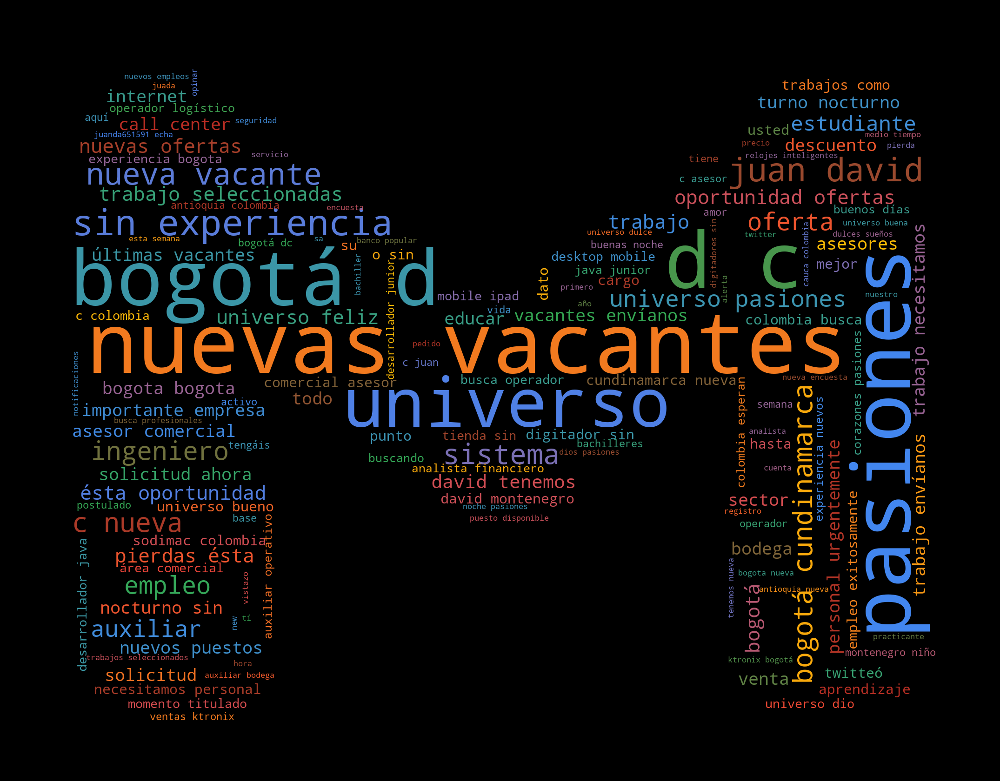

In [65]:
# Crear un string que contendrá todas las palabras
total_subjects = ' '
stopwords = STOPWORDS.update(['al','de','en','tu','s','la','y','que','te','lo','el','la','solo','del','por','qué','que','ha','desde',
                             'por','ya','más','es','con','tus','para','se','los','un','una','las','esto','va','sobre','ti','los',
                             'sandro','agama','está','tienes notificaciones','este','día','hola','hoy'])
mask = np.array(Image.open('C:/Users/user/Desktop/Data Analisis/gmail.jpg'))

# Obtener y acumular todas los subjects de los correos
for mensaje in email_df['Subject'].values:
    subjects = str(mensaje).lower().split() # Obtener las palabras en minúscula de cada subject
    for subject in subjects:
        total_subjects = total_subjects + subject + ' ' # Acumular todas los subjects

wordcloud = WordCloud(scale=2.5, width = 1000, height = 800, 
                      background_color ='black',
                      mask = mask,
                      colormap=gmail,
                      stopwords = stopwords, 
                      min_font_size = 6).generate(total_subjects) 

# Plotear la nube de palabras más usadas
wordcloud.to_image()

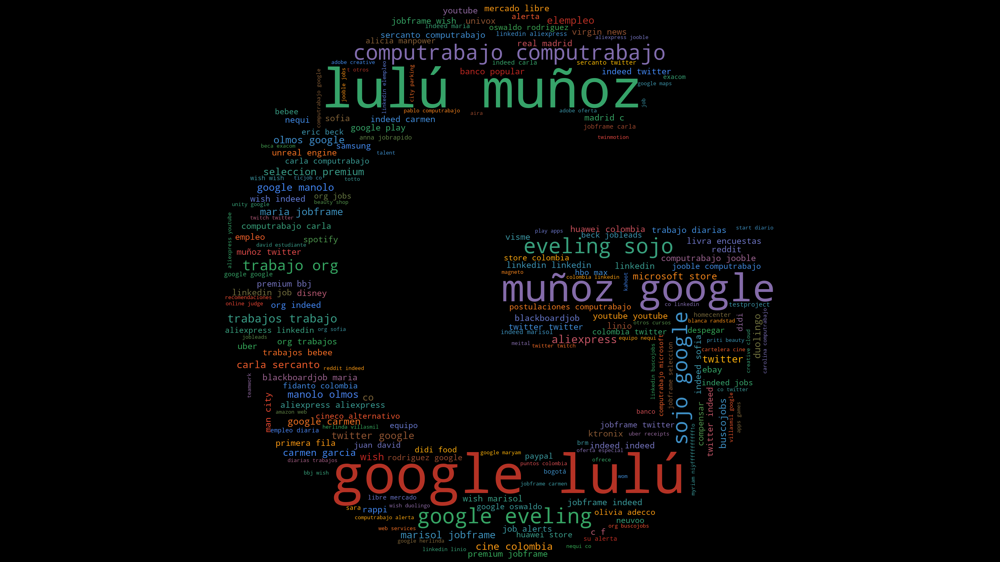

In [67]:
# Crear un string que contendrá todas las palabras
total_subjects = ' '
stopwords = STOPWORDS.update(['al','de','en','tu','s','la','y','que','te','lo','el','la','solo','del','por','qué','que','ha','desde',
                             'por','ya','más','es','con','tus','para','se','los','un','una','las','esto','va','sobre','ti','los',
                             'sandro','agama','está','tienes notificaciones','este','día','hola','hoy'])
mask = np.array(Image.open('C:/Users/user/Desktop/Data Analisis/Logo_Google.jpg'))

# Obtener y acumular todas los subjects de los correos
for mensaje in email_df['Name'].values:
    subjects = str(mensaje).lower().split() # Obtener las palabras en minúscula de cada subject
    for subject in subjects:
        total_subjects = total_subjects + subject + ' ' # Acumular todas los subjects

wordcloud = WordCloud(scale=2.5, width = 1000, height = 800, 
                      background_color ='black',
                      mask = mask,
                      colormap=gmail,
                      stopwords = stopwords, 
                      min_font_size = 6).generate(total_subjects) 

# Plotear la nube de palabras más usadas
wordcloud.to_image()